In [1]:
# make sure this is running in the right environment!! caiman, NOT caiman_test!
from IPython import get_ipython
import logging
import matplotlib.pyplot as plt
import numpy as np
import os
import shutil
from scipy.ndimage import gaussian_filter
from tifffile.tifffile import imwrite,imread,imsave
from skimage import measure as sm
import seaborn as sns

import SimpleITK as sitk
import h5py

import largestinteriorrectangle as lir
import matplotlib.patches as pac
from copy import deepcopy

from scipy import io as sio
from scipy import interpolate as si
from scipy import signal as sg
from scipy import stats as ss
from scipy import spatial as sp
from skimage import measure as sm
from skimage import metrics as sme
from skimage import transform as st
from skimage import feature as sf
from scipy.sparse import csc_matrix

from tqdm.auto import tqdm,trange
#%load_ext memory_profiler

from pathlib import Path
import pickle

import cv2
import multiprocessing
from joblib import Parallel, delayed
from joblib.externals.loky import get_reusable_executor

import caiman as cm
from caiman.utils.visualization import nb_view_patches3d
from caiman.source_extraction.cnmf import cnmf,params
from caiman.utils.visualization import view_quilt,get_contours
from caiman.paths import caiman_datadir

try:
    if __IPYTHON__:
        get_ipython().run_line_magic('load_ext', 'autoreload')
        get_ipython().run_line_magic('autoreload', '2')
except NameError:
    pass

import bokeh.plotting as bpl
bpl.output_notebook()

logging.basicConfig(format=
                          "%(relativeCreated)12d [%(filename)s:%(funcName)20s():%(lineno)s] [%(process)d] %(message)s",
                    # filename="/tmp/caiman.log",
                    level=logging.WARNING)

Loading BokehJS ...

In [2]:
#optimizing things from here - actually just stick with joblib/loky and take the L on timing - might not even be a CPU issue but data saving?
import contextlib
import joblib
from tqdm import tqdm

@contextlib.contextmanager
def tqdm_joblib(tqdm_object):
    """Context manager to patch joblib to report into tqdm progress bar given as argument"""
    class TqdmBatchCompletionCallback(joblib.parallel.BatchCompletionCallBack):
        def __call__(self, *args, **kwargs):
            tqdm_object.update(n=self.batch_size)
            return super().__call__(*args, **kwargs)

    old_batch_callback = joblib.parallel.BatchCompletionCallBack
    joblib.parallel.BatchCompletionCallBack = TqdmBatchCompletionCallback
    try:
        yield tqdm_object
    finally:
        joblib.parallel.BatchCompletionCallBack = old_batch_callback
        tqdm_object.close()

In [3]:
# first part of S1 - 50-50 vs 100% Matrigel tiling movies - remember that here only the strain matters (translation is mostly artifact)
data_50 = [r'\211103_PZ1\chunks\well1',
          r'\211103_PZ1\chunks\well2',
          r'\211103_PZ1\chunks\well3',
          r'\211103_PZ1\chunks\well4',
          r'\211103_PZ1\chunks\well5',
          r'\211103_PZ1\chunks\well6']
          #r'\211110_PZ1\chunks\well1',
          #r'\211110_PZ1\chunks\well2',
          #r'\211110_PZ1\chunks\well3',
          #r'\211112_PZ1\chunks\well2',
          #r'\211112_PZ1\chunks\well3']
ref_50 = []

data_100 = [r'\211104_PZ1\chunks\well1',
           r'\211104_PZ1\chunks\well2',
           r'\211104_PZ1\chunks\well3',
           r'\211104_PZ1\chunks\well4',
           r'\211104_PZ1\chunks\well5',
           r'\211104_PZ1\chunks\well6']
           #r'\211109_PZ1\chunks\well2',
           #r'\211109_PZ1\chunks\well6',
           #r'\211111_PZ1\chunks\well3']

ref_100 = []

timefac = 280.3262956 #number of seconds between volumes
scalefac = np.array([4,-4,9]) #multiplicative factor to get to um distance in x,y,z

headp = r'\\nasquatch\data\2p\peter\chip_tiling'
headd = r'D:\2p_data\peter\chip_tiling'

tailp = r'\segtrack\segs\ch0\10_mean__fix\cellpose_model_1_o_relab042323_flow_aniso4_st0p4_blTrue_intFalse_3DeeC\seg\prob_movie.npy'
dird = r'\segtrack\segs\ch0\10_mean__fix\cellpose_model_1_o_relab042323_flow_aniso4_st0p4_blTrue_intFalse_3DeeC\seg'

dispfs_50 = []
dispfms_50 = []
mags_50 = []
dispfs_100 = []
dispfms_100 = []
mags_100 = []

In [11]:
%%time
#data_50 values - start with displacement/strain only
for i in trange(len(data_50)):
    #i = 0
    refl = np.nan
    for j in range(len(os.listdir(headd+data_50[i]+dird))):
        if (r'toref' in os.listdir(headd+data_50[i]+dird)[j]) and (r'xydftshifts' not in os.listdir(headd+data_50[i]+dird)[j]):
            refl = j
    ref_50.append(int(os.listdir(headd+data_50[i]+dird)[j][os.listdir(headd+data_50[i]+dird)[j].find(r'toref')+5:-4]))
    
    circ = imread(headp+data_50[i]+dird+r'\prob_movie_tmax_blur_circle.tif').transpose([0,2,1])
    f = h5py.File(os.path.join(headd+data_50[i]+dird,os.listdir(headd+data_50[i]+dird)[refl]),'r')
    disp = np.array(f.get('dispsdemref'))
    dispf = (disp.transpose([2,3,4,1,0])*scalefac).transpose([3,4,0,1,2])
    dispf = (dispf-dispf[0,...])*(st.rescale(circ,(1,0.25,0.25))>circ[0,0,0])
    dispfm = np.mean(dispf.reshape(dispf.shape[0],dispf.shape[1],-1)[:,:,st.rescale(circ,(1,0.25,0.25)).flatten()>circ[0,0,0]],axis=-1)
    dispfr = (dispf.transpose([2,3,4,0,1])-dispfm).transpose([3,4,0,1,2])*(st.rescale(circ,(1,0.25,0.25))>circ[0,0,0])
    mags = []
    for i in trange(dispfr.shape[0]):
        mags.append(np.mean(np.linalg.norm(dispfr.reshape(dispfr.shape[0],dispfr.shape[1],-1)[i,...],axis=0)))
    dispfs_50.append(dispf)
    dispfms_50.append(dispfm)
    mags_50.append(mags)

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/118 [00:00<?, ?it/s]

  0%|          | 0/118 [00:00<?, ?it/s]

  0%|          | 0/118 [00:00<?, ?it/s]

  0%|          | 0/118 [00:00<?, ?it/s]

  0%|          | 0/118 [00:00<?, ?it/s]

  0%|          | 0/118 [00:00<?, ?it/s]

CPU times: total: 3min 48s
Wall time: 4min 21s


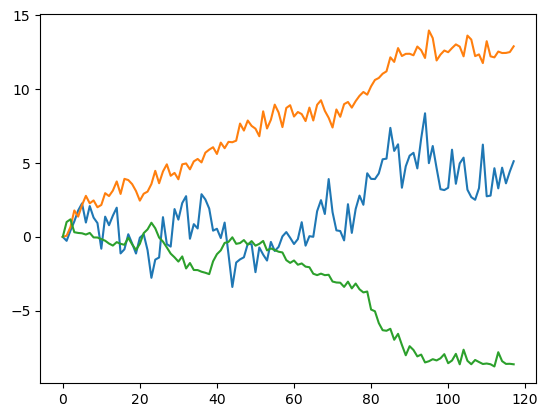

In [12]:
i = 0
plt.plot(dispfms_50[i]-dispfms_50[i][0,...])

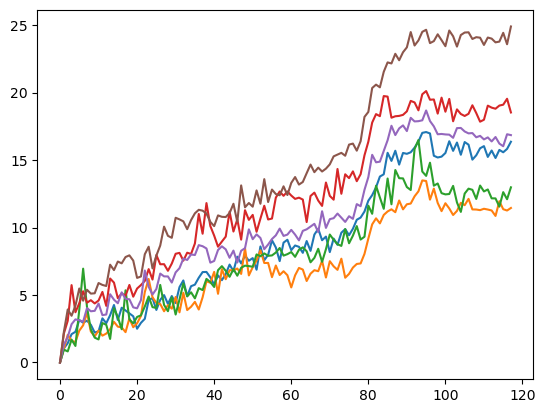

In [13]:
for i in range(len(ref_50)):
    plt.plot(np.linalg.norm(dispfms_50[i]-dispfms_50[i][0,...],axis=1))
    #plt.plot(mags_50[i])

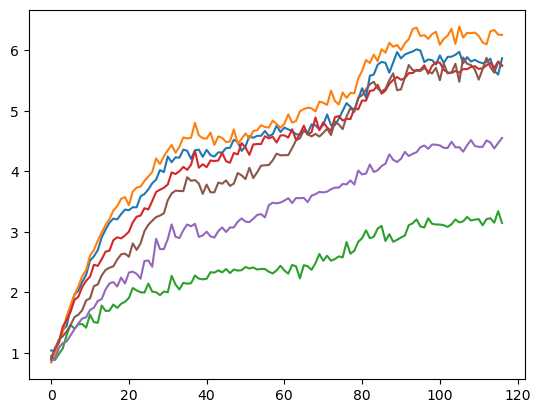

In [14]:
for i in range(len(ref_50)):
    #plt.plot(np.linalg.norm(dispfms_50[i]-dispfms_50[i][0,...],axis=1))
    plt.plot(mags_50[i][1:])

In [15]:
ref_50

[1, 1, 1, 1, 1, 1]

In [16]:
%%time
#data_100 values - start with displacement/strain only
for i in trange(len(data_100)):
    #i = 0
    refl = np.nan
    for j in range(len(os.listdir(headd+data_100[i]+dird))):
        if (r'toref' in os.listdir(headd+data_100[i]+dird)[j]) and (r'xydftshifts' not in os.listdir(headd+data_100[i]+dird)[j]):
            refl = j
    ref_100.append(int(os.listdir(headd+data_100[i]+dird)[j][os.listdir(headd+data_100[i]+dird)[j].find(r'toref')+5:-4]))
    
    circ = imread(headp+data_100[i]+dird+r'\prob_movie_tmax_blur_circle.tif').transpose([0,2,1])
    f = h5py.File(os.path.join(headd+data_100[i]+dird,os.listdir(headd+data_100[i]+dird)[refl]),'r')
    disp = np.array(f.get('dispsdemref'))
    dispf = (disp.transpose([2,3,4,1,0])*scalefac).transpose([3,4,0,1,2])
    dispf = (dispf-dispf[0,...])*(st.rescale(circ,(1,0.25,0.25))>circ[0,0,0])
    dispfm = np.mean(dispf.reshape(dispf.shape[0],dispf.shape[1],-1)[:,:,st.rescale(circ,(1,0.25,0.25)).flatten()>circ[0,0,0]],axis=-1)
    dispfr = (dispf.transpose([2,3,4,0,1])-dispfm).transpose([3,4,0,1,2])*(st.rescale(circ,(1,0.25,0.25))>circ[0,0,0])
    mags = []
    for i in trange(dispfr.shape[0]):
        mags.append(np.mean(np.linalg.norm(dispfr.reshape(dispfr.shape[0],dispfr.shape[1],-1)[i,...],axis=0)))
    dispfs_100.append(dispf)
    dispfms_100.append(dispfm)
    mags_100.append(mags)

  0%|          | 0/6 [00:00<?, ?it/s]

  0%|          | 0/118 [00:00<?, ?it/s]

  0%|          | 0/118 [00:00<?, ?it/s]

  0%|          | 0/118 [00:00<?, ?it/s]

  0%|          | 0/118 [00:00<?, ?it/s]

  0%|          | 0/118 [00:00<?, ?it/s]

  0%|          | 0/118 [00:00<?, ?it/s]

CPU times: total: 4min 6s
Wall time: 4min 36s


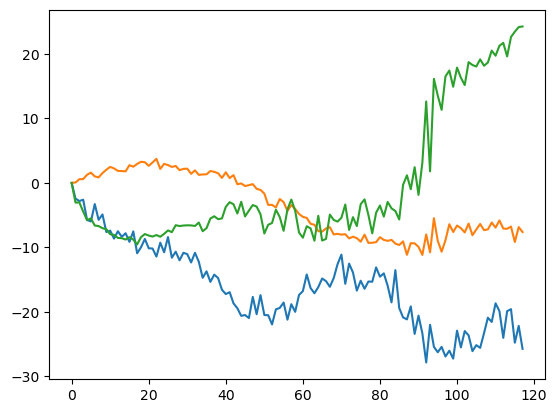

In [17]:
i = 0
plt.plot(dispfms_100[i]-dispfms_100[i][0,...])

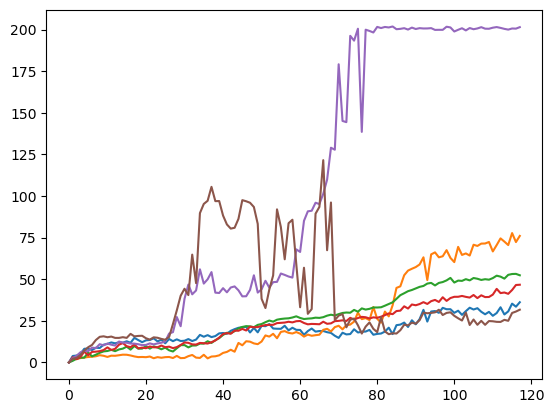

In [18]:
for i in range(len(ref_100)):
    plt.plot(np.linalg.norm(dispfms_100[i]-dispfms_100[i][0,...],axis=1))
    #plt.plot(mags_50[i])

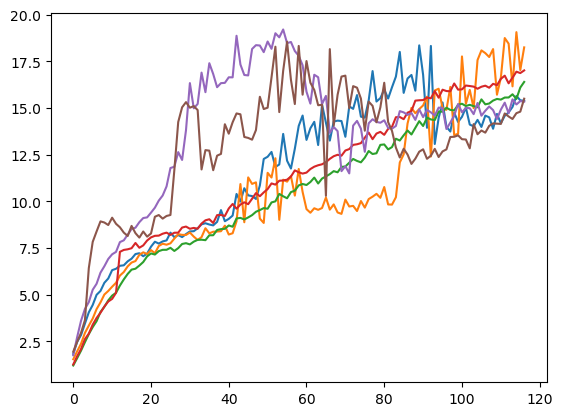

In [19]:
for i in range(len(ref_100)):
    #plt.plot(np.linalg.norm(dispfms_100[i]-dispfms_100[i][0,...],axis=1))
    plt.plot(mags_100[i][1:])

In [20]:
ref_100

[1, 1, 1, 1, 1, 1]

In [ ]:
# finish plots using timefac in t-axis, exclude the unstable runs

In [768]:
r = 2
dispfs_100[r].shape

(118, 3, 30, 199, 128)

In [24]:
prm = np.load(headp+data_100[r]+tailp,mmap_mode='r+')
print(prm.shape)

(118, 30, 512, 796)


In [25]:
dispfms_100[r].shape

(118, 3)

In [26]:
x,y = np.meshgrid(np.arange(5,dispfs_100[r].shape[3],10),np.arange(5,dispfs_100[r].shape[4],10))

In [27]:
y.shape

(13, 20)

In [28]:
np.arange(5,dispfs_100[r].shape[3],10)

array([  5,  15,  25,  35,  45,  55,  65,  75,  85,  95, 105, 115, 125,
       135, 145, 155, 165, 175, 185, 195])

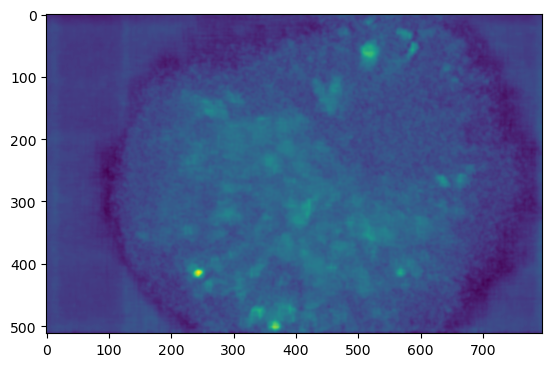

In [29]:
t = 100
b = 25
plt.imshow(prm[0,b,...])

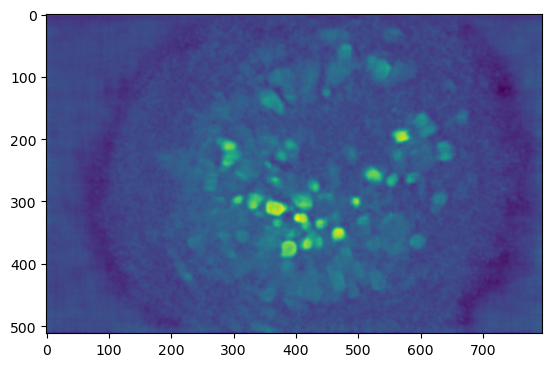

In [30]:
plt.imshow(prm[t,b,...])

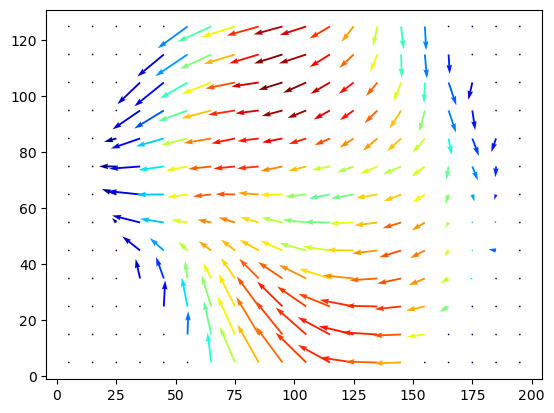

In [34]:
plt.quiver(x,y,dispfs_100[r][t,0,b,5::10,5::10].T,dispfs_100[r][t,1,b,5::10,5::10].T,dispfs_100[r][t,2,b,5::10,5::10].T,cmap=plt.cm.jet)

In [32]:
dispfr = (dispfs_100[r].transpose([2,3,4,0,1])-dispfms_100[r]).transpose([3,4,0,1,2])*(st.rescale(imread(headp+data_100[r]+dird+r'\prob_movie_tmax_blur_circle.tif').transpose([0,2,1]),(1,0.25,0.25))>imread(headp+data_100[r]+dird+r'\prob_movie_tmax_blur_circle.tif').transpose([0,2,1])[0,0,0])

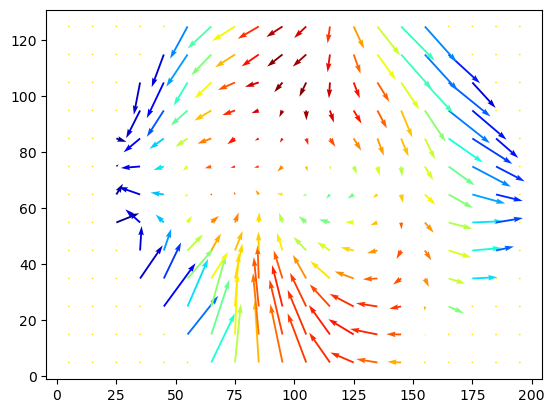

In [33]:
plt.quiver(x,y,dispfr[t,0,b,5::10,5::10].T,dispfr[t,1,b,5::10,5::10].T,dispfr[t,2,b,5::10,5::10].T,cmap=plt.cm.jet)

In [35]:
# second part of S1 - +/- KOH dipping movies - remember that here mainly the translation matters, strain is confounded by translation
data_nk_50m_s = [r'\211009_PK4\wells001',
                 r'\211022_PK5\wells001',
                 r'\211026_DT2\wells001',
                 r'\211027_DT2\wells001',
                 r'\211122_DT1\wells001',
                 r'\211124_PK2\wells001',
                 r'\211202_PK3\wells001',
                 r'\211203_PK7\wells001',
                 r'\211207_PK7\wells001',
                 r'\211209_PK6\wells001',
                 r'\211210_PL4_warped\wells001',
                 r'\211213_PK5\wells001',
                 r'\211214_PK6\wells001',
                 r'\211215_DT2\wells001',
                 r'\211222_PK8\wells001']
ref_nk_50m_s = []

data_nk_50m_ns = [r'\220125_PK9\wells001',
                  r'\220126_PK8\wells001',
                  r'\220127_PK9\wells001',
                  r'\220203_PK9\wells001',
                  r'\220207_PK5\wells001',
                  r'\220208_PK8\wells001',
                  r'\220210_PK7\wells001',
                  r'\220211_PK8\wells001',
                  r'\220304_PL7\wells001']
ref_nk_50m_ns = []

data_k_50m = [r'\20220811_PL18\wells001',
              r'\20220811_PL30\wells001',
              r'\20220817_PL27\wells001',
              r'\20220817_PL31\wells001']
ref_k_50m = []

data_k_60m = [r'\20220830_PL24\wells001',
              r'\20220830_PL32\wells001']
ref_k_60m = []

data_k_40m_s = [r'\20220906_PL24\wells001',
                r'\20220907_PL27\wells001',
                r'\20220914_PL21\wells001',
                r'\20220915_PL29\wells001',
                r'\20220921_PL25\wells001',
                r'\20220930_PL34\wells001',
                r'\20221013_PL33\wells001',
                r'\20221014_PL36\wells001',
                r'\20221101_PL42\wells001',
                r'\20221102_PL44\wells001',
                r'\20230819_PL43\wells001',
                r'\20230819_PL62\wells001',
                r'\20230821_PL57\wells001']
ref_k_40m_s = []

data_k_40m_ns52 = [r'\20220831_PL27\wells001',
                   r'\20220831_PL31\wells001',
                   r'\20221103_PL38\wells001',
                   r'\20221103_PL47\wells001',
                   r'\20221104_PL45\wells001',
                   r'\20221115_PL42\wells001',
                   r'\20221116_PL44\wells001',
                   r'\20221118_PL28\wells001',
                   r'\20221129_PL28\wells001',
                   r'\20230823_PL28\wells001',
                   r'\20230823_PL48\wells001',
                   r'\20230823_PL61\wells001',
                   r'\20230825_PL39\wells001',
                   r'\20230825_PL57\wells001']
ref_k_40m_ns52 = []

data_k_40m_ns31 = [r'\20230915_PL52\wells001',
                   r'\20230916_PL48\wells001',
                   r'\20230916_PL54\wells001',
                   r'\20230920_PL58\wells001',
                   r'\20230922_PL28\wells001',
                   r'\20230923_PL35\wells001',
                   r'\20230925_PL58\wells001',
                   r'\20230926_PL56\wells001',
                   r'\20230927_PL34\wells001',
                   r'\20230927_PL58\wells001']
ref_k_40m_ns31 = []

timefac52 = 112.28 #100 #number of seconds between volumes
timefac31 = 72.68 #60
scalefac = np.array([4,-4,9]) #multiplicative factor to get to um distance in x,y,z, will only be different for the 10 slice movies with 561x495

headp_nk = r'\\anastasia\data\2p\david\dipping_only\6plex'
headp_k = r'\\nasquatch\data\2p\peter\dipping'
headd_nk = r'D:\2p_data\david\dipping_only\6plex'
headd_k = r'D:\2p_data\peter\dipping'

tailp52 = r'\segtrack\segs\ch0\52_mean__\cellpose_model_1_o_relab042323_flow_aniso4_st0p4_blTrue_intFalse_3DeeC\seg\prob_movie.npy'
tailp31 = r'\segtrack\segs\ch0\31_mean__\cellpose_model_1_o_relab042323_flow_aniso4_st0p4_blTrue_intFalse_3DeeC\seg\prob_movie.npy'
dird52 = r'\segtrack\segs\ch0\52_mean__\cellpose_model_1_o_relab042323_flow_aniso4_st0p4_blTrue_intFalse_3DeeC\seg'
dird31 = r'\segtrack\segs\ch0\31_mean__\cellpose_model_1_o_relab042323_flow_aniso4_st0p4_blTrue_intFalse_3DeeC\seg'

dispfs_nk_50m_s = []
dispfms_nk_50m_s = []
mags_nk_50m_s = []
dispfs_nk_50m_ns = []
dispfms_nk_50m_ns = []
mags_nk_50m_ns = []
dispfs_k_50m = []
dispfms_k_50m = []
mags_k_50m = []
dispfs_k_60m = []
dispfms_k_60m = []
mags_k_60m = []
dispfs_k_40m_s = []
dispfms_k_40m_s = []
mags_k_40m_s = []
dispfs_k_40m_ns52 = []
dispfms_k_40m_ns52 = []
mags_k_40m_ns52 = []
dispfs_k_40m_ns31 = []
dispfms_k_40m_ns31 = []
mags_k_40m_ns31 = []

In [36]:
i = 0
refl = np.nan
for j in range(len(os.listdir(headd_nk+data_nk_50m_s[i]+dird52))):
    if (r'toref' in os.listdir(headd_nk+data_nk_50m_s[i]+dird52)[j]) and (r'xydftshifts' not in os.listdir(headd_nk+data_nk_50m_s[i]+dird52)[j]):
        refl = j
print(int(os.listdir(headd_nk+data_nk_50m_s[i]+dird52)[refl][os.listdir(headd_nk+data_nk_50m_s[i]+dird52)[refl].find(r'toref')+5:-4]))

circ = imread(headp_nk+data_nk_50m_s[i]+dird52+r'\prob_movie_tmax_blur_circle.tif').transpose([0,2,1])
f = h5py.File(os.path.join(headd_nk+data_nk_50m_s[i]+dird52,os.listdir(headd_nk+data_nk_50m_s[i]+dird52)[refl]),'r')
disp = np.array(f.get('dispsdemref'))
dispf = (disp.transpose([2,3,4,1,0])*scalefac).transpose([3,4,0,1,2])
dispf = (dispf-dispf[0,...])*(st.resize(circ,dispf.shape[2:])>circ[0,0,0])
dispfm = np.mean(dispf.reshape(dispf.shape[0],dispf.shape[1],-1)[:,:,st.resize(circ,dispf.shape[2:]).flatten()>circ[0,0,0]],axis=-1)
dispfr = (dispf.transpose([2,3,4,0,1])-dispfm).transpose([3,4,0,1,2])*(st.resize(circ,dispf.shape[2:])>circ[0,0,0])
mags = []
for i in trange(dispfr.shape[0]):
    mags.append(np.mean(np.linalg.norm(dispfr.reshape(dispfr.shape[0],dispfr.shape[1],-1)[i,...],axis=0)))

60


  0%|          | 0/153 [00:00<?, ?it/s]

In [37]:
dispf.shape

(153, 3, 30, 128, 113)

In [38]:
st.resize(circ,dispf.shape[2:]).shape

(30, 128, 113)

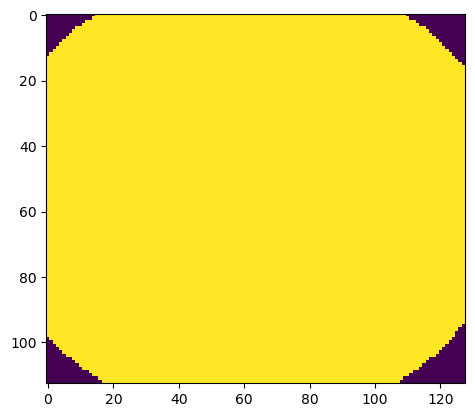

In [39]:
plt.imshow((st.resize(circ,dispf.shape[2:])>circ[0,0,0])[15,...].T)

In [40]:
dispf[100,0,15,60,60]

-8.692037615574092

In [689]:
i = 6
refl = np.nan
for j in range(len(os.listdir(headd_nk+data_nk_50m_ns[i]+dird52))):
    if (r'toref' in os.listdir(headd_nk+data_nk_50m_ns[i]+dird52)[j]) and (r'xydftshifts' not in os.listdir(headd_nk+data_nk_50m_ns[i]+dird52)[j]):
        refl = j
print(int(os.listdir(headd_nk+data_nk_50m_ns[i]+dird52)[refl][os.listdir(headd_nk+data_nk_50m_ns[i]+dird52)[refl].find(r'toref')+5:-4]))

circ = imread(headp_nk+data_nk_50m_ns[i]+dird52+r'\prob_movie_tmax_blur_circle.tif').transpose([0,2,1])
f = h5py.File(os.path.join(headd_nk+data_nk_50m_ns[i]+dird52,os.listdir(headd_nk+data_nk_50m_ns[i]+dird52)[refl]),'r')
disp = np.array(f.get('dispsdemref'))
dispf = (disp.transpose([2,3,4,1,0])*scalefac).transpose([3,4,0,1,2])
dispf = (dispf-dispf[0,...])*(st.resize(circ,dispf.shape[2:])>circ[0,0,0])
dispfm = np.mean(dispf.reshape(dispf.shape[0],dispf.shape[1],-1)[:,:,st.resize(circ,dispf.shape[2:]).flatten()>circ[0,0,0]],axis=-1)
dispfr = (dispf.transpose([2,3,4,0,1])-dispfm).transpose([3,4,0,1,2])*(st.resize(circ,dispf.shape[2:])>circ[0,0,0])
mags = []
for i in trange(dispfr.shape[0]):
    mags.append(np.mean(np.linalg.norm(dispfr.reshape(dispfr.shape[0],dispfr.shape[1],-1)[i,...],axis=0)))

60


  0%|          | 0/231 [00:00<?, ?it/s]

In [690]:
(dispf-dispf[0,...]).shape

(231, 3, 30, 128, 113)

In [691]:
dispf[59,0,0,0,0]

0.0

In [753]:
i=6
print(data_nk_50m_ns[i])
prm = np.load(r'\\anastasia\data\2p\david\dipping_only\6plex'+data_nk_50m_ns[i]+r'\segtrack\segs\ch0\52_mean__\cellpose_model_1_o_relab042323_flow_aniso4_st0p4_blTrue_intFalse_3DeeC\seg\prob_movie.npy',mmap_mode='r+')
print(prm.shape)

\220210_PK7\wells001
(231, 30, 450, 510)


In [754]:
dispfm.shape

(231, 3)

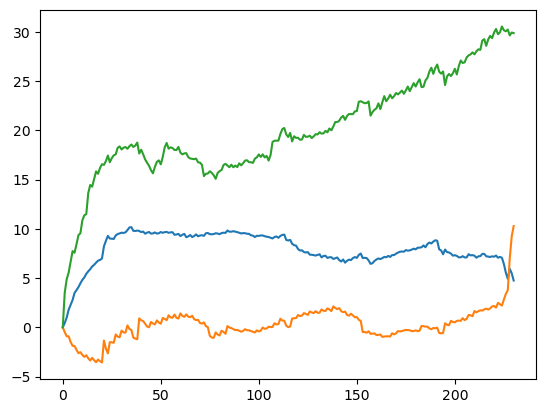

In [755]:
plt.plot(dispfm)

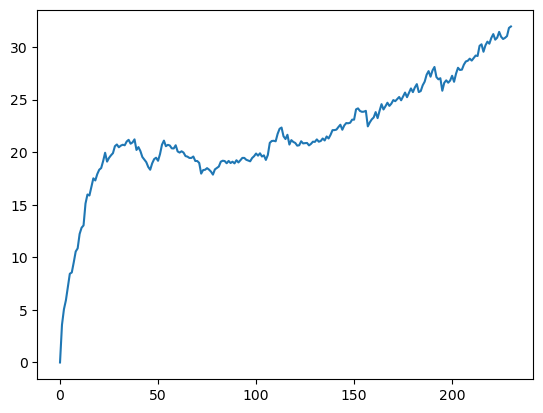

In [756]:
plt.plot(np.linalg.norm(dispfm,axis=1))

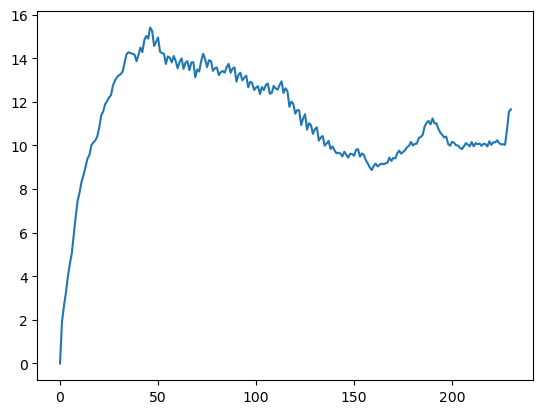

In [757]:
plt.plot(mags)

In [758]:
dispf.shape

(231, 3, 30, 128, 113)

In [759]:
circ.shape

(30, 510, 450)

In [760]:
x,y = np.meshgrid(np.arange(0,circ.shape[1],20),np.arange(0,circ.shape[2],20))

In [761]:
x2,y2 = np.meshgrid(np.median(np.arange(0,circ.shape[1],20)),np.median(np.arange(0,circ.shape[2],20)))

In [762]:
y.shape

(23, 26)

In [763]:
np.arange(0,dispf.shape[3],5)

array([  0,   5,  10,  15,  20,  25,  30,  35,  40,  45,  50,  55,  60,
        65,  70,  75,  80,  85,  90,  95, 100, 105, 110, 115, 120, 125])

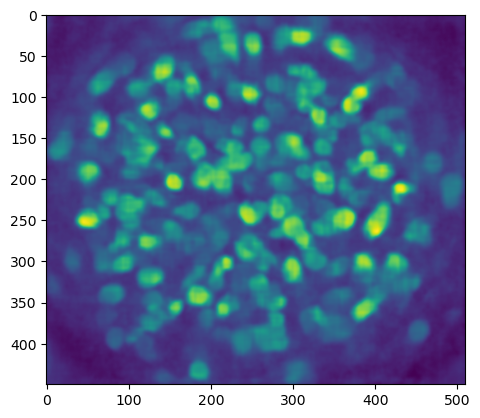

In [764]:
t = 20
b = 15
plt.imshow(prm[0,b,...])

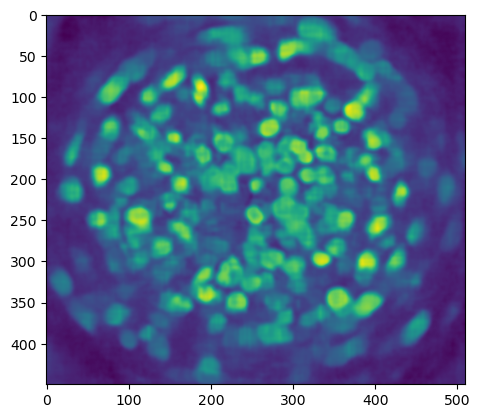

In [765]:
plt.imshow(prm[t,b,...])

In [723]:
from matplotlib.colors import ListedColormap  # for custom colormap creation

## A helper function to pull in some custom LUTs:
def get_lut(raw_url):
    """Download an ImageJ formatted (?) LUT and build MPL colormap"""
    ds = np.DataSource(None)  # needed for the numpy open method(?)
    fixed_url = raw_url.replace(" ", "%20")  # spaces in URLs not cool
    # Download the LUT file, trim parts of the table, convert to fraction:
    lut_rgb = (np.loadtxt(ds.open(fixed_url), skiprows=1)[:, -3:]) / 256
    return lut_rgb


## URLs for some excellent Blue-Orange-Purple LUTs
bop_urls = (
    "https://raw.githubusercontent.com/cleterrier/ChrisLUTs/master/BOP blue.lut",
    "https://raw.githubusercontent.com/cleterrier/ChrisLUTs/master/BOP orange.lut",
    "https://raw.githubusercontent.com/cleterrier/ChrisLUTs/master/BOP purple.lut",
)

## Download the LUTs and convert to matplotlib colormap format
bop_cmaps = []
for url in bop_urls:
    bop_cmaps.append(ListedColormap(get_lut(url)))

## URLs for some inverted LUTs
inv_urls = (
    "https://raw.githubusercontent.com/cleterrier/ChrisLUTs/master/I Cyan.lut",
    "https://raw.githubusercontent.com/cleterrier/ChrisLUTs/master/I Magenta.lut",
    "https://raw.githubusercontent.com/cleterrier/ChrisLUTs/master/I Yellow.lut",
)

## Download the LUTs and convert to matplotlib colormap format
inv_cmaps = []
for url in inv_urls:
    inv_cmaps.append(ListedColormap(get_lut(url)))

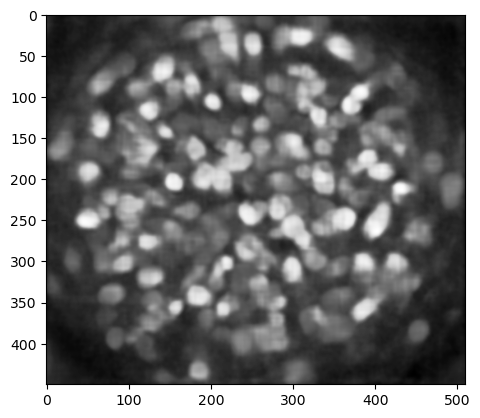

In [724]:
plt.imshow(prm[0,b,...],cmap='Greys_r')

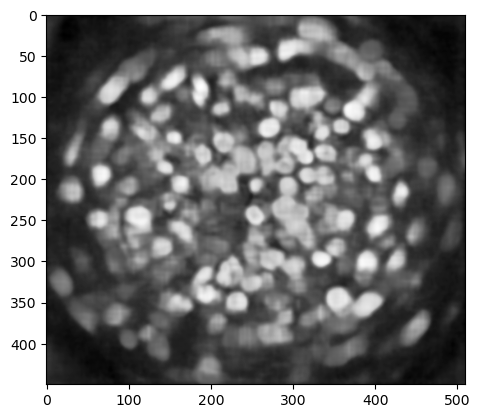

In [725]:
plt.imshow(prm[t,b,...],cmap='Greys_r')

In [726]:
prm.shape

(231, 30, 450, 510)

In [727]:
circ.shape

(30, 510, 450)

In [728]:
from matplotlib.colors import LinearSegmentedColormap
my_gradient = LinearSegmentedColormap.from_list('my_gradient', (
    # Edit this gradient at https://eltos.github.io/gradient/#40B9FF-FFEB00-FF3F41
    (0.000, (0.251, 0.725, 1.000)),
    (0.500, (1.000, 0.922, 0.000)),
    (1.000, (1.000, 0.247, 0.255))))

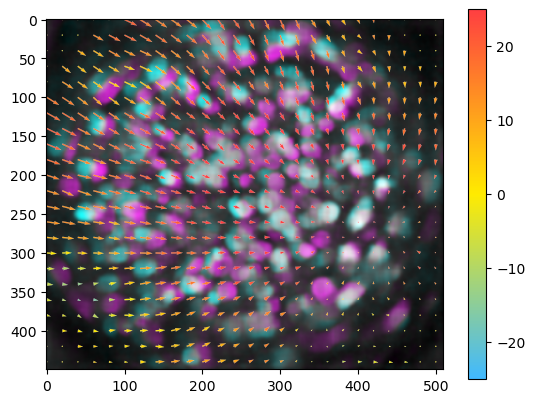

In [729]:
from microfilm import colorify
plt.imshow(colorify.multichannel_to_rgb(np.array([prm[0,b,...],prm[t,b,...],np.zeros(circ.shape[1:]).T]))[0])
qq=plt.quiver(x,y,dispf[t,0,b,::5,::5].T,dispf[t,1,b,::5,::5].T,dispf[t,2,b,::5,::5].T,cmap=my_gradient, linewidths=0.1, edgecolors='white',scale=1,scale_units='x',width=0.003,clim=[-25,25])
plt.colorbar()

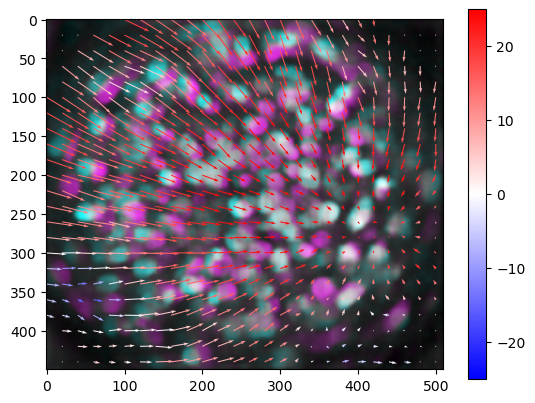

In [745]:
from microfilm import colorify
plt.imshow(colorify.multichannel_to_rgb(np.array([prm[0,b,...],prm[t,b,...],np.zeros(circ.shape[1:]).T]))[0])
qq=plt.quiver(x,y,dispf[t,0,b,::5,::5].T,dispf[t,1,b,::5,::5].T,dispf[t,2,b,::5,::5].T,cmap=sns.color_palette("bwr", as_cmap=True), linewidths=0.03, edgecolors='white',scale=1/2,scale_units='x',clim=[-25,25])
plt.colorbar()

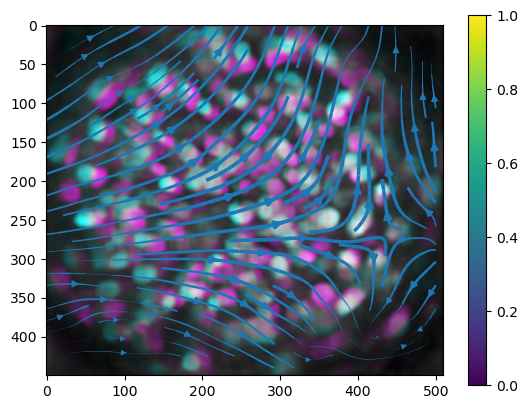

In [752]:
from microfilm import colorify
plt.imshow(colorify.multichannel_to_rgb(np.array([prm[0,b,...],prm[t,b,...],np.zeros(circ.shape[1:]).T]))[0])
qq=plt.streamplot(x,y,dispf[t,0,b,::5,::5].T,dispf[t,1,b,::5,::5].T,linewidth=dispf[t,2,b,::5,::5].T/10)
plt.colorbar()

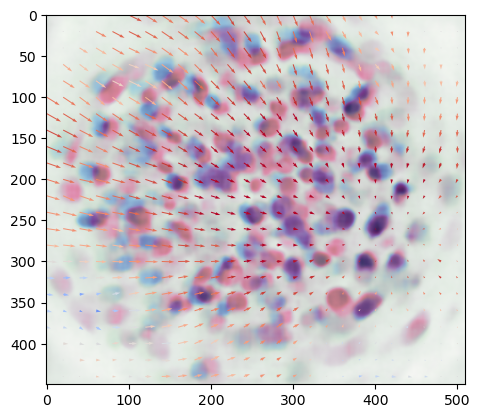

In [731]:
plt.imshow((prm[0,b,...]),cmap='GnBu',alpha=1)
plt.imshow((prm[t,b,...]),cmap='PuRd',alpha=0.5)
qq=plt.quiver(x,y,dispf[t,0,b,::5,::5].T,dispf[t,1,b,::5,::5].T,dispf[t,2,b,::5,::5].T,cmap=plt.cm.coolwarm,scale=1,scale_units='x',clim=[-25,25])
#plt.clim=(-10,10)

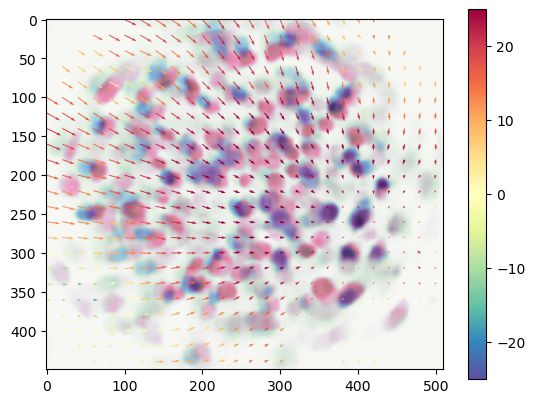

In [732]:
plt.imshow(((prm[0,b,...]+25)*(prm[0,b,...]>-25)),cmap='GnBu',alpha=1)
plt.imshow(((prm[t,b,...]+25)*(prm[t,b,...]>-25)),cmap='PuRd',alpha=0.5)
qq=plt.quiver(x,y,dispf[t,0,b,::5,::5].T,dispf[t,1,b,::5,::5].T,dispf[t,2,b,::5,::5].T,cmap=plt.cm.Spectral_r,scale=1,scale_units='x',clim=[-25,25])
#plt.clim=(-10,10)
plt.colorbar()

In [733]:
dispf.shape

(231, 3, 30, 128, 113)

In [734]:
x.shape

(23, 26)

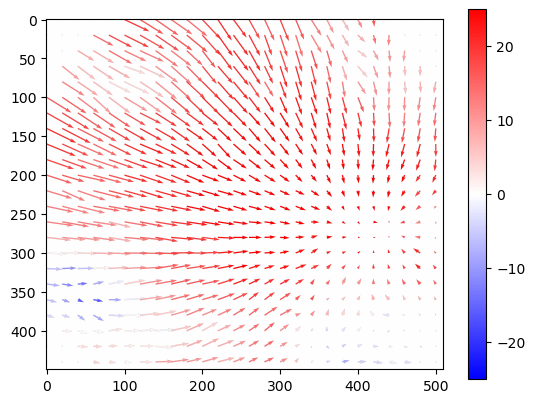

In [744]:
plt.imshow(np.zeros(circ.shape[1:]).T,vmin=-10,vmax=10,cmap='bwr')
qq=plt.quiver(x,y,dispf[t,0,b,::5,::5].T,dispf[t,1,b,::5,::5].T,dispf[t,2,b,::5,::5].T,cmap=plt.cm.bwr, linewidths=0.03, edgecolors='black',scale=1/2,scale_units='x',width=0.003,clim=[-25,25])
plt.colorbar()

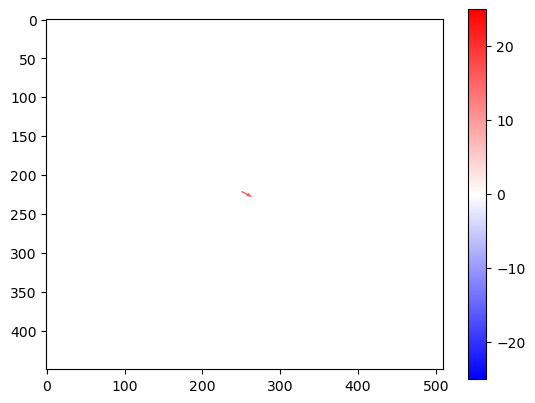

In [743]:
plt.imshow(np.zeros(circ.shape[1:]).T,vmin=-10,vmax=10,cmap='bwr')
qq=plt.quiver(x2,y2,np.array(dispfm[t,0]),np.array(dispfm[t,1]),np.array(dispfm[t,2]),cmap=plt.cm.bwr, linewidths=0.03, edgecolors='black',scale=1/2,scale_units='x',width=0.003,clim=[-25,25])
plt.colorbar()

In [737]:
dispfm[t,...]

array([ 6.99081198, -3.56119027, 16.55916601])

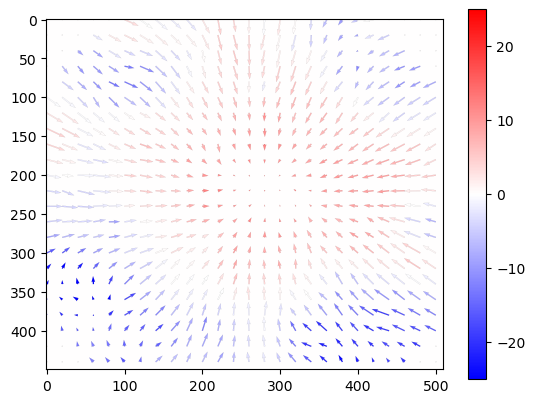

In [738]:
plt.imshow(np.zeros(circ.shape[1:]).T,vmin=-10,vmax=10,cmap='bwr')
qq=plt.quiver(x,y,dispfr[t,0,b,0::5,0::5].T,dispfr[t,1,b,0::5,0::5].T,dispfr[t,2,b,0::5,0::5].T,cmap=plt.cm.bwr, linewidths=0.03, edgecolors='black',scale=1/2,scale_units='x',width=0.003,clim=[-25,25])
plt.colorbar()

In [7]:
# remaking SV1 movies - use r=4 or 5 for data_50, r=2 for data_100 - then remove slow brightness trend (and also make probmap movies)
# also - make one for 50-50 gel 211123_PZ1 well6! append it and call data_50[6]!
data_50.append(r'\211123_PZ1\chunks\well6')
r = 6
tailm = r'\segtrack\tiffs\ch0\10_mean__fix\means_movie.npy'
headp+data_50[r]+tailm

'\\\\nasquatch\\data\\2p\\peter\\chip_tiling\\211123_PZ1\\chunks\\well6\\segtrack\\tiffs\\ch0\\10_mean__fix\\means_movie.npy'

In [6]:
data_50[0]

'\\211103_PZ1\\chunks\\well1'

In [8]:
tailp

'\\segtrack\\segs\\ch0\\10_mean__fix\\cellpose_model_1_o_relab042323_flow_aniso4_st0p4_blTrue_intFalse_3DeeC\\seg\\prob_movie.npy'

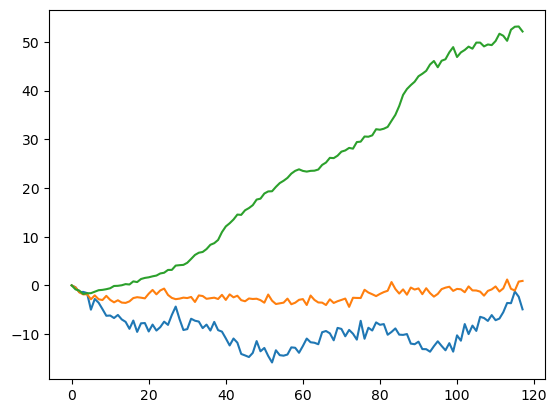

In [845]:
plt.plot(dispfms_100[r])

In [10]:
i = r

circ = imread(headp+data_50[i]+dird+r'\prob_movie_tmax_blur_circle.tif').transpose([0,2,1])
f = h5py.File(os.path.join(headd+data_50[i]+dird,os.listdir(headd+data_50[i]+dird)[1]),'r')
disp = np.array(f.get('dispsdemref'))

dispxyz = np.mean(disp.reshape(disp.shape[0],disp.shape[1],-1)[:,:,st.rescale(circ,(1,0.25,0.25)).flatten()>circ[0,0,0]],axis=-1)

#dispf = (disp.transpose([2,3,4,1,0])*scalefac).transpose([3,4,0,1,2])
#dispf = (dispf-dispf[0,...])*(st.rescale(circ,(1,0.25,0.25))>circ[0,0,0])
#dispfm = np.mean(dispf.reshape(dispf.shape[0],dispf.shape[1],-1)[:,:,st.rescale(circ,(1,0.25,0.25)).flatten()>circ[0,0,0]],axis=-1)

In [11]:
os.listdir(headd+data_50[i]+dird)[1]

'prob_movie_scale4AFS2PL4_dispdemons_toref1.mat'

In [12]:
Ymo = np.load(headp+data_50[r]+tailm,mmap_mode='r+')
Ypm = np.load(headp+data_50[r]+tailp,mmap_mode='r+')
print(Ymo.shape)
print(Ypm.shape)

(78, 30, 512, 796)
(78, 30, 512, 796)


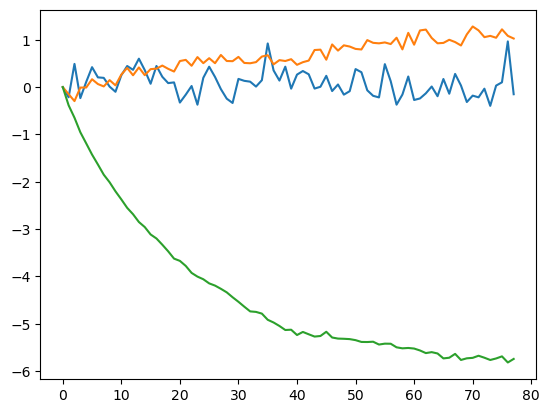

In [13]:
plt.plot(dispxyz.T)

In [14]:
Ymoz = np.zeros((dispxyz.shape[1],Ymo.shape[1],Ymo.shape[2],Ymo.shape[3]))
Ypmz = np.zeros((dispxyz.shape[1],Ypm.shape[1],Ypm.shape[2],Ypm.shape[3]))
for i in trange(dispxyz.shape[1]):
    trans = sitk.TranslationTransform(3, np.array([4*dispxyz[0,i],4*dispxyz[1,i],dispxyz[2,i]]))
    #trans.SetInterpolator(sitk.sitkLinear)
    Ymoz[i,...] = sitk.GetArrayFromImage(sitk.Resample(sitk.GetImageFromArray(Ymo[i,...]),trans))
    Ypmz[i,...] = sitk.GetArrayFromImage(sitk.Resample(sitk.GetImageFromArray(Ypm[i,...]),trans))

  0%|          | 0/78 [00:00<?, ?it/s]

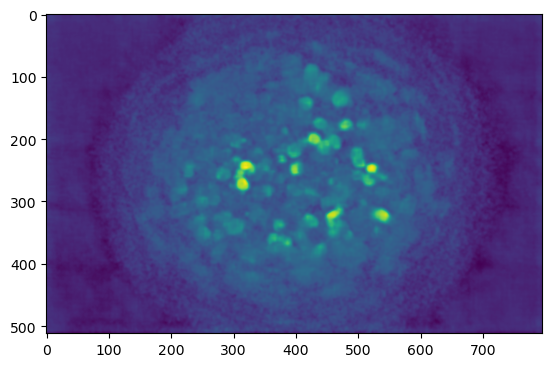

In [15]:
plt.imshow(Ypm[0,15,...])

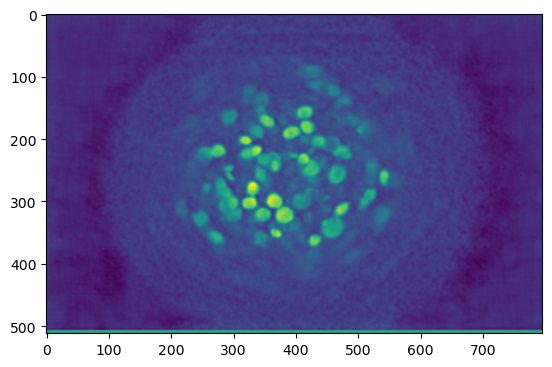

In [25]:
plt.imshow(Ypmz[70,6,...])

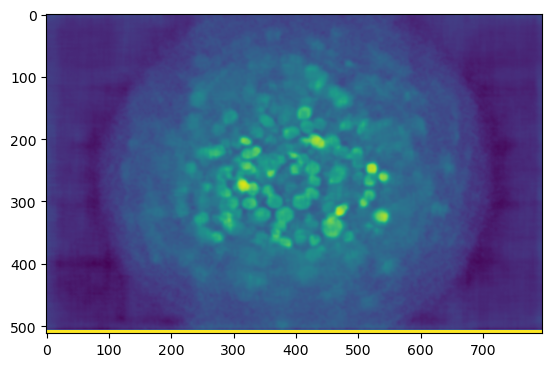

In [18]:
plt.imshow(np.mean(Ypmz[70,5:25,...],axis=0))

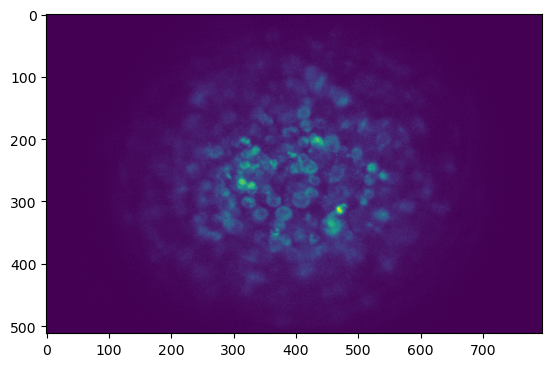

In [19]:
plt.imshow(np.mean(Ymoz[0,5:25,...],axis=0))

In [26]:
# for consistency with prior description - mean both probmap and signal over 20 planes
# _50 r=4: 5:25
# _50 r=5: 4:24
# _100 r=2: 4:24
# _50 r=: 6:26
Ymozm = np.mean(Ymoz[:,6:26,...],axis=1)
Ypmzm = np.mean(Ypmz[:,6:26,...],axis=1)

In [28]:
sav_base = r'\\nasquatch\data\2p\peter\grin_videos\s12_outputs'
fbase = r'\211123_PZ1_well6'

In [27]:
data_50[r]

'\\211123_PZ1\\chunks\\well6'

In [29]:
sav_base+fbase+r'_Ymozm.tif'

'\\\\nasquatch\\data\\2p\\peter\\grin_videos\\s12_outputs\\211123_PZ1_well6_Ymozm.tif'

In [30]:
imwrite(sav_base+fbase+r'_Ymozm.tif',Ymozm)
imwrite(sav_base+fbase+r'_Ypmzm.tif',Ypmzm)

In [34]:
# resample 211123 up in time to match the others!
Ym = imread(sav_base+r'\211123_PZ1_well6_Ymozmxx-1.tif')
Yp = imread(sav_base+r'\211123_PZ1_well6_Ypmzmxx.tif')

In [37]:
Ym.shape

(78, 500, 606)

In [ ]:
# want to upsample so it has 113 time frames

In [43]:
Ym2 = np.zeros((113,Ym.shape[1],Ym.shape[2]))
Yp2 = np.zeros((113,Yp.shape[1],Yp.shape[2]))
for i in trange(Yp.shape[1]):
    for j in range(Yp.shape[2]):
        Ym2[:,i,j] = np.interp(np.arange(113),1.4464909278*np.arange(78),Ym[:,i,j])
        Yp2[:,i,j] = np.interp(np.arange(113),1.4464909278*np.arange(78),Yp[:,i,j])
Ym2.shape

  0%|          | 0/500 [00:00<?, ?it/s]

(113, 500, 606)

In [44]:
imwrite(sav_base+r'\211123_PZ1_well6_Ymozmxx-1up.tif',Ym2)
imwrite(sav_base+r'\211123_PZ1_well6_Ypmzmxxup.tif',Yp2)

In [71]:
%%time
#data_nk_50m_s values - start with displacement/strain only
for i in trange(len(data_nk_50m_s)):
    #i = 0
    refl = np.nan
    for j in range(len(os.listdir(headd_nk+data_nk_50m_s[i]+dird52))):
        if (r'toref' in os.listdir(headd_nk+data_nk_50m_s[i]+dird52)[j]) and (r'xydftshifts' not in os.listdir(headd_nk+data_nk_50m_s[i]+dird52)[j]):
            refl = j
    ref_nk_50m_s.append(int(os.listdir(headd_nk+data_nk_50m_s[i]+dird52)[refl][os.listdir(headd_nk+data_nk_50m_s[i]+dird52)[refl].find(r'toref')+5:-4]))
    
    circ = imread(headp_nk+data_nk_50m_s[i]+dird52+r'\prob_movie_tmax_blur_circle.tif').transpose([0,2,1])
    f = h5py.File(os.path.join(headd_nk+data_nk_50m_s[i]+dird52,os.listdir(headd_nk+data_nk_50m_s[i]+dird52)[refl]),'r')
    disp = np.array(f.get('dispsdemref'))
    dispf = (disp.transpose([2,3,4,1,0])*scalefac).transpose([3,4,0,1,2])
    dispf = (dispf-dispf[0,...])*(st.resize(circ,dispf.shape[2:])>circ[0,0,0])
    dispfm = np.mean(dispf.reshape(dispf.shape[0],dispf.shape[1],-1)[:,:,st.resize(circ,dispf.shape[2:]).flatten()>circ[0,0,0]],axis=-1)
    dispfr = (dispf.transpose([2,3,4,0,1])-dispfm).transpose([3,4,0,1,2])*(st.resize(circ,dispf.shape[2:])>circ[0,0,0])
    mags = []
    for i in trange(dispfr.shape[0]):
        mags.append(np.mean(np.linalg.norm(dispfr.reshape(dispfr.shape[0],dispfr.shape[1],-1)[i,...],axis=0)))
    dispfs_nk_50m_s.append(dispf)
    dispfms_nk_50m_s.append(dispfm)
    mags_nk_50m_s.append(mags)

  0%|          | 0/15 [00:00<?, ?it/s]

  0%|          | 0/153 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/231 [00:00<?, ?it/s]

  0%|          | 0/231 [00:00<?, ?it/s]

  0%|          | 0/231 [00:00<?, ?it/s]

  0%|          | 0/231 [00:00<?, ?it/s]

  0%|          | 0/231 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/63 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/123 [00:00<?, ?it/s]

  0%|          | 0/105 [00:00<?, ?it/s]

  0%|          | 0/45 [00:00<?, ?it/s]

CPU times: total: 5min 45s
Wall time: 7min 12s


\211022_PK5\wells001


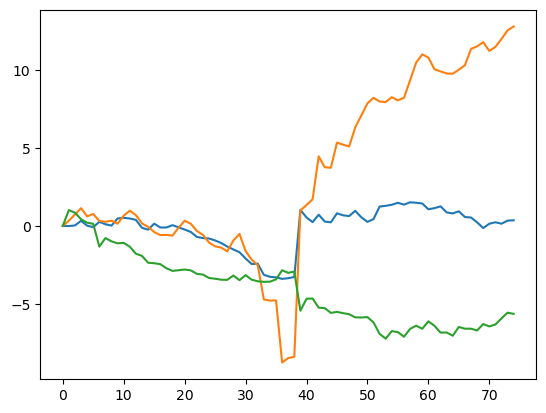

In [443]:
i = 1
print(data_nk_50m_s[i])
plt.plot(dispfms_nk_50m_s[i]-dispfms_nk_50m_s[i][0,...])

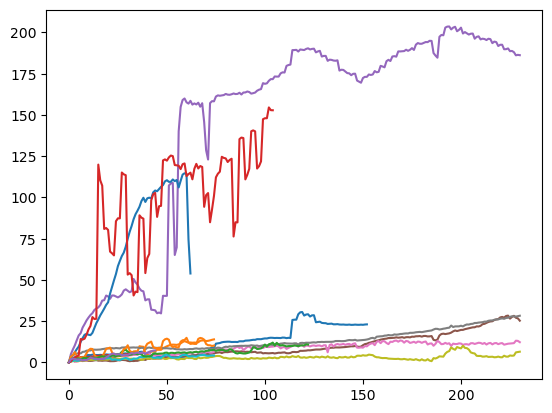

In [73]:
for i in range(len(ref_nk_50m_s)):
    plt.plot(np.linalg.norm(dispfms_nk_50m_s[i]-dispfms_nk_50m_s[i][0,...],axis=1))
    #plt.plot(mags_50[i])

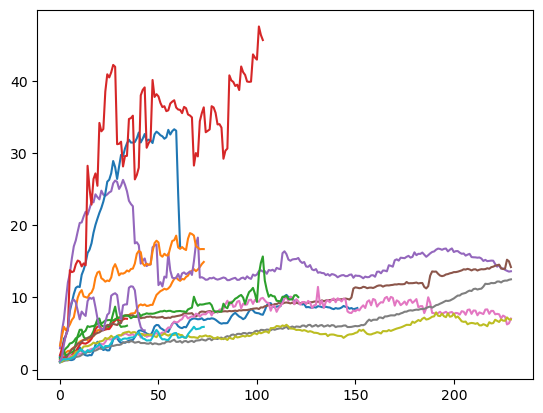

In [74]:
for i in range(len(ref_nk_50m_s)):
    #plt.plot(np.linalg.norm(dispfms_100[i]-dispfms_100[i][0,...],axis=1))
    plt.plot(mags_nk_50m_s[i][1:])

In [75]:
%%time
#data_nk_50m_ns values - start with displacement/strain only
for i in trange(len(data_nk_50m_ns)):
    #i = 0
    refl = np.nan
    for j in range(len(os.listdir(headd_nk+data_nk_50m_ns[i]+dird52))):
        if (r'toref' in os.listdir(headd_nk+data_nk_50m_ns[i]+dird52)[j]) and (r'xydftshifts' not in os.listdir(headd_nk+data_nk_50m_ns[i]+dird52)[j]):
            refl = j
    ref_nk_50m_ns.append(int(os.listdir(headd_nk+data_nk_50m_ns[i]+dird52)[refl][os.listdir(headd_nk+data_nk_50m_ns[i]+dird52)[refl].find(r'toref')+5:-4]))
    
    circ = imread(headp_nk+data_nk_50m_ns[i]+dird52+r'\prob_movie_tmax_blur_circle.tif').transpose([0,2,1])
    f = h5py.File(os.path.join(headd_nk+data_nk_50m_ns[i]+dird52,os.listdir(headd_nk+data_nk_50m_ns[i]+dird52)[refl]),'r')
    disp = np.array(f.get('dispsdemref'))
    dispf = (disp.transpose([2,3,4,1,0])*scalefac).transpose([3,4,0,1,2])
    dispf = (dispf-dispf[0,...])*(st.resize(circ,dispf.shape[2:])>circ[0,0,0])
    dispfm = np.mean(dispf.reshape(dispf.shape[0],dispf.shape[1],-1)[:,:,st.resize(circ,dispf.shape[2:]).flatten()>circ[0,0,0]],axis=-1)
    dispfr = (dispf.transpose([2,3,4,0,1])-dispfm).transpose([3,4,0,1,2])*(st.resize(circ,dispf.shape[2:])>circ[0,0,0])
    mags = []
    for i in trange(dispfr.shape[0]):
        mags.append(np.mean(np.linalg.norm(dispfr.reshape(dispfr.shape[0],dispfr.shape[1],-1)[i,...],axis=0)))
    dispfs_nk_50m_ns.append(dispf)
    dispfms_nk_50m_ns.append(dispfm)
    mags_nk_50m_ns.append(mags)

  0%|          | 0/9 [00:00<?, ?it/s]

  0%|          | 0/66 [00:00<?, ?it/s]

  0%|          | 0/130 [00:00<?, ?it/s]

  0%|          | 0/31 [00:00<?, ?it/s]

  0%|          | 0/112 [00:00<?, ?it/s]

  0%|          | 0/192 [00:00<?, ?it/s]

  0%|          | 0/120 [00:00<?, ?it/s]

  0%|          | 0/231 [00:00<?, ?it/s]

  0%|          | 0/231 [00:00<?, ?it/s]

  0%|          | 0/178 [00:00<?, ?it/s]

CPU times: total: 3min 47s
Wall time: 4min 25s


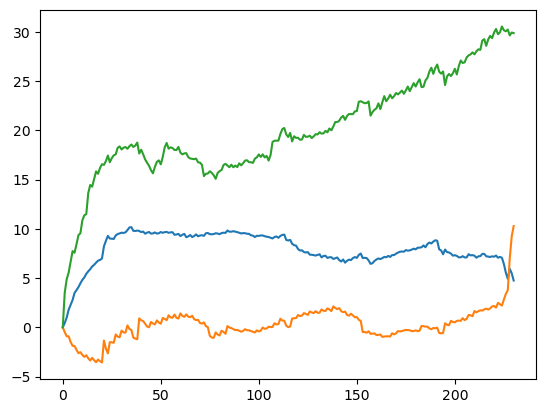

In [688]:
i = 6
plt.plot(dispfms_nk_50m_ns[i]-dispfms_nk_50m_ns[i][0,...])

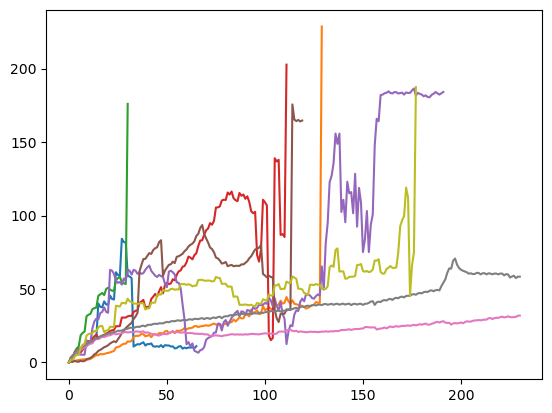

In [77]:
for i in range(len(ref_nk_50m_ns)):
    plt.plot(np.linalg.norm(dispfms_nk_50m_ns[i]-dispfms_nk_50m_ns[i][0,...],axis=1))
    #plt.plot(mags_50[i])

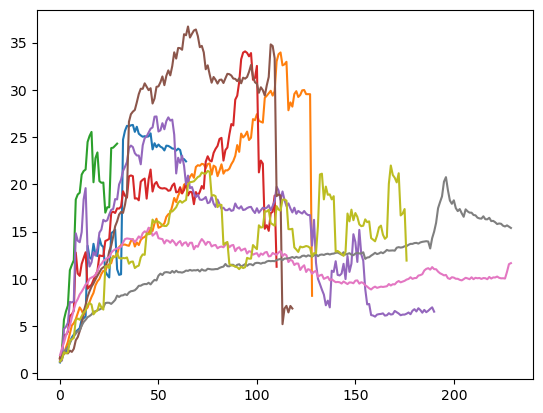

In [78]:
for i in range(len(ref_nk_50m_ns)):
    #plt.plot(np.linalg.norm(dispfms_100[i]-dispfms_100[i][0,...],axis=1))
    plt.plot(mags_nk_50m_ns[i][1:])

In [79]:
# overall 9/24 doing poorly at ~1 hr (e.g. disp over 20 at time point 30) (63% success)
# 6/9 ns poor at 1 hr (33% success)

In [80]:
%%time
#data_k_50m values - start with displacement/strain only
for i in trange(len(data_k_50m)):
    #i = 0
    refl = np.nan
    for j in range(len(os.listdir(headd_k+data_k_50m[i]+dird52))):
        if (r'toref' in os.listdir(headd_k+data_k_50m[i]+dird52)[j]) and (r'xydftshifts' not in os.listdir(headd_k+data_k_50m[i]+dird52)[j]):
            refl = j
    ref_k_50m.append(int(os.listdir(headd_k+data_k_50m[i]+dird52)[refl][os.listdir(headd_k+data_k_50m[i]+dird52)[refl].find(r'toref')+5:-4]))
    
    circ = imread(headp_k+data_k_50m[i]+dird52+r'\prob_movie_tmax_blur_circle.tif').transpose([0,2,1])
    f = h5py.File(os.path.join(headd_k+data_k_50m[i]+dird52,os.listdir(headd_k+data_k_50m[i]+dird52)[refl]),'r')
    disp = np.array(f.get('dispsdemref'))
    dispf = (disp.transpose([2,3,4,1,0])*scalefac).transpose([3,4,0,1,2])
    dispf = (dispf-dispf[0,...])*(st.resize(circ,dispf.shape[2:])>circ[0,0,0])
    dispfm = np.mean(dispf.reshape(dispf.shape[0],dispf.shape[1],-1)[:,:,st.resize(circ,dispf.shape[2:]).flatten()>circ[0,0,0]],axis=-1)
    dispfr = (dispf.transpose([2,3,4,0,1])-dispfm).transpose([3,4,0,1,2])*(st.resize(circ,dispf.shape[2:])>circ[0,0,0])
    mags = []
    for i in trange(dispfr.shape[0]):
        mags.append(np.mean(np.linalg.norm(dispfr.reshape(dispfr.shape[0],dispfr.shape[1],-1)[i,...],axis=0)))
    dispfs_k_50m.append(dispf)
    dispfms_k_50m.append(dispfm)
    mags_k_50m.append(mags)

  0%|          | 0/4 [00:00<?, ?it/s]

  0%|          | 0/96 [00:00<?, ?it/s]

  0%|          | 0/96 [00:00<?, ?it/s]

  0%|          | 0/114 [00:00<?, ?it/s]

  0%|          | 0/69 [00:00<?, ?it/s]

CPU times: total: 1min 10s
Wall time: 1min 20s


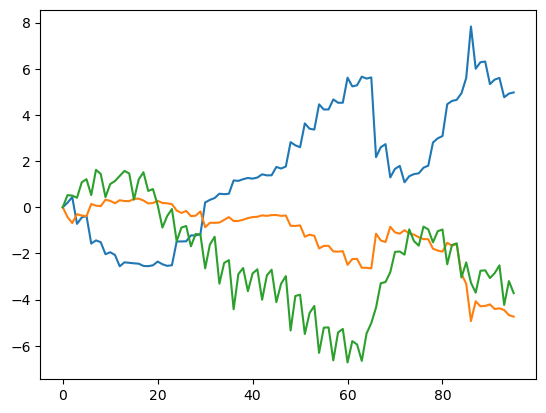

In [81]:
i = 0
plt.plot(dispfms_k_50m[i]-dispfms_k_50m[i][0,...])

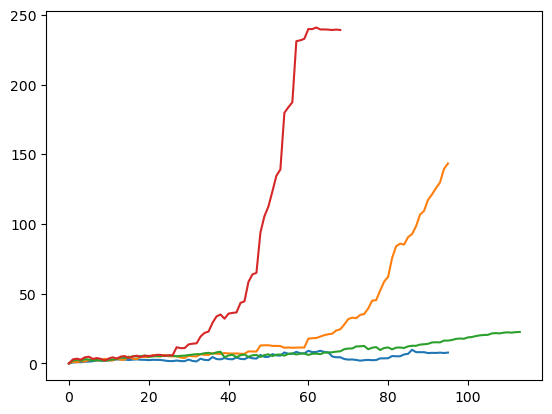

In [82]:
for i in range(len(ref_k_50m)):
    plt.plot(np.linalg.norm(dispfms_k_50m[i]-dispfms_k_50m[i][0,...],axis=1))
    #plt.plot(mags_50[i])

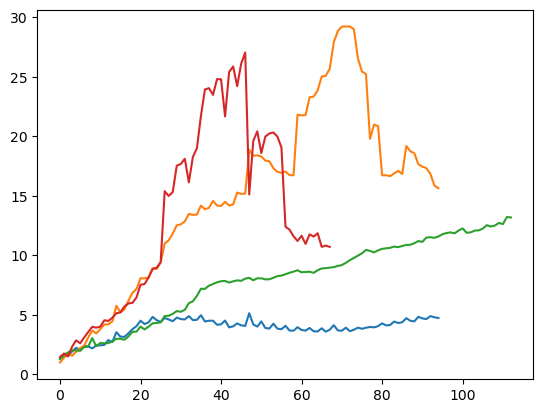

In [83]:
for i in range(len(ref_k_50m)):
    #plt.plot(np.linalg.norm(dispfms_100[i]-dispfms_100[i][0,...],axis=1))
    plt.plot(mags_k_50m[i][1:])

In [84]:
# 4/4 doing well ~1 hr (under 20 at time point 30) (100% success)

In [85]:
%%time
#data_k_60m values - start with displacement/strain only
for i in trange(len(data_k_60m)):
    #i = 0
    refl = np.nan
    for j in range(len(os.listdir(headd_k+data_k_60m[i]+dird52))):
        if (r'toref' in os.listdir(headd_k+data_k_60m[i]+dird52)[j]) and (r'xydftshifts' not in os.listdir(headd_k+data_k_60m[i]+dird52)[j]):
            refl = j
    ref_k_60m.append(int(os.listdir(headd_k+data_k_60m[i]+dird52)[refl][os.listdir(headd_k+data_k_60m[i]+dird52)[refl].find(r'toref')+5:-4]))
    
    circ = imread(headp_k+data_k_60m[i]+dird52+r'\prob_movie_tmax_blur_circle.tif').transpose([0,2,1])
    f = h5py.File(os.path.join(headd_k+data_k_60m[i]+dird52,os.listdir(headd_k+data_k_60m[i]+dird52)[refl]),'r')
    disp = np.array(f.get('dispsdemref'))
    dispf = (disp.transpose([2,3,4,1,0])*scalefac).transpose([3,4,0,1,2])
    dispf = (dispf-dispf[0,...])*(st.resize(circ,dispf.shape[2:])>circ[0,0,0])
    dispfm = np.mean(dispf.reshape(dispf.shape[0],dispf.shape[1],-1)[:,:,st.resize(circ,dispf.shape[2:]).flatten()>circ[0,0,0]],axis=-1)
    dispfr = (dispf.transpose([2,3,4,0,1])-dispfm).transpose([3,4,0,1,2])*(st.resize(circ,dispf.shape[2:])>circ[0,0,0])
    mags = []
    for i in trange(dispfr.shape[0]):
        mags.append(np.mean(np.linalg.norm(dispfr.reshape(dispfr.shape[0],dispfr.shape[1],-1)[i,...],axis=0)))
    dispfs_k_60m.append(dispf)
    dispfms_k_60m.append(dispfm)
    mags_k_60m.append(mags)

  0%|          | 0/2 [00:00<?, ?it/s]

  0%|          | 0/114 [00:00<?, ?it/s]

  0%|          | 0/114 [00:00<?, ?it/s]

CPU times: total: 37.9 s
Wall time: 44.7 s


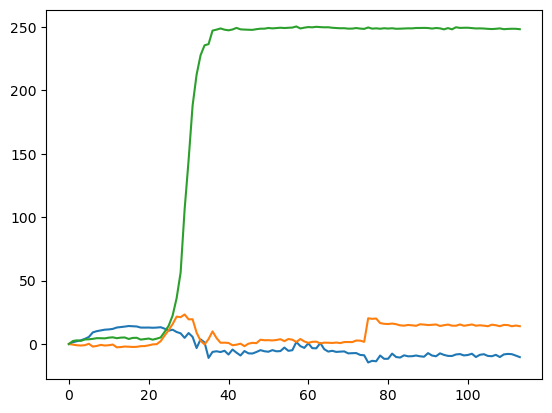

In [86]:
i = 0
plt.plot(dispfms_k_60m[i]-dispfms_k_60m[i][0,...])

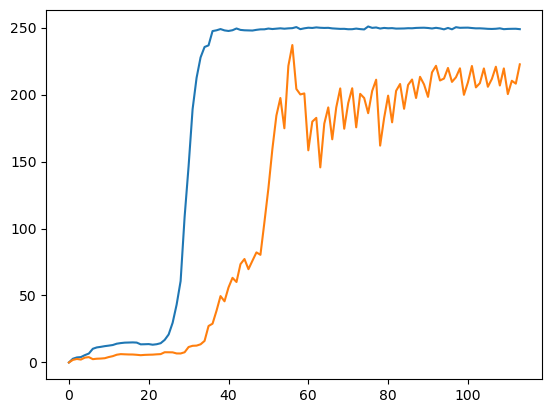

In [87]:
for i in range(len(ref_k_60m)):
    plt.plot(np.linalg.norm(dispfms_k_60m[i]-dispfms_k_60m[i][0,...],axis=1))
    #plt.plot(mags_50[i])

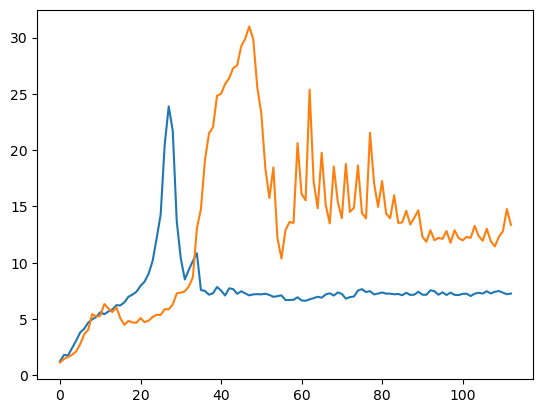

In [88]:
for i in range(len(ref_k_60m)):
    #plt.plot(np.linalg.norm(dispfms_100[i]-dispfms_100[i][0,...],axis=1))
    plt.plot(mags_k_60m[i][1:])

In [89]:
# 1/2 blowing up at time point 30

In [90]:
%%time
#data_k_40m_s values - start with displacement/strain only
for i in trange(len(data_k_40m_s)):
    #i = 0
    refl = np.nan
    for j in range(len(os.listdir(headd_k+data_k_40m_s[i]+dird52))):
        if (r'toref' in os.listdir(headd_k+data_k_40m_s[i]+dird52)[j]) and (r'xydftshifts' not in os.listdir(headd_k+data_k_40m_s[i]+dird52)[j]):
            refl = j
    ref_k_40m_s.append(int(os.listdir(headd_k+data_k_40m_s[i]+dird52)[refl][os.listdir(headd_k+data_k_40m_s[i]+dird52)[refl].find(r'toref')+5:-4]))
    
    circ = imread(headp_k+data_k_40m_s[i]+dird52+r'\prob_movie_tmax_blur_circle.tif').transpose([0,2,1])
    f = h5py.File(os.path.join(headd_k+data_k_40m_s[i]+dird52,os.listdir(headd_k+data_k_40m_s[i]+dird52)[refl]),'r')
    disp = np.array(f.get('dispsdemref'))
    dispf = (disp.transpose([2,3,4,1,0])*scalefac).transpose([3,4,0,1,2])
    dispf = (dispf-dispf[0,...])*(st.resize(circ,dispf.shape[2:])>circ[0,0,0])
    dispfm = np.mean(dispf.reshape(dispf.shape[0],dispf.shape[1],-1)[:,:,st.resize(circ,dispf.shape[2:]).flatten()>circ[0,0,0]],axis=-1)
    dispfr = (dispf.transpose([2,3,4,0,1])-dispfm).transpose([3,4,0,1,2])*(st.resize(circ,dispf.shape[2:])>circ[0,0,0])
    mags = []
    for i in trange(dispfr.shape[0]):
        mags.append(np.mean(np.linalg.norm(dispfr.reshape(dispfr.shape[0],dispfr.shape[1],-1)[i,...],axis=0)))
    dispfs_k_40m_s.append(dispf)
    dispfms_k_40m_s.append(dispfm)
    mags_k_40m_s.append(mags)

  0%|          | 0/13 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/39 [00:00<?, ?it/s]

  0%|          | 0/69 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/69 [00:00<?, ?it/s]

CPU times: total: 1min 52s
Wall time: 2min 4s


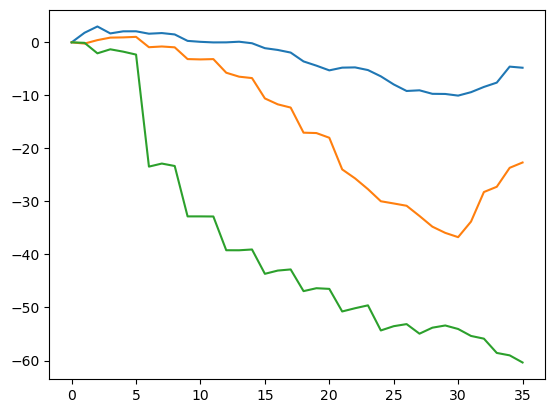

In [91]:
i = 0
plt.plot(dispfms_k_40m_s[i]-dispfms_k_40m_s[i][0,...])

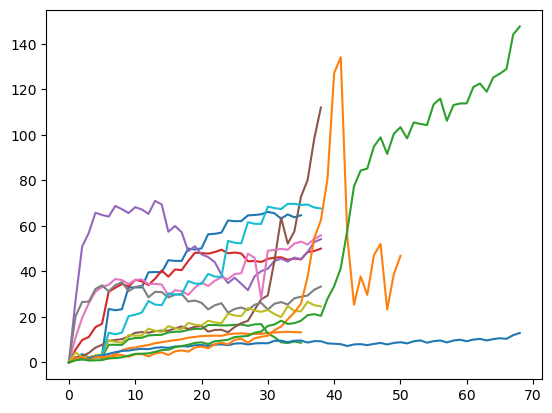

In [92]:
for i in range(len(ref_k_40m_s)):
    plt.plot(np.linalg.norm(dispfms_k_40m_s[i]-dispfms_k_40m_s[i][0,...],axis=1))
    #plt.plot(mags_50[i])

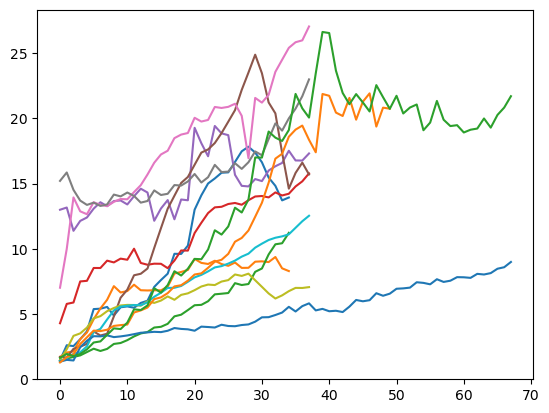

In [93]:
for i in range(len(ref_k_40m_s)):
    #plt.plot(np.linalg.norm(dispfms_100[i]-dispfms_100[i][0,...],axis=1))
    plt.plot(mags_k_40m_s[i][1:])

In [94]:
%%time
#data_k_40m_ns52 values - start with displacement/strain only
for i in trange(len(data_k_40m_ns52)):
    #i = 0
    refl = np.nan
    for j in range(len(os.listdir(headd_k+data_k_40m_ns52[i]+dird52))):
        if (r'toref' in os.listdir(headd_k+data_k_40m_ns52[i]+dird52)[j]) and (r'xydftshifts' not in os.listdir(headd_k+data_k_40m_ns52[i]+dird52)[j]):
            refl = j
    ref_k_40m_ns52.append(int(os.listdir(headd_k+data_k_40m_ns52[i]+dird52)[refl][os.listdir(headd_k+data_k_40m_ns52[i]+dird52)[refl].find(r'toref')+5:-4]))
    
    circ = imread(headp_k+data_k_40m_ns52[i]+dird52+r'\prob_movie_tmax_blur_circle.tif').transpose([0,2,1])
    f = h5py.File(os.path.join(headd_k+data_k_40m_ns52[i]+dird52,os.listdir(headd_k+data_k_40m_ns52[i]+dird52)[refl]),'r')
    disp = np.array(f.get('dispsdemref'))
    dispf = (disp.transpose([2,3,4,1,0])*scalefac).transpose([3,4,0,1,2])
    dispf = (dispf-dispf[0,...])*(st.resize(circ,dispf.shape[2:])>circ[0,0,0])
    dispfm = np.mean(dispf.reshape(dispf.shape[0],dispf.shape[1],-1)[:,:,st.resize(circ,dispf.shape[2:]).flatten()>circ[0,0,0]],axis=-1)
    dispfr = (dispf.transpose([2,3,4,0,1])-dispfm).transpose([3,4,0,1,2])*(st.resize(circ,dispf.shape[2:])>circ[0,0,0])
    mags = []
    for i in trange(dispfr.shape[0]):
        mags.append(np.mean(np.linalg.norm(dispfr.reshape(dispfr.shape[0],dispfr.shape[1],-1)[i,...],axis=0)))
    dispfs_k_40m_ns52.append(dispf)
    dispfms_k_40m_ns52.append(dispfm)
    mags_k_40m_ns52.append(mags)

  0%|          | 0/14 [00:00<?, ?it/s]

  0%|          | 0/114 [00:00<?, ?it/s]

  0%|          | 0/114 [00:00<?, ?it/s]

  0%|          | 0/153 [00:00<?, ?it/s]

  0%|          | 0/27 [00:00<?, ?it/s]

  0%|          | 0/153 [00:00<?, ?it/s]

  0%|          | 0/33 [00:00<?, ?it/s]

  0%|          | 0/153 [00:00<?, ?it/s]

  0%|          | 0/108 [00:00<?, ?it/s]

  0%|          | 0/75 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/57 [00:00<?, ?it/s]

  0%|          | 0/57 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

CPU times: total: 3min 26s
Wall time: 3min 57s


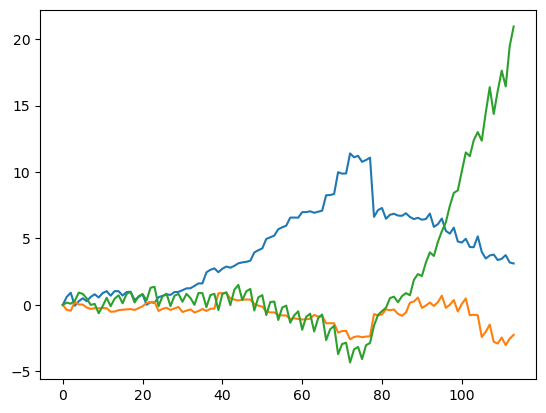

In [95]:
i = 0
plt.plot(dispfms_k_40m_ns52[i]-dispfms_k_40m_ns52[i][0,...])

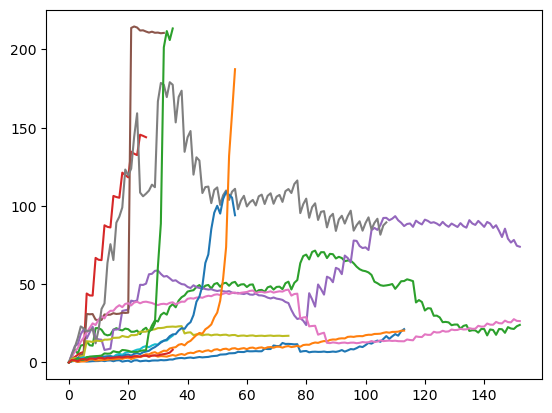

In [96]:
for i in range(len(ref_k_40m_ns52)):
    plt.plot(np.linalg.norm(dispfms_k_40m_ns52[i]-dispfms_k_40m_ns52[i][0,...],axis=1))
    #plt.plot(mags_50[i])

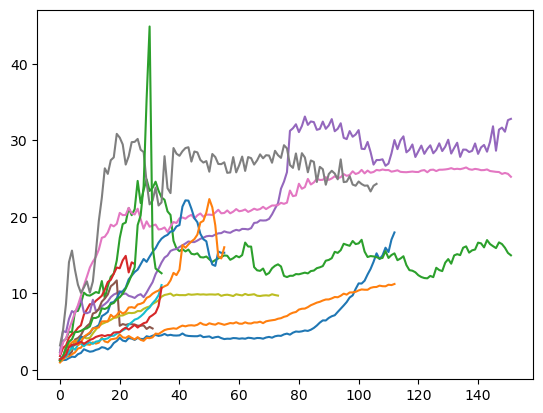

In [97]:
for i in range(len(ref_k_40m_ns52)):
    #plt.plot(np.linalg.norm(dispfms_100[i]-dispfms_100[i][0,...],axis=1))
    plt.plot(mags_k_40m_ns52[i][1:])

In [98]:
# 12-14/27 doing poorly at time point 30
# 6-7/14 ns doing poorly

In [99]:
%%time
#data_k_40m_ns31 values - start with displacement/strain only
for i in trange(len(data_k_40m_ns31)):
    #i = 0
    refl = np.nan
    for j in range(len(os.listdir(headd_k+data_k_40m_ns31[i]+dird31))):
        if (r'toref' in os.listdir(headd_k+data_k_40m_ns31[i]+dird31)[j]) and (r'xydftshifts' not in os.listdir(headd_k+data_k_40m_ns31[i]+dird31)[j]):
            refl = j
    ref_k_40m_ns31.append(int(os.listdir(headd_k+data_k_40m_ns31[i]+dird31)[refl][os.listdir(headd_k+data_k_40m_ns31[i]+dird31)[refl].find(r'toref')+5:-4]))
    
    circ = imread(headp_k+data_k_40m_ns31[i]+dird31+r'\prob_movie_tmax_blur_circle.tif').transpose([0,2,1])
    f = h5py.File(os.path.join(headd_k+data_k_40m_ns31[i]+dird31,os.listdir(headd_k+data_k_40m_ns31[i]+dird31)[refl]),'r')
    disp = np.array(f.get('dispsdemref'))
    dispf = (disp.transpose([2,3,4,1,0])*scalefac).transpose([3,4,0,1,2])
    dispf = (dispf-dispf[0,...])*(st.resize(circ,dispf.shape[2:])>circ[0,0,0])
    dispfm = np.mean(dispf.reshape(dispf.shape[0],dispf.shape[1],-1)[:,:,st.resize(circ,dispf.shape[2:]).flatten()>circ[0,0,0]],axis=-1)
    dispfr = (dispf.transpose([2,3,4,0,1])-dispfm).transpose([3,4,0,1,2])*(st.resize(circ,dispf.shape[2:])>circ[0,0,0])
    mags = []
    for i in trange(dispfr.shape[0]):
        mags.append(np.mean(np.linalg.norm(dispfr.reshape(dispfr.shape[0],dispfr.shape[1],-1)[i,...],axis=0)))
    dispfs_k_40m_ns31.append(dispf)
    dispfms_k_40m_ns31.append(dispfm)
    mags_k_40m_ns31.append(mags)

  0%|          | 0/10 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/36 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

CPU times: total: 1min 42s
Wall time: 1min 56s


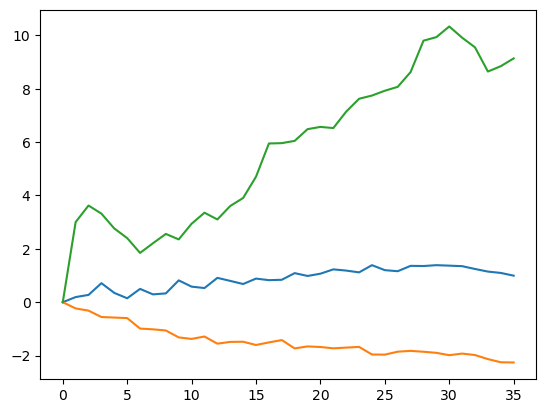

In [100]:
i = 0
plt.plot(dispfms_k_40m_ns31[i]-dispfms_k_40m_ns31[i][0,...])

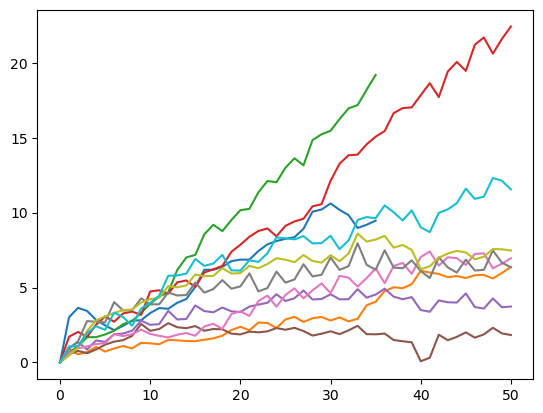

In [101]:
for i in range(len(ref_k_40m_ns31)):
    plt.plot(np.linalg.norm(dispfms_k_40m_ns31[i]-dispfms_k_40m_ns31[i][0,...],axis=1))
    #plt.plot(mags_50[i])

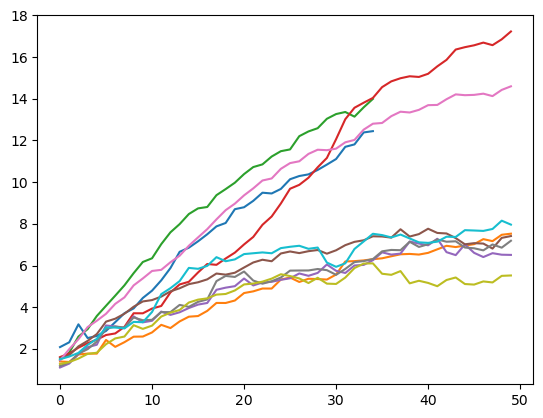

In [102]:
for i in range(len(ref_k_40m_ns31)):
    #plt.plot(np.linalg.norm(dispfms_100[i]-dispfms_100[i][0,...],axis=1))
    plt.plot(mags_k_40m_ns31[i][1:])

In [103]:
# 8/8 great at timepoint 50 (equivalent to ~30 for 52_mean)
# overall 12/35 doing poorly at ~1 hr (~66% success)
# 6-7/22 ns doing poorly (72% success)

# the other metric to explore is whether/when they detach - but unfair because early truncated movies don't have time to detach (unless redipped)

# essentially the gels tend to cluster into stable and unstable groups, with the latter showing a much increased propensity for complete detachment
# KOH treatment seems to promote stability, although it does not take the risk of instability to zero
timefac52 = 112.28 #100 #number of seconds between volumes
timefac31 = 72.68 #60

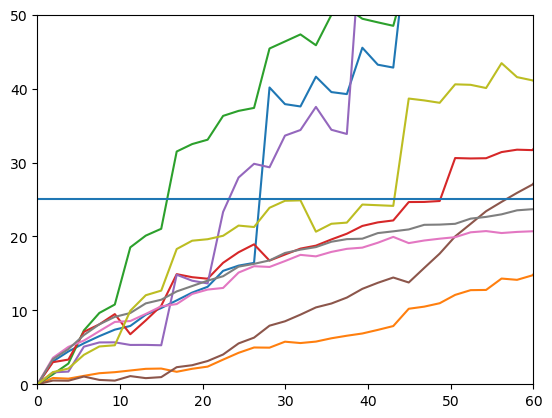

In [104]:
for i in range(len(ref_nk_50m_ns)):
    #if timefac52*dispfms_nk_50m_ns[i].shape[0]/60 > 60:
    plt.plot(timefac52*np.arange(dispfms_nk_50m_ns[i].shape[0])/60,np.linalg.norm(dispfms_nk_50m_ns[i],axis=1))
    #plt.plot(mags_50[i])
plt.xlim(0,60)
plt.ylim(0,50)
plt.hlines(y=25,xmin=0,xmax=60)

(0.0, 60.0)

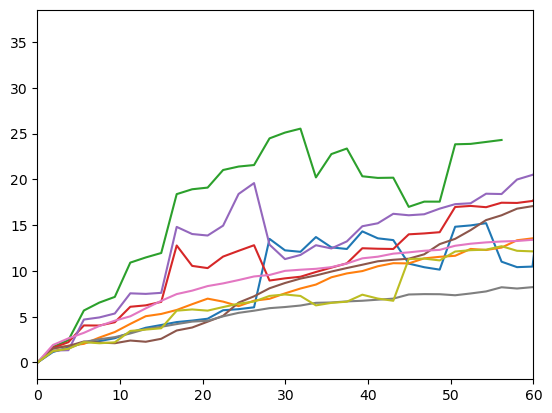

In [105]:
for i in range(len(ref_nk_50m_ns)):
    #if timefac52*dispfms_nk_50m_ns[i].shape[0]/60 > 60:
    #plt.plot(timefac52*np.arange(dispfms_nk_50m_ns[i].shape[0])/60,np.linalg.norm(dispfms_nk_50m_ns[i],axis=1))
    plt.plot(timefac52*np.arange(dispfms_nk_50m_ns[i].shape[0])/60,mags_nk_50m_ns[i])
plt.xlim(0,60)
#plt.ylim(0,50)
#plt.hlines(y=25,xmin=0,xmax=60)

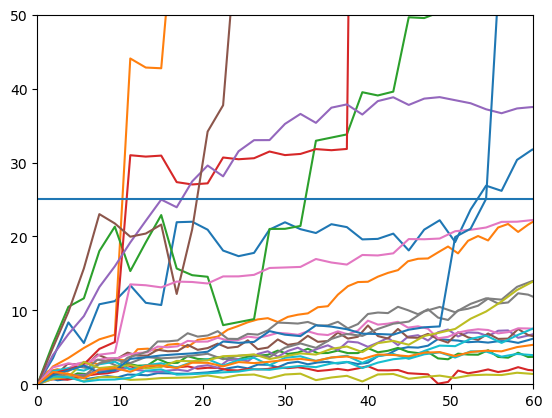

In [106]:
for i in range(len(ref_k_40m_ns31)):
    if timefac31*dispfms_k_40m_ns31[i].shape[0]/60 > 60:
        plt.plot(timefac31*np.arange(dispfms_k_40m_ns31[i].shape[0])/60,np.linalg.norm(dispfms_k_40m_ns31[i],axis=1))
    #plt.plot(mags_50[i])
for i in range(len(ref_k_40m_ns52)):
    #if timefac52*dispfms_k_40m_ns52[i].shape[0]/60 > 60:
    plt.plot(timefac52*np.arange(dispfms_k_40m_ns52[i].shape[0])/60,np.linalg.norm(dispfms_k_40m_ns52[i],axis=1))
    #plt.plot(mags_50[i])
plt.xlim(0,60)
plt.ylim(0,50)
plt.hlines(y=25,xmin=0,xmax=60)

(0.0, 60.0)

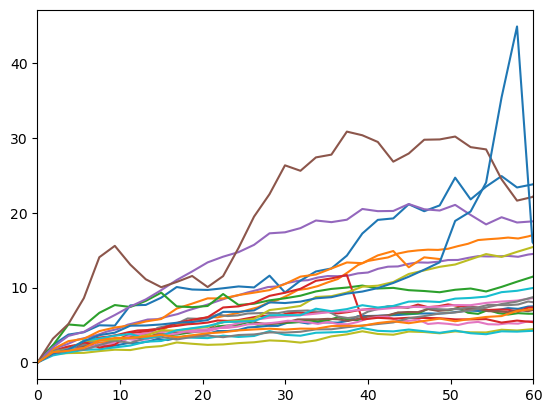

In [107]:
for i in range(len(ref_k_40m_ns31)):
    if timefac31*dispfms_k_40m_ns31[i].shape[0]/60 > 60:
        #plt.plot(timefac31*np.arange(dispfms_k_40m_ns31[i].shape[0])/60,np.linalg.norm(dispfms_k_40m_ns31[i],axis=1))
        plt.plot(timefac31*np.arange(dispfms_k_40m_ns31[i].shape[0])/60,mags_k_40m_ns31[i])
for i in range(len(ref_k_40m_ns52)):
    #if timefac52*dispfms_k_40m_ns52[i].shape[0]/60 > 60:
    #plt.plot(timefac52*np.arange(dispfms_k_40m_ns52[i].shape[0])/60,np.linalg.norm(dispfms_k_40m_ns52[i],axis=1))
    plt.plot(timefac52*np.arange(dispfms_k_40m_ns52[i].shape[0])/60,mags_k_40m_ns52[i])
plt.xlim(0,60)
#plt.ylim(0,50)
#plt.hlines(y=25,xmin=0,xmax=60)

In [108]:
print(3600/timefac52)
print(3600/timefac31)

32.06270039187745
49.532195927352774


6


[0, 2, 3, 4, 5, 8]

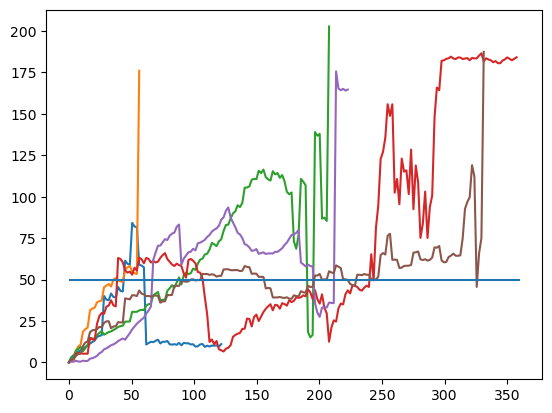

In [109]:
count = 0
vals = []
for i in range(len(ref_nk_50m_ns)):
    if np.max(np.linalg.norm(dispfms_nk_50m_ns[i],axis=1)[:np.ceil(3600/timefac52).astype('int')]) > 25:
        plt.plot(timefac52*np.arange(dispfms_nk_50m_ns[i].shape[0])/60,np.linalg.norm(dispfms_nk_50m_ns[i],axis=1))
        count = count+1
        vals.append(i)
    #plt.plot(mags_50[i])
#plt.xlim(0,60)
#plt.ylim(0,50)
plt.hlines(y=50,xmin=0,xmax=360)
print(count) #6/6 deformed heavily and eventually detached
vals

In [110]:
dets = []
detv = [166/330,646/900,31/31,112/112,886/960,571/600,0,0,886/945]
for j in [0,2,3,4,5,8]:
    dets.append(timefac52*dispfms_nk_50m_ns[j].shape[0]*(detv[j])/60)
dets

[62.128266666666676,
 58.01133333333333,
 209.58933333333334,
 331.6002666666667,
 213.70626666666666,
 312.30078024691363]

3


[1, 6, 7]

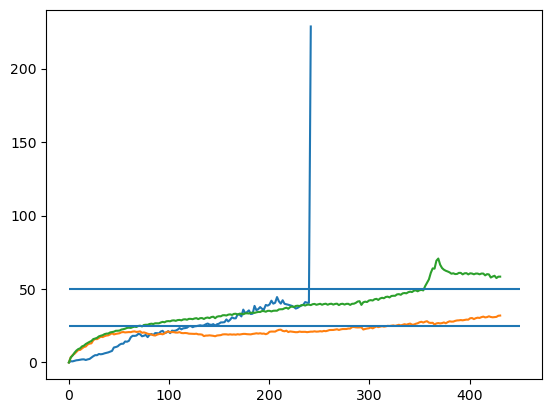

In [111]:
count = 0
vals = []
for i in range(len(ref_nk_50m_ns)):
    if np.max(np.linalg.norm(dispfms_nk_50m_ns[i],axis=1)[:np.ceil(3600/timefac52).astype('int')]) <= 25:
        plt.plot(timefac52*np.arange(dispfms_nk_50m_ns[i].shape[0])/60,np.linalg.norm(dispfms_nk_50m_ns[i],axis=1))
        count = count+1
        vals.append(i)
    #plt.plot(mags_50[i])
#plt.xlim(0,60)
#plt.ylim(0,50)
plt.hlines(y=50,xmin=0,xmax=450)
plt.hlines(y=25,xmin=0,xmax=450)
print(count) #0/3 deformed heavily, 1 eventually detached
vals

In [112]:
dets = []
detv = [166/330,646/900,31/31,112/112,886/960,571/600,0,0,886/945]
for j in [1]:
    dets.append(timefac52*dispfms_nk_50m_ns[j].shape[0]*(detv[j])/60)
dets

[174.61619259259257]

In [113]:
timefac52*3*571/900

213.7062666666667

In [114]:
detsm = [timefac52*3*166/900,
        timefac52*3*646/900,
        timefac52*31/60,
        timefac52*112/60,
        timefac52*3*886/900,
        timefac52*3*571/900,
        0,
        0,
        timefac52*3*886/900]
detsm

[62.12826666666667,
 241.7762666666667,
 58.01133333333333,
 209.58933333333334,
 331.6002666666667,
 213.7062666666667,
 0,
 0,
 331.6002666666667]

7


[2, 3, 4, 5, 6, 7, 12]

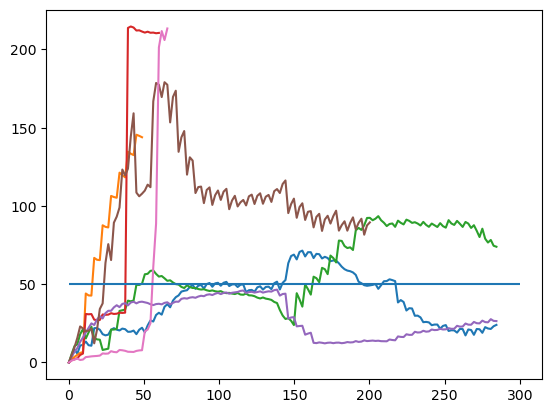

In [115]:
count = 0
vals = []
for i in range(len(ref_k_40m_ns31)):
    if np.max(np.linalg.norm(dispfms_k_40m_ns31[i],axis=1)[:np.ceil(3600/timefac31).astype('int')]) > 25:
        plt.plot(timefac31*np.arange(dispfms_k_40m_ns31[i].shape[0])/60,np.linalg.norm(dispfms_k_40m_ns31[i],axis=1))
        count = count+1
        vals.append(i)
    #plt.plot(mags_50[i])
for i in range(len(ref_k_40m_ns52)):
    if np.max(np.linalg.norm(dispfms_k_40m_ns52[i],axis=1)[:np.ceil(3600/timefac52).astype('int')]) > 25:
        plt.plot(timefac52*np.arange(dispfms_k_40m_ns52[i].shape[0])/60,np.linalg.norm(dispfms_k_40m_ns52[i],axis=1))
        count = count+1
        vals.append(i)
    #plt.plot(mags_50[i])
#plt.xlim(0,60)
#plt.ylim(0,50)
plt.hlines(y=50,xmin=0,xmax=300)
print(count) #6/7 deformed heavily (crossed 50 by 2 hrs), 2 of those detached
vals

2
3
4
5
7
10
11
12


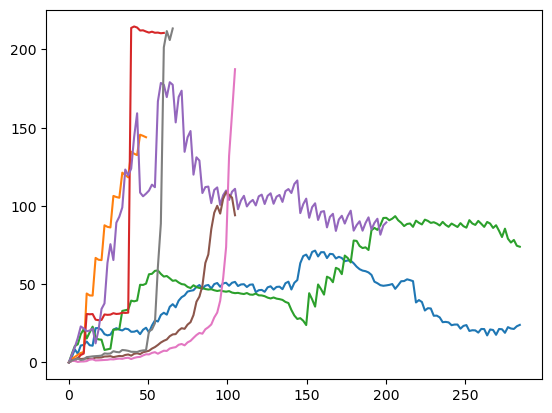

In [116]:
for i in range(len(ref_k_40m_ns52)):
    if np.max(np.linalg.norm(dispfms_k_40m_ns52[i],axis=1)[:np.ceil(7200/timefac52).astype('int')]) > 50:
        plt.plot(timefac52*np.arange(dispfms_k_40m_ns52[i].shape[0])/60,np.linalg.norm(dispfms_k_40m_ns52[i],axis=1))
        print(i)

17


[0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 0, 1, 8, 9, 10, 11, 13]

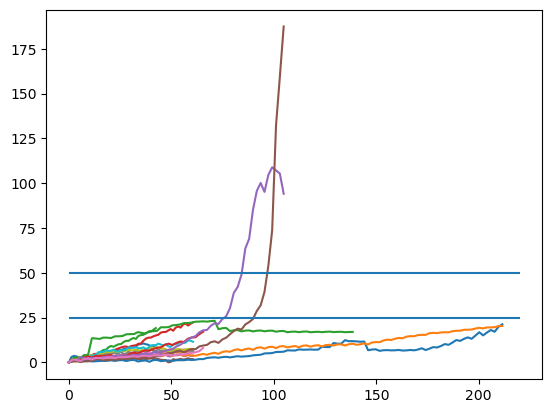

In [117]:
count = 0
vals = []
for i in range(len(ref_k_40m_ns31)):
    if np.max(np.linalg.norm(dispfms_k_40m_ns31[i],axis=1)[:np.ceil(3600/timefac31).astype('int')]) <= 25:
        plt.plot(timefac31*np.arange(dispfms_k_40m_ns31[i].shape[0])/60,np.linalg.norm(dispfms_k_40m_ns31[i],axis=1))
        count = count+1
        vals.append(i)
    #plt.plot(mags_50[i])
for i in range(len(ref_k_40m_ns52)):
    if np.max(np.linalg.norm(dispfms_k_40m_ns52[i],axis=1)[:np.ceil(3600/timefac52).astype('int')]) <= 25:
        plt.plot(timefac52*np.arange(dispfms_k_40m_ns52[i].shape[0])/60,np.linalg.norm(dispfms_k_40m_ns52[i],axis=1))
        count = count+1
        vals.append(i)
    #plt.plot(mags_50[i])
#plt.xlim(0,60)
#plt.ylim(0,50)
plt.hlines(y=50,xmin=0,xmax=220)
plt.hlines(y=25,xmin=0,xmax=220)
print(count) #2/17 deformed heavily (none detached), 15/17 great
vals

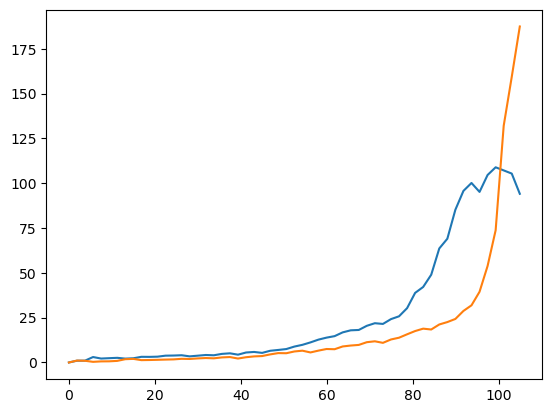

In [118]:
for i in [10,11]:
        plt.plot(timefac52*np.arange(dispfms_k_40m_ns52[i].shape[0])/60,np.linalg.norm(dispfms_k_40m_ns52[i],axis=1))

In [119]:
detsm2 = [0,
         0,
         0,
         0,
         0,
         timefac52*3*541/900,
         0,
         0,
         0,
         0,
         0,
         0,
         timefac52*36/60,
         0]
detsm2

[0, 0, 0, 0, 0, 202.4782666666667, 0, 0, 0, 0, 0, 0, 67.368, 0]

In [120]:
data_k_40m_ns52

['\\20220831_PL27\\wells001',
 '\\20220831_PL31\\wells001',
 '\\20221103_PL38\\wells001',
 '\\20221103_PL47\\wells001',
 '\\20221104_PL45\\wells001',
 '\\20221115_PL42\\wells001',
 '\\20221116_PL44\\wells001',
 '\\20221118_PL28\\wells001',
 '\\20221129_PL28\\wells001',
 '\\20230823_PL28\\wells001',
 '\\20230823_PL48\\wells001',
 '\\20230823_PL61\\wells001',
 '\\20230825_PL39\\wells001',
 '\\20230825_PL57\\wells001']

In [121]:
data_nk_50m_ns

['\\220125_PK9\\wells001',
 '\\220126_PK8\\wells001',
 '\\220127_PK9\\wells001',
 '\\220203_PK9\\wells001',
 '\\220207_PK5\\wells001',
 '\\220208_PK8\\wells001',
 '\\220210_PK7\\wells001',
 '\\220211_PK8\\wells001',
 '\\220304_PL7\\wells001']

In [122]:
print(timefac52)
print(timefac31)

112.28
72.68


In [767]:
%%time
# pickle everything and move to IW
basedir = r'\\nasquatch\data\2p\peter\grin_videos\s12_outputs'

with open(basedir+r'\dispfs_50.pickle', 'wb') as f:
    pickle.dump(dispfs_50, f)

with open(basedir+r'\dispfms_50.pickle', 'wb') as f:
    pickle.dump(dispfms_50, f)

with open(basedir+r'\mags_50.pickle', 'wb') as f:
    pickle.dump(mags_50, f)

with open(basedir+r'\dispfs_100.pickle', 'wb') as f:
    pickle.dump(dispfs_100, f)

with open(basedir+r'\dispfms_100.pickle', 'wb') as f:
    pickle.dump(dispfms_100, f)

with open(basedir+r'\mags_100.pickle', 'wb') as f:
    pickle.dump(mags_100, f)
    

with open(basedir+r'\dispfs_nk_50m_s.pickle', 'wb') as f:
    pickle.dump(dispfs_nk_50m_s, f)

with open(basedir+r'\dispfms_nk_50m_s.pickle', 'wb') as f:
    pickle.dump(dispfms_nk_50m_s, f)

with open(basedir+r'\mags_nk_50m_s.pickle', 'wb') as f:
    pickle.dump(mags_nk_50m_s, f)

with open(basedir+r'\dispfs_nk_50m_ns.pickle', 'wb') as f:
    pickle.dump(dispfs_nk_50m_ns, f)

with open(basedir+r'\dispfms_nk_50m_ns.pickle', 'wb') as f:
    pickle.dump(dispfms_nk_50m_ns, f)

with open(basedir+r'\mags_nk_50m_ns.pickle', 'wb') as f:
    pickle.dump(mags_nk_50m_ns, f)

with open(basedir+r'\dispfs_k_50m.pickle', 'wb') as f:
    pickle.dump(dispfs_k_50m, f)

with open(basedir+r'\dispfms_k_50m.pickle', 'wb') as f:
    pickle.dump(dispfms_k_50m, f)

with open(basedir+r'\mags_k_50m.pickle', 'wb') as f:
    pickle.dump(mags_k_50m, f)

with open(basedir+r'\dispfs_k_60m.pickle', 'wb') as f:
    pickle.dump(dispfs_k_60m, f)

with open(basedir+r'\dispfms_k_60m.pickle', 'wb') as f:
    pickle.dump(dispfms_k_60m, f)

with open(basedir+r'\mags_k_60m.pickle', 'wb') as f:
    pickle.dump(mags_k_60m, f)

with open(basedir+r'\dispfs_k_40m_s.pickle', 'wb') as f:
    pickle.dump(dispfs_k_40m_s, f)

with open(basedir+r'\dispfms_k_40m_s.pickle', 'wb') as f:
    pickle.dump(dispfms_k_40m_s, f)

with open(basedir+r'\mags_k_40m_s.pickle', 'wb') as f:
    pickle.dump(mags_k_40m_s, f)

with open(basedir+r'\dispfs_k_40m_ns52.pickle', 'wb') as f:
    pickle.dump(dispfs_k_40m_ns52, f)

with open(basedir+r'\dispfms_k_40m_ns52.pickle', 'wb') as f:
    pickle.dump(dispfms_k_40m_ns52, f)

with open(basedir+r'\mags_k_40m_ns52.pickle', 'wb') as f:
    pickle.dump(mags_k_40m_ns52, f)

with open(basedir+r'\dispfs_k_40m_ns31.pickle', 'wb') as f:
    pickle.dump(dispfs_k_40m_ns31, f)

with open(basedir+r'\dispfms_k_40m_ns31.pickle', 'wb') as f:
    pickle.dump(dispfms_k_40m_ns31, f)

with open(basedir+r'\mags_k_40m_ns31.pickle', 'wb') as f:
    pickle.dump(mags_k_40m_ns31, f)

CPU times: total: 1min 56s
Wall time: 3min 39s


In [ ]:
# preprocessing and making circles - need to make sure that the correct warps are being quantified (i.e. just inside the GRIN)
# to do this need to generate blur_circles pre-warp for the movies above included in the warp quantifications

In [5]:
# ready the prob_paths
prob_paths = []

for i in range(len(data_50)): #headp/dird
    prob_paths.append(headp+data_50[i]+dird)

for i in range(len(data_100)): #headp/dird
    prob_paths.append(headp+data_100[i]+dird)

for i in range(len(data_nk_50m_s)): #headp_nk/dird52
    prob_paths.append(headp_nk+data_nk_50m_s[i]+dird52)

for i in range(len(data_nk_50m_ns)): #headp_nk/dird52
    prob_paths.append(headp_nk+data_nk_50m_ns[i]+dird52)

for i in range(len(data_k_50m)): #headp_k/dird52
    prob_paths.append(headp_k+data_k_50m[i]+dird52)

for i in range(len(data_k_60m)): #headp_k/dird52
    prob_paths.append(headp_k+data_k_60m[i]+dird52)

for i in range(len(data_k_40m_s)): #headp_k/dird52
    prob_paths.append(headp_k+data_k_40m_s[i]+dird52)

for i in range(len(data_k_40m_ns52)): #headp_k/dird52
    prob_paths.append(headp_k+data_k_40m_ns52[i]+dird52)

for i in range(len(data_k_40m_ns31)): #headp_k/dird31
    prob_paths.append(headp_k+data_k_40m_ns31[i]+dird31)

prob_paths

['\\\\nasquatch\\data\\2p\\peter\\chip_tiling\\211103_PZ1\\chunks\\well1\\segtrack\\segs\\ch0\\10_mean__fix\\cellpose_model_1_o_relab042323_flow_aniso4_st0p4_blTrue_intFalse_3DeeC\\seg',
 '\\\\nasquatch\\data\\2p\\peter\\chip_tiling\\211103_PZ1\\chunks\\well2\\segtrack\\segs\\ch0\\10_mean__fix\\cellpose_model_1_o_relab042323_flow_aniso4_st0p4_blTrue_intFalse_3DeeC\\seg',
 '\\\\nasquatch\\data\\2p\\peter\\chip_tiling\\211103_PZ1\\chunks\\well3\\segtrack\\segs\\ch0\\10_mean__fix\\cellpose_model_1_o_relab042323_flow_aniso4_st0p4_blTrue_intFalse_3DeeC\\seg',
 '\\\\nasquatch\\data\\2p\\peter\\chip_tiling\\211103_PZ1\\chunks\\well4\\segtrack\\segs\\ch0\\10_mean__fix\\cellpose_model_1_o_relab042323_flow_aniso4_st0p4_blTrue_intFalse_3DeeC\\seg',
 '\\\\nasquatch\\data\\2p\\peter\\chip_tiling\\211103_PZ1\\chunks\\well5\\segtrack\\segs\\ch0\\10_mean__fix\\cellpose_model_1_o_relab042323_flow_aniso4_st0p4_blTrue_intFalse_3DeeC\\seg',
 '\\\\nasquatch\\data\\2p\\peter\\chip_tiling\\211103_PZ1\\chunks

In [6]:
%%time
# make prob_movies and max projections (with Gaussian blur)
# ~0.5 sec/frame - again not much to parallelize, data loading/saving
# relatively slow, RAM intensive! stop making normalized probmap stuff
sigmas = [0,1,1]

for prob_path in tqdm(prob_paths):
    prob_movie = []
    prob_movie_norm = []
    
    frnum = len([nm for nm in os.listdir(prob_path) if nm[:5] == 'prob0'])
    
    for t in trange(1,frnum+1):
        prob_map = np.load(f'{prob_path}/prob{t:04d}.npy')
        #prob_map_norm = (prob_map - prob_map.min()) / (prob_map.max() - prob_map.min())
        prob_map = np.transpose(prob_map,(2,0,1))
        #prob_map_norm = np.transpose(prob_map_norm,(2,0,1))
        prob_movie.append(np.array(prob_map))
        #prob_movie_norm.append(np.array(prob_map_norm))

    prob_movie_arr = np.array(prob_movie)
    #prob_movie_norm_arr = np.array(prob_movie_norm)
    prob_movie_arr_max = gaussian_filter(np.max(prob_movie_arr,axis=0),sigma=sigmas,mode='nearest')
    
    np.save(f'{prob_path}/prob_movie.npy',prob_movie_arr)
    #np.save(f'{prob_path}/prob_movie_norm.npy',prob_movie_norm_arr)
    imwrite(f'{prob_path}/prob_movie_tmax_blur.tiff',  
           prob_movie_arr_max.astype('float32'), bigtiff=True, imagej=True,metadata={'axes': 'ZYX'}, compression ='zlib')
    imwrite(f'{prob_path}/prob_movie.tiff',  
           np.array(prob_movie).astype('float32'), bigtiff=True, imagej=True,metadata={'axes': 'TZYX'}, compression ='zlib')
    #tif_imwrite(f'{prob_path}/prob_movie_norm.tiff',  
    #       np.array(prob_movie_norm).astype('float32'), bigtiff=True, imagej=True,metadata={'axes': 'TZYX'}, compression ='zlib')

  0%|                                                   | 0/79 [00:00<?, ?it/s]

  0%|          | 0/118 [00:00<?, ?it/s]

D:\pkalugin\miniconda3\envs\caiman_full_102\lib\site-packages\tifffile\tifffile.py:1766: UserWarning: <tifffile.TiffWriter 'prob_movie_tmax_blur.tiff'> writing nonconformant BigTIFF ImageJ
  warnings.warn(
D:\pkalugin\miniconda3\envs\caiman_full_102\lib\site-packages\tifffile\tifffile.py:1766: UserWarning: <tifffile.TiffWriter 'prob_movie.tiff'> writing nonconformant BigTIFF ImageJ
  warnings.warn(
  1%|▌                                        | 1/79 [01:19<1:43:59, 80.00s/it]

  0%|          | 0/118 [00:00<?, ?it/s]

  3%|█                                        | 2/79 [03:06<2:02:51, 95.74s/it]

  0%|          | 0/118 [00:00<?, ?it/s]

  4%|█▌                                      | 3/79 [04:57<2:10:03, 102.68s/it]

  0%|          | 0/118 [00:00<?, ?it/s]

  5%|██                                      | 4/79 [06:41<2:08:54, 103.12s/it]

  0%|          | 0/118 [00:00<?, ?it/s]

  6%|██▌                                     | 5/79 [08:28<2:08:47, 104.42s/it]

  0%|          | 0/118 [00:00<?, ?it/s]

  8%|███                                     | 6/79 [10:15<2:08:17, 105.45s/it]

  0%|          | 0/118 [00:00<?, ?it/s]

  9%|███▌                                    | 7/79 [12:03<2:07:32, 106.28s/it]

  0%|          | 0/118 [00:00<?, ?it/s]

 10%|████                                    | 8/79 [13:50<2:05:50, 106.35s/it]

  0%|          | 0/118 [00:00<?, ?it/s]

 11%|████▌                                   | 9/79 [15:43<2:06:48, 108.69s/it]

  0%|          | 0/118 [00:00<?, ?it/s]

 13%|████▉                                  | 10/79 [17:33<2:05:16, 108.93s/it]

  0%|          | 0/118 [00:00<?, ?it/s]

 14%|█████▍                                 | 11/79 [19:32<2:06:56, 112.01s/it]

  0%|          | 0/118 [00:00<?, ?it/s]

 15%|█████▉                                 | 12/79 [21:24<2:04:55, 111.87s/it]

  0%|          | 0/153 [00:00<?, ?it/s]

 16%|██████▍                                | 13/79 [22:43<1:52:17, 102.08s/it]

  0%|          | 0/75 [00:00<?, ?it/s]

 18%|███████                                 | 14/79 [23:27<1:31:28, 84.44s/it]

  0%|          | 0/36 [00:00<?, ?it/s]

 19%|███████▌                                | 15/79 [23:47<1:09:25, 65.09s/it]

  0%|          | 0/36 [00:00<?, ?it/s]

 20%|████████▌                                 | 16/79 [24:07<54:03, 51.48s/it]

  0%|          | 0/231 [00:00<?, ?it/s]

 22%|████████▌                               | 17/79 [26:10<1:15:36, 73.17s/it]

  0%|          | 0/231 [00:00<?, ?it/s]

 23%|█████████                               | 18/79 [28:17<1:30:35, 89.10s/it]

  0%|          | 0/231 [00:00<?, ?it/s]

 24%|█████████▌                              | 19/79 [30:21<1:39:45, 99.75s/it]

  0%|          | 0/231 [00:00<?, ?it/s]

 25%|█████████▊                             | 20/79 [32:25<1:45:05, 106.87s/it]

  0%|          | 0/231 [00:00<?, ?it/s]

 27%|██████████▎                            | 21/79 [34:26<1:47:24, 111.11s/it]

  0%|          | 0/75 [00:00<?, ?it/s]

 28%|███████████▏                            | 22/79 [35:11<1:26:51, 91.43s/it]

  0%|          | 0/63 [00:00<?, ?it/s]

 29%|███████████▋                            | 23/79 [35:45<1:09:12, 74.15s/it]

  0%|          | 0/75 [00:00<?, ?it/s]

 30%|████████████▊                             | 24/79 [36:26<58:45, 64.10s/it]

  0%|          | 0/123 [00:00<?, ?it/s]

 32%|█████████████▎                            | 25/79 [37:33<58:26, 64.94s/it]

  0%|          | 0/105 [00:00<?, ?it/s]

 33%|█████████████▊                            | 26/79 [38:28<54:55, 62.18s/it]

  0%|          | 0/45 [00:00<?, ?it/s]

 34%|██████████████▎                           | 27/79 [38:53<44:06, 50.89s/it]

  0%|          | 0/66 [00:00<?, ?it/s]

 35%|██████████████▉                           | 28/79 [39:30<39:43, 46.74s/it]

  0%|          | 0/130 [00:00<?, ?it/s]

 37%|███████████████▍                          | 29/79 [40:41<44:55, 53.92s/it]

  0%|          | 0/31 [00:00<?, ?it/s]

 38%|███████████████▉                          | 30/79 [40:59<35:12, 43.11s/it]

  0%|          | 0/112 [00:00<?, ?it/s]

 39%|████████████████▍                         | 31/79 [41:56<37:51, 47.32s/it]

  0%|          | 0/192 [00:00<?, ?it/s]

 41%|█████████████████                         | 32/79 [43:33<48:55, 62.45s/it]

  0%|          | 0/120 [00:00<?, ?it/s]

 42%|█████████████████▌                        | 33/79 [44:35<47:45, 62.29s/it]

  0%|          | 0/231 [00:00<?, ?it/s]

 43%|██████████████████                        | 34/79 [46:34<59:19, 79.10s/it]

  0%|          | 0/231 [00:00<?, ?it/s]

 44%|█████████████████▋                      | 35/79 [48:37<1:07:42, 92.34s/it]

  0%|          | 0/178 [00:00<?, ?it/s]

 46%|██████████████████▏                     | 36/79 [50:14<1:07:09, 93.71s/it]

  0%|          | 0/96 [00:00<?, ?it/s]

 47%|███████████████████▋                      | 37/79 [51:03<56:14, 80.34s/it]

  0%|          | 0/96 [00:00<?, ?it/s]

 48%|████████████████████▏                     | 38/79 [51:51<48:21, 70.76s/it]

  0%|          | 0/114 [00:00<?, ?it/s]

 49%|████████████████████▋                     | 39/79 [52:47<44:11, 66.28s/it]

  0%|          | 0/69 [00:00<?, ?it/s]

 51%|█████████████████████▎                    | 40/79 [53:22<37:00, 56.94s/it]

  0%|          | 0/114 [00:00<?, ?it/s]

 52%|█████████████████████▊                    | 41/79 [54:19<35:58, 56.80s/it]

  0%|          | 0/114 [00:00<?, ?it/s]

 53%|██████████████████████▎                   | 42/79 [55:15<34:51, 56.53s/it]

  0%|          | 0/36 [00:00<?, ?it/s]

 54%|██████████████████████▊                   | 43/79 [55:34<27:07, 45.21s/it]

  0%|          | 0/36 [00:00<?, ?it/s]

 56%|███████████████████████▍                  | 44/79 [55:51<21:29, 36.85s/it]

  0%|          | 0/36 [00:00<?, ?it/s]

 57%|███████████████████████▉                  | 45/79 [56:09<17:39, 31.15s/it]

  0%|          | 0/39 [00:00<?, ?it/s]

 58%|████████████████████████▍                 | 46/79 [56:31<15:42, 28.57s/it]

  0%|          | 0/39 [00:00<?, ?it/s]

 59%|████████████████████████▉                 | 47/79 [56:52<13:59, 26.22s/it]

  0%|          | 0/39 [00:00<?, ?it/s]

 61%|█████████████████████████▌                | 48/79 [57:12<12:32, 24.28s/it]

  0%|          | 0/39 [00:00<?, ?it/s]

 62%|██████████████████████████                | 49/79 [57:31<11:26, 22.89s/it]

  0%|          | 0/39 [00:00<?, ?it/s]

 63%|██████████████████████████▌               | 50/79 [57:51<10:35, 21.93s/it]

  0%|          | 0/39 [00:00<?, ?it/s]

 65%|███████████████████████████               | 51/79 [58:12<10:04, 21.60s/it]

  0%|          | 0/39 [00:00<?, ?it/s]

 66%|███████████████████████████▋              | 52/79 [58:31<09:26, 20.99s/it]

  0%|          | 0/69 [00:00<?, ?it/s]

 67%|████████████████████████████▏             | 53/79 [59:05<10:44, 24.80s/it]

  0%|          | 0/51 [00:00<?, ?it/s]

 68%|████████████████████████████▋             | 54/79 [59:31<10:25, 25.01s/it]

  0%|          | 0/69 [00:00<?, ?it/s]

 70%|███████████████████████████▊            | 55/79 [1:00:08<11:28, 28.69s/it]

  0%|          | 0/114 [00:00<?, ?it/s]

 71%|████████████████████████████▎           | 56/79 [1:01:02<13:53, 36.24s/it]

  0%|          | 0/114 [00:00<?, ?it/s]

 72%|████████████████████████████▊           | 57/79 [1:01:57<15:23, 41.98s/it]

  0%|          | 0/153 [00:00<?, ?it/s]

 73%|█████████████████████████████▎          | 58/79 [1:03:11<18:00, 51.43s/it]

  0%|          | 0/27 [00:00<?, ?it/s]

 75%|█████████████████████████████▊          | 59/79 [1:03:25<13:26, 40.34s/it]

  0%|          | 0/153 [00:00<?, ?it/s]

 76%|██████████████████████████████▍         | 60/79 [1:04:42<16:15, 51.36s/it]

  0%|          | 0/33 [00:00<?, ?it/s]

 77%|██████████████████████████████▉         | 61/79 [1:05:00<12:20, 41.16s/it]

  0%|          | 0/153 [00:00<?, ?it/s]

 78%|███████████████████████████████▍        | 62/79 [1:06:21<15:03, 53.16s/it]

  0%|          | 0/108 [00:00<?, ?it/s]

 80%|███████████████████████████████▉        | 63/79 [1:07:20<14:40, 55.04s/it]

  0%|          | 0/75 [00:00<?, ?it/s]

 81%|████████████████████████████████▍       | 64/79 [1:07:59<12:32, 50.17s/it]

  0%|          | 0/36 [00:00<?, ?it/s]

 82%|████████████████████████████████▉       | 65/79 [1:08:18<09:32, 40.88s/it]

  0%|          | 0/57 [00:00<?, ?it/s]

 84%|█████████████████████████████████▍      | 66/79 [1:08:47<08:04, 37.31s/it]

  0%|          | 0/57 [00:00<?, ?it/s]

 85%|█████████████████████████████████▉      | 67/79 [1:09:17<07:02, 35.19s/it]

  0%|          | 0/36 [00:00<?, ?it/s]

 86%|██████████████████████████████████▍     | 68/79 [1:09:36<05:33, 30.35s/it]

  0%|          | 0/36 [00:00<?, ?it/s]

 87%|██████████████████████████████████▉     | 69/79 [1:09:57<04:32, 27.27s/it]

  0%|          | 0/36 [00:00<?, ?it/s]

 89%|███████████████████████████████████▍    | 70/79 [1:10:16<03:45, 25.00s/it]

  0%|          | 0/51 [00:00<?, ?it/s]

 90%|███████████████████████████████████▉    | 71/79 [1:10:44<03:27, 25.95s/it]

  0%|          | 0/36 [00:00<?, ?it/s]

 91%|████████████████████████████████████▍   | 72/79 [1:11:05<02:51, 24.49s/it]

  0%|          | 0/51 [00:00<?, ?it/s]

 92%|████████████████████████████████████▉   | 73/79 [1:11:34<02:34, 25.67s/it]

  0%|          | 0/51 [00:00<?, ?it/s]

 94%|█████████████████████████████████████▍  | 74/79 [1:12:01<02:10, 26.12s/it]

  0%|          | 0/51 [00:00<?, ?it/s]

 95%|█████████████████████████████████████▉  | 75/79 [1:12:28<01:45, 26.36s/it]

  0%|          | 0/51 [00:00<?, ?it/s]

 96%|██████████████████████████████████████▍ | 76/79 [1:12:55<01:20, 26.69s/it]

  0%|          | 0/51 [00:00<?, ?it/s]

 97%|██████████████████████████████████████▉ | 77/79 [1:13:23<00:53, 26.85s/it]

  0%|          | 0/51 [00:00<?, ?it/s]

 99%|███████████████████████████████████████▍| 78/79 [1:13:52<00:27, 27.53s/it]

  0%|          | 0/51 [00:00<?, ?it/s]

100%|████████████████████████████████████████| 79/79 [1:14:22<00:00, 56.49s/it]

CPU times: total: 2h 26min 58s
Wall time: 1h 14min 22s


In [127]:
(r'toref' in os.listdir(headd+data_50[0]+dird)[1]) and (r'xydftshifts' not in os.listdir(headd+data_50[0]+dird)[1])

True

In [126]:
len(os.listdir(headd+data_50[0]+dird))

2

In [106]:
os.listdir(headd+data_50[0]+dird)[1]

'prob_movie_scale4AFS2PL4_dispdemons_toref1.mat'

In [121]:
os.listdir(headd+data_50[0]+dird)[1][os.listdir(headd+data_50[0]+dird)[1].find(r'toref')+5:-4]

'1'

In [123]:
os.path.join(headd+data_50[0]+dird,os.listdir(headd+data_50[0]+dird)[1])

'D:\\2p_data\\peter\\chip_tiling\\211103_PZ1\\chunks\\well1\\segtrack\\segs\\ch0\\10_mean__fix\\cellpose_model_1_o_relab042323_flow_aniso4_st0p4_blTrue_intFalse_3DeeC\\seg\\prob_movie_scale4AFS2PL4_dispdemons_toref1.mat'

In [111]:
os.listdir(headd+data_50[0]+dird)[1].find(r'toref')

36

In [3]:
data_uncoated = [r'\\anastasia\data\2p\david\dipping_only\6plex\220120_DT1\wells001\segtrack\tiffs\ch0\52_mean__\means_movie.npy',
                 r'\\anastasia\data\2p\david\dipping_only\6plex\220304_PL7\wells001\segtrack\tiffs\ch0\52_mean__\means_movie.npy',
                 r'\\anastasia\data\2p\david\dipping_only\6plex\220121_PK8\wells001\segtrack\tiffs\ch0\52_mean__\means_movie.npy']

data_coated = [r'\\nasquatch\data\2p\peter\dipping\20220906_PL24\wells001\segtrack\tiffs\ch0\52_mean__\means_movie.npy',
               r'\\nasquatch\data\2p\peter\dipping\20230922_PL28\wells001\segtrack\tiffs\ch0\31_mean__\means_movie.npy']

In [4]:
data_uncoated = [r'\\anastasia\data\2p\david\dipping_only\6plex\220120_DT1\wells001\segtrack\tiffs\ch0\52_mean__\means_movie.npy',
                 r'\\anastasia\data\2p\david\dipping_only\6plex\220304_PL7\wells001\segtrack\segs\ch0\52_mean__\cellpose_model_1_o_relab042323_flow_aniso4_st0p4_blTrue_intFalse_3DeeC\seg\prob_movie.npy',
                 r'\\anastasia\data\2p\david\dipping_only\6plex\220121_PK8\wells001\segtrack\tiffs\ch0\52_mean__\means_movie.npy']

data_coated = [r'\\nasquatch\data\2p\peter\dipping\20220906_PL24\wells001\segtrack\tiffs\ch0\52_mean__\means_movie.npy',
               r'\\nasquatch\data\2p\peter\dipping\20230922_PL28\wells001\segtrack\segs\ch0\31_mean__\cellpose_model_1_o_relab042323_flow_aniso4_st0p4_blTrue_intFalse_3DeeC\seg\prob_movie.npy']

In [5]:
Yx = np.load(data_uncoated[1],mmap_mode='r+')
print(Yx.shape)

(178, 30, 450, 510)


In [6]:
Yy = np.load(r'\\anastasia\data\2p\david\dipping_only\6plex\220304_PL7\wells001\segtrack\tiffs\alignedmeans_wch0_aniso4_scale4AFS2PL4_toref30.npy',mmap_mode='r+')[0,...]
#Yy = np.load(r'\\nasquatch\data\2p\peter\dipping\20230922_PL28\wells001\segtrack\tiffs\alignedmeans_wch1_aniso4_scale4AFS2PL4_toref35.npy',mmap_mode='r+')[0,...]
print(Yy.shape)

(189, 30, 450, 510)


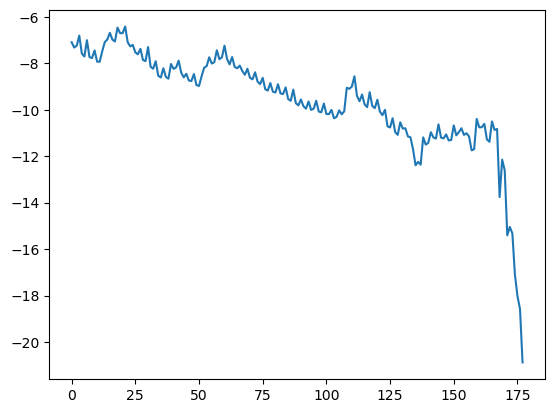

In [7]:
a = np.mean(np.max(Yx,axis=1).reshape(Yx.shape[0],-1),axis=-1)
plt.plot(a)

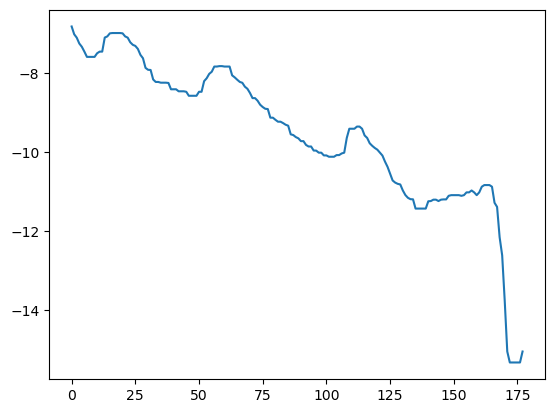

In [8]:
plt.plot(sg.medfilt(a,11))

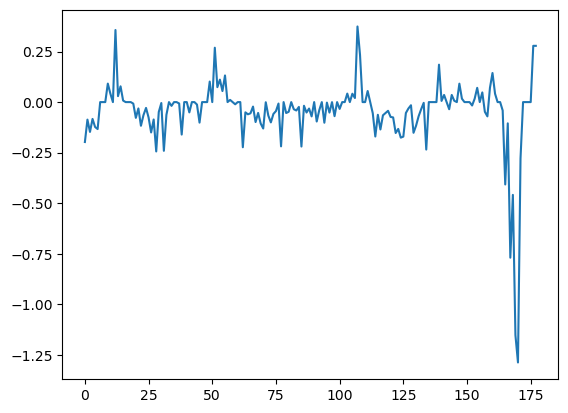

In [9]:
plt.plot(sg.savgol_filter(sg.medfilt(a,11),2,1,deriv=1))

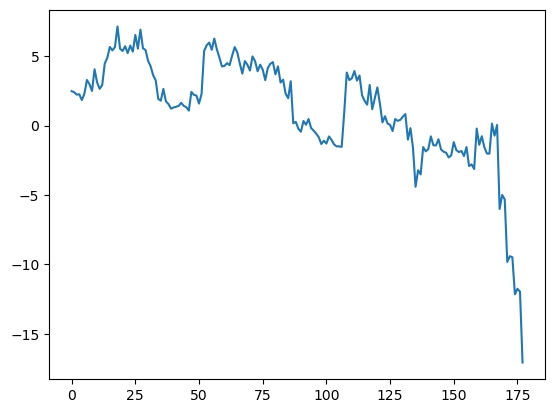

In [10]:
b = np.max(np.max(np.mean(Yx,axis=1),axis=-1),axis=-1)
plt.plot(b)

In [11]:
np.amax(Yx[150,...])

30.606768

In [12]:
%%time
f = h5py.File(r'D:\2p_data\david\dipping_only\6plex\220304_PL7\wells001\segtrack\segs\ch0\52_mean__\cellpose_model_1_o_relab042323_flow_aniso4_st0p4_blTrue_intFalse_3DeeC\seg\prob_movie_scale4AFS2PL4_dispdemons_toref30.mat','r')
#f = h5py.File(r'D:\2p_data\peter\dipping\20230922_PL28\wells001\segtrack\segs\ch0\31_mean__\cellpose_model_1_o_relab042323_flow_aniso4_st0p4_blTrue_intFalse_3DeeC\seg\prob_movie_scale4AFS2PL4_dispdemons_toref35.mat','r')
g = h5py.File(r'D:\2p_data\david\dipping_only\6plex\220304_PL7\wells001\segtrack\segs\ch0\52_mean__\cellpose_model_1_o_relab042323_flow_aniso4_st0p4_blTrue_intFalse_3DeeC\seg\prob_movie_scale2AFS2PL4_dispdemons_seq.mat','r')
#g = h5py.File(r'D:\2p_data\peter\dipping\20230922_PL28\wells001\segtrack\segs\ch0\31_mean__\cellpose_model_1_o_relab042323_flow_aniso4_st0p4_blTrue_intFalse_3DeeC\seg\prob_movie_scale2AFS2PL4_dispdemons_seq.mat','r')
disp = np.array(f.get('dispsdemref'))
disps = np.array(g.get('dispsdemseq'))
#data = np.array(data) # For converting to a NumPy array

CPU times: total: 1min 40s
Wall time: 2min


In [13]:
disp.shape

(3, 178, 30, 128, 113)

In [14]:
disps.shape

(3, 178, 30, 255, 225)

In [15]:
dispxyz = np.mean(disp.reshape(disp.shape[0],disp.shape[1],-1),axis=-1)
print(dispxyz.shape)

(3, 178)


In [628]:
(disp.transpose(-dispxyz).shape

ValueError: operands could not be broadcast together with shapes (3,178,30,128,113) (3,178) 

In [16]:
dispsxyz = np.mean(disps.reshape(disps.shape[0],disps.shape[1],-1),axis=-1)
print(dispsxyz.shape)

(3, 178)


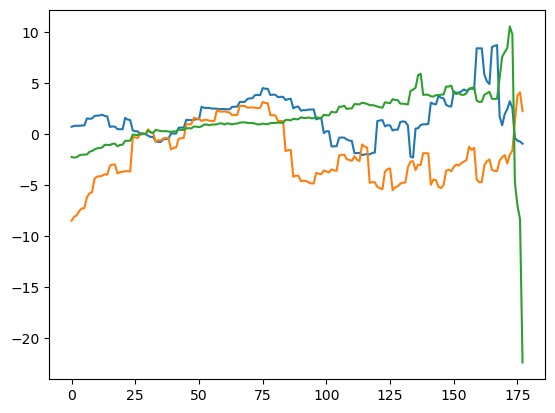

In [17]:
plt.plot(dispxyz.T)

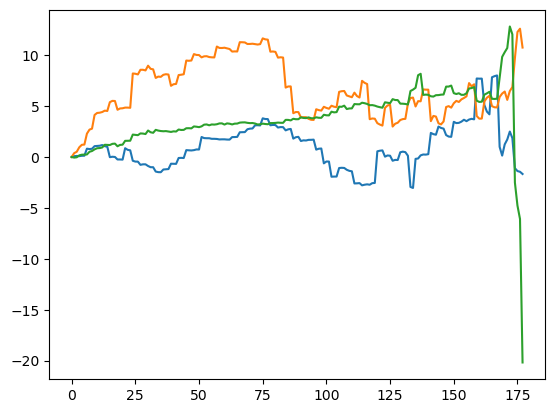

In [18]:
plt.plot(dispxyz.T-dispxyz[...,0])

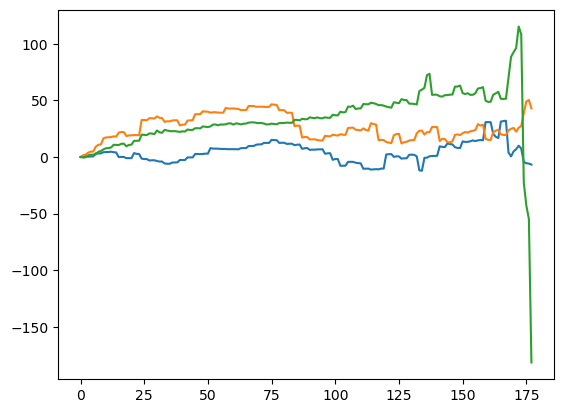

In [19]:
# correct for length factors
plt.plot(np.array([4*(dispxyz.T-dispxyz[...,0])[:,0],4*(dispxyz.T-dispxyz[...,0])[:,1],9*(dispxyz.T-dispxyz[...,0])[:,2]]).T)

In [27]:
((dispxyz.T-dispxyz[...,0])*np.array([4,4,9])).shape

(178, 3)

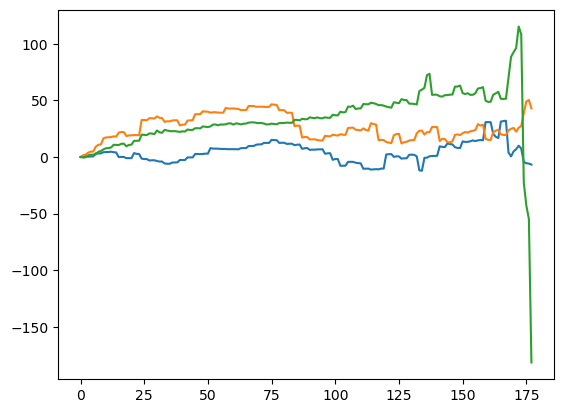

In [29]:
plt.plot(((dispxyz.T-dispxyz[...,0])*np.array([4,4,9])))

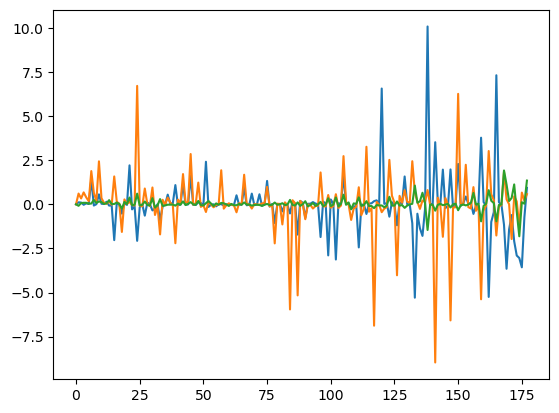

In [20]:
plt.plot(dispsxyz.T)

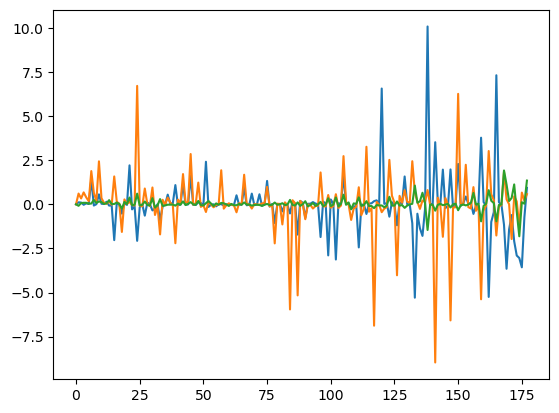

In [21]:
plt.plot(dispsxyz.T)

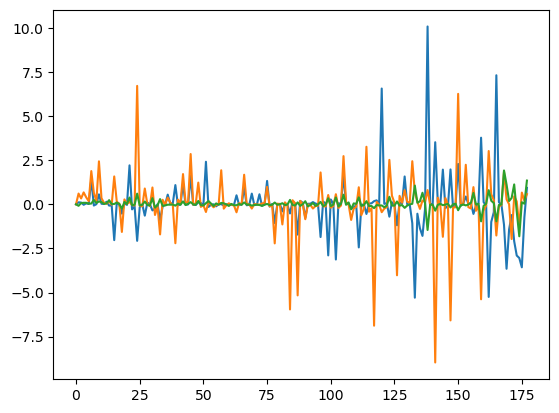

In [184]:
plt.plot(dispsxyz.T)

In [117]:
disp.shape

(3, 178, 30, 128, 113)

In [118]:
dispxyz.shape

(3, 178)

In [131]:
np.mean(np.linalg.norm((disp.transpose([2,3,4,0,1])-dispxyz).transpose([3,4,0,1,2]).reshape((disp.shape[0],disp.shape[1],-1))[:,0,...],axis=0))

1.946227049145013

In [132]:
mags = []
for i in trange(disp.shape[1]):
    mags.append(np.mean(np.linalg.norm((disp.transpose([2,3,4,0,1])-dispxyz).transpose([3,4,0,1,2]).reshape((disp.shape[0],disp.shape[1],-1))[:,i,...],axis=0)))

  0%|          | 0/178 [00:00<?, ?it/s]

In [629]:
def mags_calc(i):
    mags = np.mean(np.linalg.norm((disp.transpose([2,3,4,0,1])-dispxyz).transpose([3,4,0,1,2]).reshape((disp.shape[0],disp.shape[1],-1))[:,i,...]-(disp.transpose([2,3,4,0,1])-dispxyz).transpose([3,4,0,1,2]).reshape((disp.shape[0],disp.shape[1],-1))[:,0,...],axis=0))
    return mags

In [22]:
i = 30
np.mean(np.linalg.norm(
    (disp.transpose([2,3,4,0,1])-dispxyz).transpose([3,4,0,1,2]).reshape((disp.shape[0],disp.shape[1],-1))[:,i,...]-(disp.transpose([2,3,4,0,1])-dispxyz).transpose([3,4,0,1,2]).reshape((disp.shape[0],disp.shape[1],-1))[:,0,...]
    ,axis=0))

2.040734959457094

In [30]:
disp.shape

(3, 178, 30, 128, 113)

In [31]:
dispxyz.shape

(3, 178)

In [23]:
(disp.transpose([2,3,4,0,1])-dispxyz).transpose([3,4,0,1,2]).reshape((disp.shape[0],disp.shape[1],-1)).shape

(3, 178, 433920)

In [33]:
(disp.transpose([2,3,4,1,0])-dispxyz.T).shape

(30, 128, 113, 178, 3)

In [48]:
dispf = (disp.transpose([2,3,4,1,0])*np.array([4,4,9])).transpose([3,4,0,1,2])
dispf.shape

(178, 3, 30, 128, 113)

In [51]:
dispfm = np.mean(dispf.reshape(dispf.shape[0],dispf.shape[1],-1),axis=-1)
dispfm.shape

(178, 3)

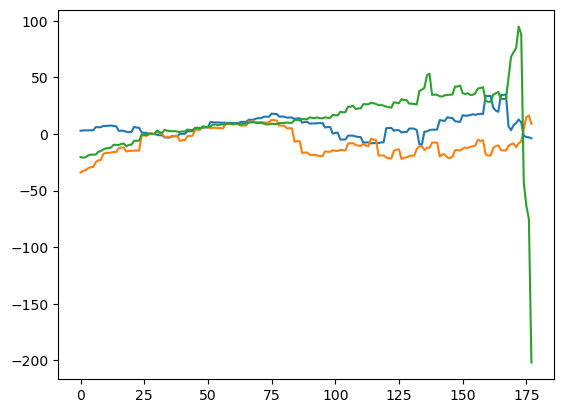

In [60]:
plt.plot(dispfm)

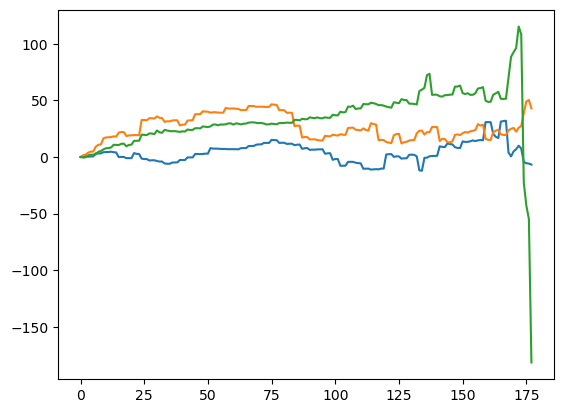

In [53]:
plt.plot(dispfm-dispfm[0,...])

In [89]:
(dispfm-dispfm[0,...]).shape

(178, 3)

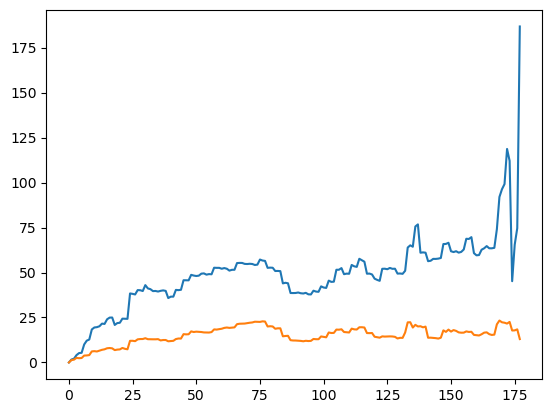

In [93]:
plt.plot(np.linalg.norm(dispfm-dispfm[0,...],axis=1))
plt.plot(mags)

In [57]:
dispfr = (dispf.transpose([2,3,4,0,1])-dispfm).transpose([3,4,0,1,2])
dispfr.shape

(178, 3, 30, 128, 113)

In [61]:
dispfr[29,0,10,10,10] #remember ref is 29 = 30-1 (python vs matlab order)

0.0

In [64]:
dispfr.reshape(dispfr.shape[0],dispfr.shape[1],-1).shape

(178, 3, 433920)

In [70]:
(dispfr-dispfr[0,...]).reshape(dispfr.shape[0],dispfr.shape[1],-1).shape

(178, 3, 433920)

In [69]:
(dispfr.reshape(dispfr.shape[0],dispfr.shape[1],-1)-dispfr.reshape(dispfr.shape[0],dispfr.shape[1],-1)[0,...]).shape

(178, 3, 433920)

In [72]:
i=30
np.mean(np.linalg.norm((dispfr-dispfr[0,...]).reshape(dispfr.shape[0],dispfr.shape[1],-1)[i,...],axis=0))

13.488608050403672

In [79]:
i=150 # mean across strain vectors is zero - because the translation has been removed, so the strain is all inside the volume
np.mean((dispfr-dispfr[0,...]).reshape(dispfr.shape[0],dispfr.shape[1],-1)[i,...])

-1.4755813745578482e-15

In [83]:
%%time
dispfrn = dispfr-dispfr[0,...]
def mags_calc(i):
    return np.mean(np.linalg.norm(dispfrn.reshape(dispfr.shape[0],dispfr.shape[1],-1)[i,...],axis=0))
    #return np.mean(np.linalg.norm((dispfr).reshape(dispfr.shape[0],dispfr.shape[1],-1)[i,...],axis=0))

n_cores = 30
with tqdm_joblib(tqdm(desc="Calculating mags...", total=dispfr.shape[0])) as progress_bar:
    results = Parallel(n_jobs=n_cores)(delayed(mags_calc)(i) for i in range(dispfr.shape[0]))

mags = np.asarray(results)
del results

Calculating mags...: 100%|███████████████████| 178/178 [00:06<00:00, 26.06it/s]

CPU times: total: 4.23 s
Wall time: 7.88 s


In [87]:
%%time
dispfrn = dispfr-dispfr[0,...]
magst = []
for i in trange(dispfr.shape[0]):
    magst.append(np.mean(np.linalg.norm(dispfrn.reshape(dispfr.shape[0],dispfr.shape[1],-1)[i,...],axis=0)))

  0%|          | 0/178 [00:00<?, ?it/s]

CPU times: total: 2.02 s
Wall time: 2.01 s


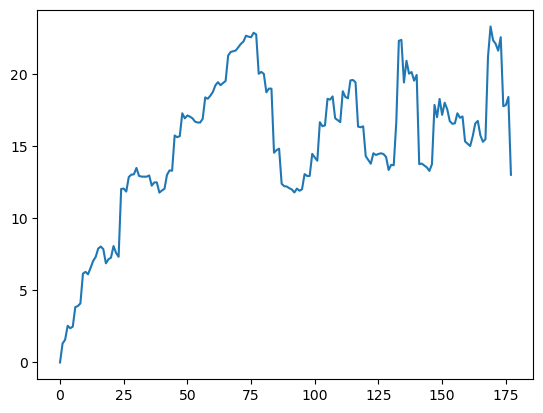

In [88]:
plt.plot(mags)

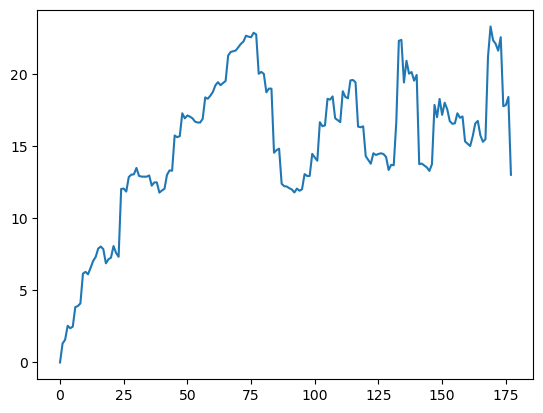

In [128]:
plt.plot(magst)

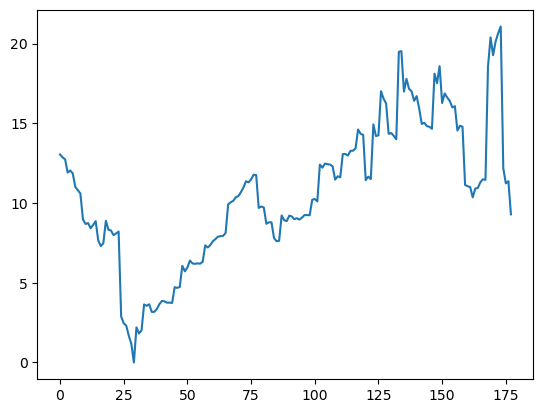

In [81]:
plt.plot(mags)

In [ ]:
i = 30
np.mean(np.linalg.norm(
    (disp.transpose([2,3,4,0,1])-dispxyz).transpose([3,4,0,1,2]).reshape((disp.shape[0],disp.shape[1],-1))[:,i,...]-(disp.transpose([2,3,4,0,1])-dispxyz).transpose([3,4,0,1,2]).reshape((disp.shape[0],disp.shape[1],-1))[:,0,...]
    ,axis=0))

In [63]:
(disp.transpose([2,3,4,0,1])-dispxyz).transpose([3,4,0,1,2]).reshape((disp.shape[0],disp.shape[1],-1)).shape

(3, 178, 433920)

In [36]:
disps.shape

(3, 178, 30, 255, 225)

In [ ]:
dispsxyzf = np.mean(disps.reshape(disps.shape[0],disps.shape[1],-1),axis=-1)
print(dispsxyzf.shape)

In [630]:
%%time
n_cores = 30
with tqdm_joblib(tqdm(desc="Calculating mags...", total=len(range(disp.shape[1])))) as progress_bar:
    results = Parallel(n_jobs=n_cores)(delayed(mags_calc)(i) for i in range(disp.shape[1]))

mags = np.asarray(results)
del results

Calculating mags...:   0%|          | 0/178 [00:00<?, ?it/s]

CPU times: total: 2.11 s
Wall time: 1min 9s


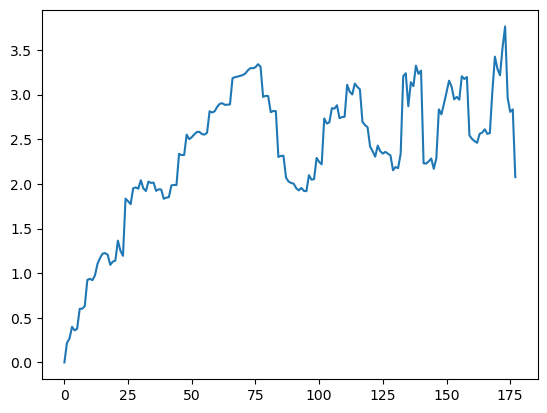

In [631]:
plt.plot(mags)

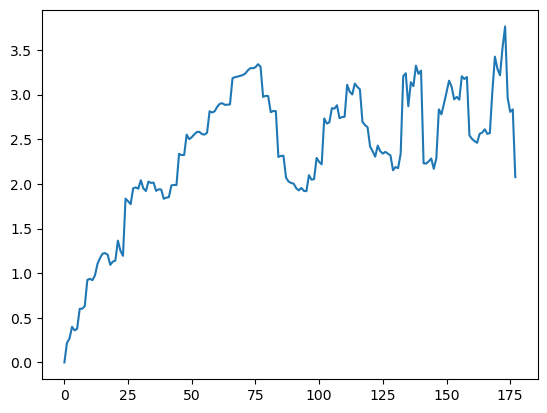

In [137]:
plt.plot(mags)

In [157]:
def magss_calc(i):
    magss = np.mean(np.linalg.norm((disps.transpose([2,3,4,0,1])-dispsxyz).transpose([3,4,0,1,2]).reshape((disps.shape[0],disps.shape[1],-1))[:,i,...]-(disps.transpose([2,3,4,0,1])-dispsxyz).transpose([3,4,0,1,2]).reshape((disps.shape[0],disps.shape[1],-1))[:,0,...],axis=0))
    return magss

In [170]:
def magss_calc(i):
    magss = np.mean(np.linalg.norm((disps.transpose([2,3,4,0,1])).transpose([3,4,0,1,2]).reshape((disps.shape[0],disps.shape[1],-1))[:,i,...]-(disps.transpose([2,3,4,0,1])).transpose([3,4,0,1,2]).reshape((disps.shape[0],disps.shape[1],-1))[:,0,...],axis=0))
    return magss

In [149]:
magss = []
for i in trange(disps.shape[1]):
    magss.append(np.mean(np.linalg.norm((disps.transpose([2,3,4,0,1])-dispsxyz).transpose([3,4,0,1,2]).reshape((disps.shape[0],disps.shape[1],-1))[:,i,...],axis=0)))

  0%|          | 0/51 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [171]:
%%time
n_cores = 30
with tqdm_joblib(tqdm(desc="Calculating magss...", total=len(range(disps.shape[1])))) as progress_bar:
    results = Parallel(n_jobs=n_cores)(delayed(magss_calc)(i) for i in range(disps.shape[1]))

magss4 = np.asarray(results)
del results

Calculating magss...: 100%|████████████████████| 51/51 [00:03<00:00, 12.96it/s]

CPU times: total: 1.38 s
Wall time: 3.94 s


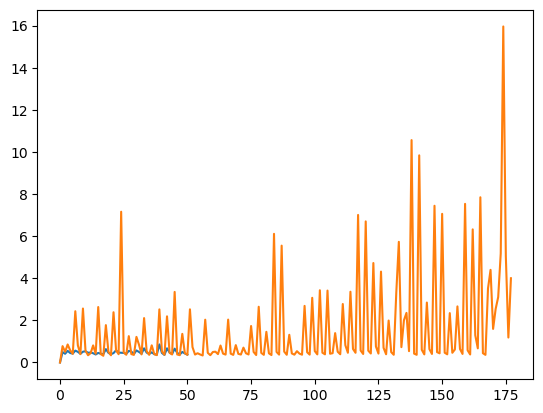

In [172]:
plt.plot(magss4)
plt.plot(magss3)

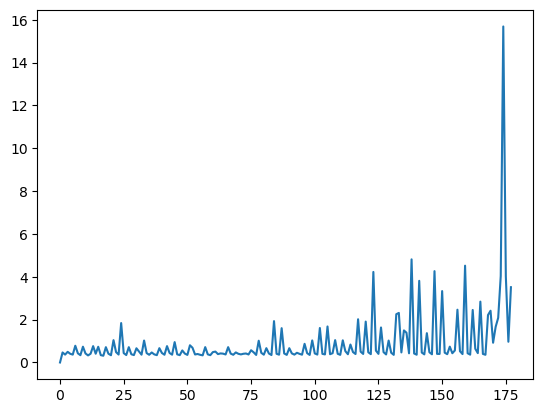

In [160]:
plt.plot(magss2)

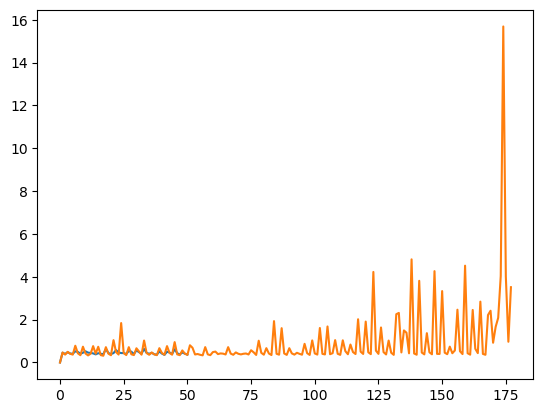

In [207]:
plt.plot(magss)
plt.plot(magss2)

In [ ]:
# final plan:
# 1. throw out obviously unstable dipping recordings (e.g. due to poor/wobbly mounting)
# 2. for the remaining ones, assume all displacement is intrinsic to the gel
# 3. plot something along the lines of fitted optic flow/residual optic flow
## essentially, the imregdemons (to ref vs sequential) quantifies distance between frames
## rerunning imregdemons on aligned/recellposed probmaps then quantifies residual distance
## sequential imregdemons is essentially the first derivative (dF) of warp - higher dF means more unstable
## recalculate sequential imregdemons on post-warp cellposes to quantify residual instability - or use sequential cross-correlations?

In [206]:
Yx.shape

(178, 30, 450, 510)

In [207]:
Yz = np.zeros((dispxyz.shape[1],Yx.shape[1],Yx.shape[2],Yx.shape[3]))
Ybool = np.zeros((dispxyz.shape[1],Yx.shape[1],Yx.shape[2],Yx.shape[3]))
Ybase = np.ones(Yx.shape[1:])
for i in trange(dispxyz.shape[1]):
    trans = sitk.TranslationTransform(3, np.array([4*dispxyz[0,i],4*dispxyz[1,i],dispxyz[2,i]]))
    #trans.SetInterpolator(sitk.sitkLinear)
    Yz[i,...] = sitk.GetArrayFromImage(sitk.Resample(sitk.GetImageFromArray(Yx[i,...]),trans))
    Ybool[i,...] = sitk.GetArrayFromImage(sitk.Resample(sitk.GetImageFromArray(Ybase),trans))

  0%|          | 0/178 [00:00<?, ?it/s]

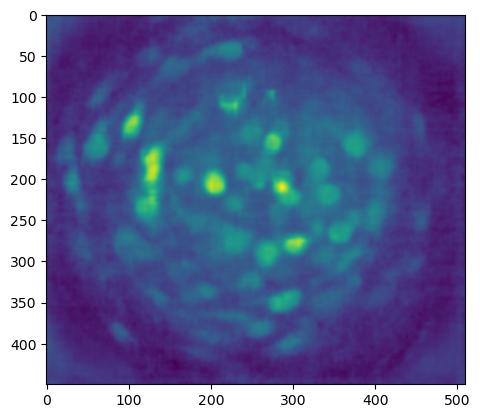

In [208]:
plt.imshow(Yx[90,10,...])

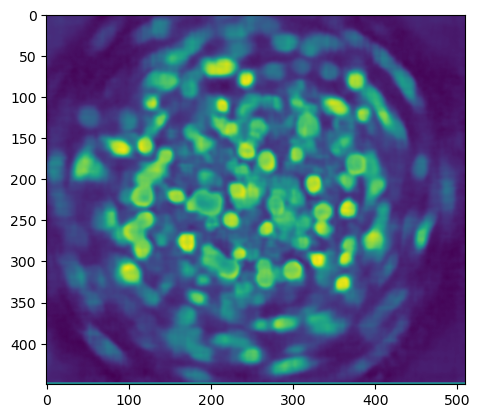

In [209]:
plt.imshow(Yz[30,15,...])

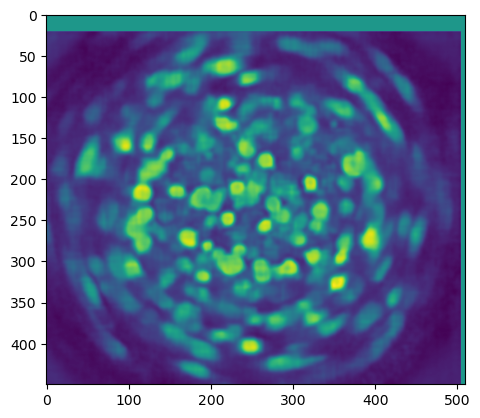

In [210]:
plt.imshow(Yz[120,15,...])

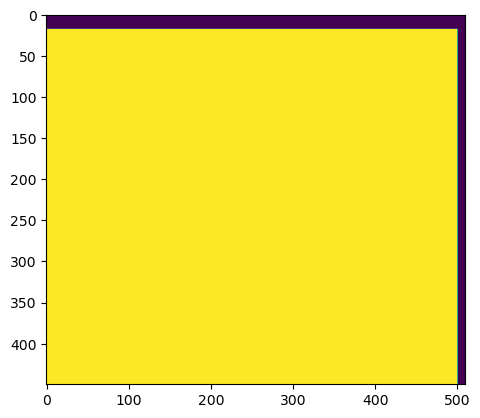

In [386]:
plt.imshow(Ybool[90,10,...])

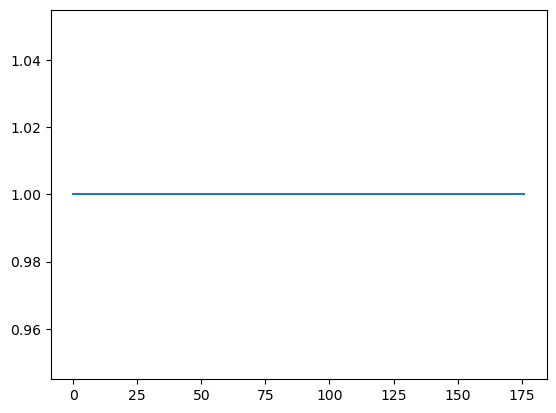

In [391]:
plt.plot(Ybool[:177,15,200,200])

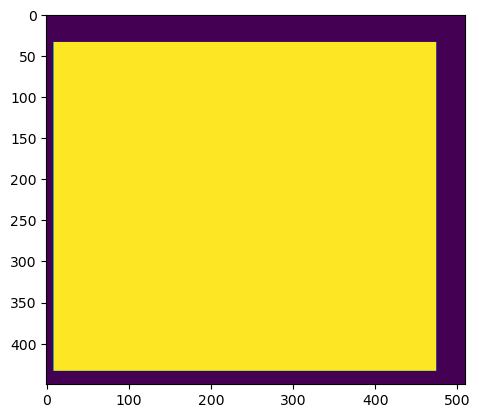

In [568]:
plt.imshow(np.min(Ybool[:177,...],axis=0)[15,...])

In [216]:
%%time
Yzb = Yz*np.min(Ybool[:177,...],axis=0)
Yxb = Yx*np.min(Ybool[:177,...],axis=0)

CPU times: total: 28.1 s
Wall time: 28.1 s


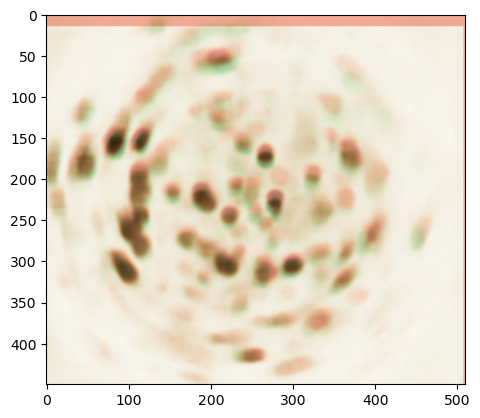

In [230]:
plt.imshow(Yx[30,10,...],cmap='Greens')
plt.imshow(Yz[20,10,...], cmap='Reds', alpha=0.5)

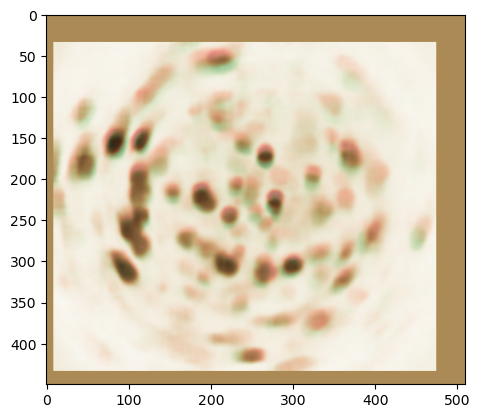

In [570]:
plt.imshow(Yxb[30,10,...],cmap='Greens')
plt.imshow(Yzb[20,10,...], cmap='Reds', alpha=0.5)

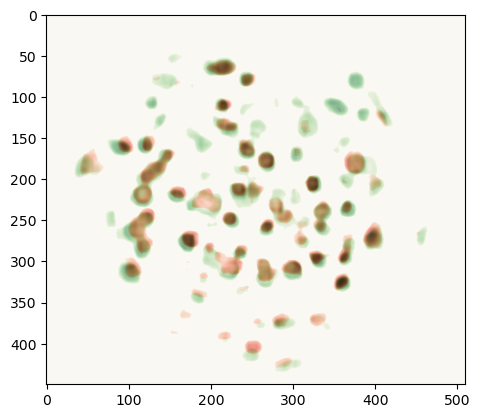

In [526]:
plt.imshow(Yz[30,15,...]*(Yz[30,15,...]>5),cmap='Greens')
plt.imshow(Yz[90,15,...]*(Yz[90,15,...]>5), cmap='Reds', alpha=0.5)

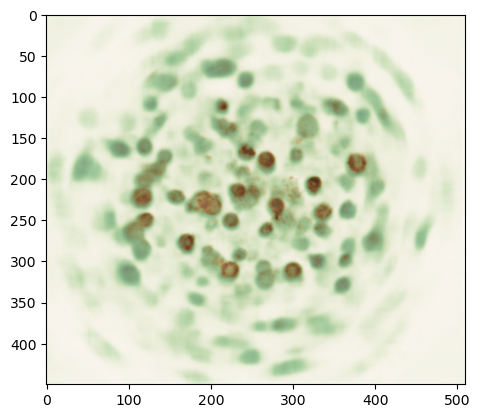

In [212]:
plt.imshow(Yx[30,15,...],cmap='Greens')
plt.imshow(Yy[45,15,...], cmap='Reds', alpha=0.5)

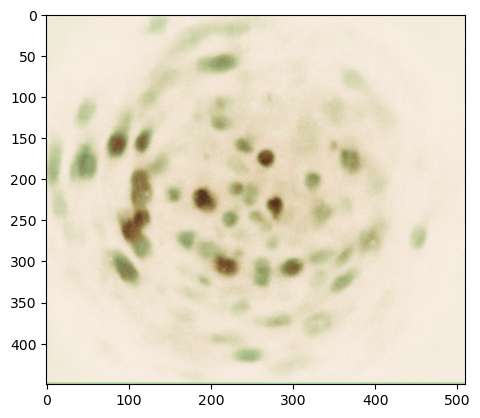

In [213]:
k=30
plt.imshow(Yz[k,10,...],cmap='Greens')
plt.imshow(Yy[k,10,...], cmap='Reds', alpha=0.5)

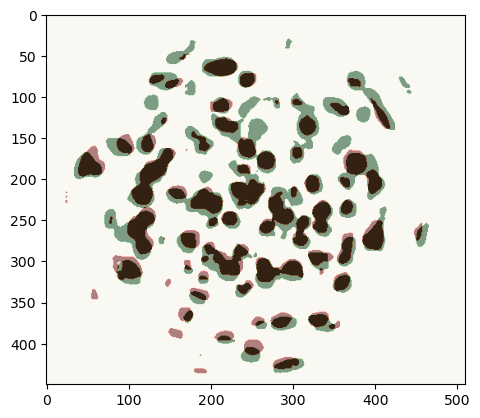

In [283]:
plt.imshow(Yz[30,15,...]>0,cmap='Greens')
plt.imshow(Yz[90,15,...]>0, cmap='Reds', alpha=0.5)

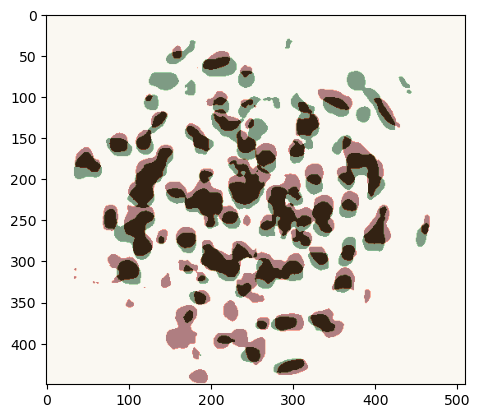

In [619]:
plt.imshow(Yz[30,15,...]>0,cmap='Greens')
plt.imshow(Yz[0,15,...]>0, cmap='Reds', alpha=0.5)

In [443]:
np.mean(Yz[120,15,...])

-15.505879438200475

In [215]:
Yz.shape

(178, 30, 450, 510)

In [529]:
%%time
sme.hausdorff_distance(Yz[30,...]>0,Yz[90,...]>0)

CPU times: total: 1.86 s
Wall time: 1.85 s


56.87706040223949

In [431]:
%%time
sme.adapted_rand_error(Yz[30,...]>0,Yz[90,...]>0,alpha=1)

CPU times: total: 344 ms
Wall time: 342 ms


(0.48871326860231945, 0.5112867313976805, 1.0)

In [402]:
%%time
1-sp.distance.jaccard((Yx[30,...]*np.min(Ybool[:177,...],axis=0)).flatten()>0,(Yx[90,...]*np.min(Ybool[:177,...],axis=0)).flatten()>0)

CPU times: total: 5.08 s
Wall time: 5.09 s


0.1125425317580605

In [488]:
%%time
1-sp.distance.jaccard((Yz[30,...]).flatten()>0,(Yz[31,...]).flatten()>0)

CPU times: total: 109 ms
Wall time: 117 ms


0.8534169357423753

In [211]:
# probably the fairest and fastest solution is a modified Jaccard - intersection/total magnitude of the smaller of the two sets
ja = (Yz[30,...]*np.min(Ybool[:177,...],axis=0)).flatten()>0
jb = (Yz[75,...]*np.min(Ybool[:177,...],axis=0)).flatten()>0
np.sum(ja*jb)/np.min([np.sum(ja>0),np.sum(jb>0)])

0.6979816091954023

In [212]:
# probably the fairest and fastest solution is a modified Jaccard - intersection/total magnitude of the smaller of the two sets
ja = Yz[30,...].flatten()>0
jb = Yz[75,...].flatten()>0
np.sum(ja*jb)/np.min([np.sum(ja>0),np.sum(jb>0)])

0.6820181979987625

In [544]:
np.sum(ja*jb)

36979

In [545]:
np.sum(ja>0)

249331

In [546]:
np.sum(jb>0)

116226

In [495]:
%%time
sme.variation_of_information((Yx[30,...]).flatten()>0,(Yx[90,...]).flatten()>0)

CPU times: total: 344 ms
Wall time: 348 ms


array([0.29336328, 0.36368374])

In [580]:
%%time
ay = st.rescale(Yz[30,...]*np.min(Ybool[:177,...],axis=0)*(Yz[30,...]>0),(1,1/4,1/4),anti_aliasing=True)
by = st.rescale(Yz[75,...]*np.min(Ybool[:177,...],axis=0)*(Yz[75,...]>0),(1,1/4,1/4),anti_aliasing=True)
sf.match_template(ay,by)[0,0,0]

CPU times: total: 7.72 s
Wall time: 7.72 s


0.6830058478455245

In [586]:
%%time
ay = st.rescale(Yxb[30,...]*(Yx[30,...]>0),(1,1/4,1/4),anti_aliasing=True)
by = st.rescale(Yxb[120,...]*(Yx[120,...]>0),(1,1/4,1/4),anti_aliasing=True)
sf.match_template(ay,by)[0,0,0]

CPU times: total: 3.66 s
Wall time: 3.66 s


0.14463605301244065

In [582]:
Yz.shape

(178, 30, 450, 510)

In [ ]:
(delayed(sf.match_template)(st.rescale(Yzb[30,...]*(Yzb[30,...]>0),(1,1/4,1/4),anti_aliasing=True)>0,st.rescale(Yzb[i+1,...]*(Yzb[i+1,...]>0),(1,1/4,1/4),anti_aliasing=True)>0) for i in range(Yz.shape[0]-1))

Yzbcorrsto30 = np.asarray(results)
del results

In [531]:
%%time
sme.hausdorff_distance(ay,by)

CPU times: total: 125 ms
Wall time: 120 ms


10.63014581273465

In [479]:
ay[5:25,10:110,10:110].shape

(20, 100, 100)

In [483]:
sf.match_template(ay[15,10:110,10:110],by[15,10:110,10:110])[0,0]

0.6713692897219657

In [473]:
np.max(ay)

30.112051799844437

In [474]:
np.max(by)

30.242995559738635

In [499]:
np.max([np.max(ay),np.max(by)])

30.112051799844437

In [509]:
ayy = Yz[30,...]*np.min(Ybool[:177,...],axis=0)
byy = Yz[120,...]*np.min(Ybool[:177,...],axis=0)
sme.peak_signal_noise_ratio(ayy,byy,data_range=np.max([np.max(ayy),np.max(byy)])-np.min([np.min(ayy),np.min(byy)]))

23.982344799375518

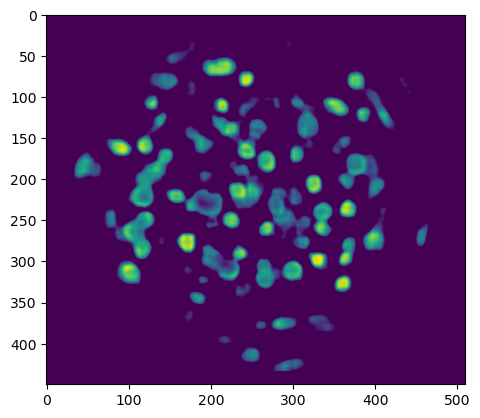

In [470]:
plt.imshow((Yz[30,...]*np.min(Ybool[:177,...],axis=0)*(Yz[30,...]>0))[15,...])

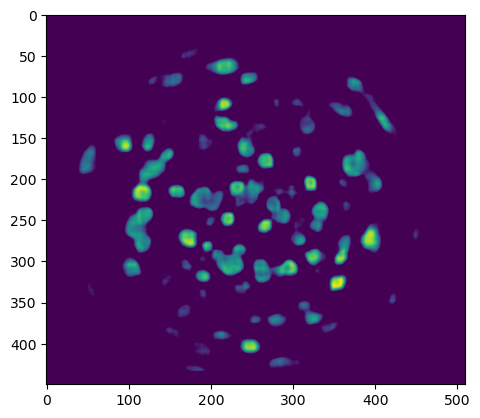

In [471]:
plt.imshow((Yz[120,...]*np.min(Ybool[:177,...],axis=0)*(Yz[120,...]>0))[15,...])

In [537]:
%%time
ba = sf.blob_dog((Yz[30,...]*np.min(Ybool[:177,...],axis=0)*(Yz[30,...]>0)),min_sigma=(2,8,8))

CPU times: total: 19.7 s
Wall time: 19.7 s


In [538]:
%%time
bb = sf.blob_dog((Yz[120,...]*np.min(Ybool[:177,...],axis=0)*(Yz[120,...]>0)),min_sigma=(2,8,8))

CPU times: total: 18.8 s
Wall time: 18.7 s


In [539]:
ba

array([[ 15.,  64., 212.,   2.,   8.,   8.],
       [ 15., 277., 171.,   2.,   8.,   8.],
       [ 15., 314., 101.,   2.,   8.,   8.],
       [ 15., 162.,  89.,   2.,   8.,   8.],
       [ 16., 112., 352.,   2.,   8.,   8.],
       [ 16., 274., 399.,   2.,   8.,   8.],
       [ 15., 216., 240.,   2.,   8.,   8.],
       [ 13., 177., 269.,   2.,   8.,   8.],
       [ 16.,  80., 377.,   2.,   8.,   8.],
       [ 14., 311., 300.,   2.,   8.,   8.],
       [ 14., 205., 325.,   2.,   8.,   8.],
       [ 15., 327., 361.,   2.,   8.,   8.],
       [ 16., 299., 331.,   2.,   8.,   8.],
       [ 16., 237., 367.,   2.,   8.,   8.],
       [ 13., 183.,  46.,   2.,   8.,   8.],
       [ 16., 255., 336.,   2.,   8.,   8.],
       [ 13., 263., 104.,   2.,   8.,   8.],
       [ 15., 164., 244.,   2.,   8.,   8.],
       [ 14., 158., 119.,   2.,   8.,   8.],
       [ 17., 157., 188.,   2.,   8.,   8.],
       [ 16.,  80., 244.,   2.,   8.,   8.],
       [ 14., 250., 225.,   2.,   8.,   8.],
       [ 1

In [540]:
bb

array([[ 16., 273., 395.,   2.,   8.,   8.],
       [ 15., 216., 116.,   2.,   8.,   8.],
       [ 16., 273., 173.,   2.,   8.,   8.],
       [ 16., 327., 354.,   2.,   8.,   8.],
       [ 16., 403., 249.,   2.,   8.,   8.],
       [ 15.,  63., 217.,   2.,   8.,   8.],
       [ 15., 158.,  94.,   2.,   8.,   8.],
       [ 15., 308., 294.,   2.,   8.,   8.],
       [ 15., 304., 223.,   2.,   8.,   8.],
       [ 16., 183., 374.,   2.,   8.,   8.],
       [ 17., 132., 411.,   2.,   8.,   8.],
       [ 16., 189., 130.,   2.,   8.,   8.],
       [ 15., 251., 113.,   2.,   8.,   8.],
       [ 16., 296., 326.,   2.,   8.,   8.],
       [ 15., 212., 235.,   2.,   8.,   8.],
       [ 16., 289., 360.,   2.,   8.,   8.],
       [ 17., 116., 358.,   2.,   8.,   8.],
       [ 16., 110., 215.,   2.,   8.,   8.],
       [ 16., 242., 334.,   2.,   8.,   8.],
       [ 15., 178., 267.,   2.,   8.,   8.],
       [ 15., 134., 218.,   2.,   8.,   8.],
       [ 12., 232., 278.,   2.,   8.,   8.],
       [ 1

In [468]:
sf.match_template(np.zeros((10,10)),np.zeros((10,10)))

array([[0.]])

In [395]:
np.min(Ybool[:177,...],axis=0).shape

(30, 450, 510)

In [396]:
Yz[30,...].shape

(30, 450, 510)

In [290]:
%%time
sf.match_template(st.rescale(Yx[30,...],(1,1/4,1/4),anti_aliasing=True)>0,st.rescale(Yx[90,...],(1,1/4,1/4),anti_aliasing=True)>0)[0,0,0]

CPU times: total: 4.06 s
Wall time: 4.07 s


0.15782149558380454

In [269]:
%%time
ss.spearmanr(st.rescale(Yx[30,...],(1,1/4,1/4)).flatten(),st.rescale(Yx[90,...],(1,1/4,1/4)).flatten())

CPU times: total: 547 ms
Wall time: 552 ms


SignificanceResult(statistic=0.7597178698876128, pvalue=0.0)

In [216]:
%%time
sf.match_template(Yx[0,...],Yx[0,...])[0,0,0]

CPU times: total: 37.6 s
Wall time: 37.6 s


0.9999991

In [217]:
%%time
sf.match_template(st.rescale(Yx[0,...],(1,1/4,1/4)),st.rescale(Yx[0,...],(1,1/4,1/4)))[0,0,0]

CPU times: total: 2.25 s
Wall time: 2.25 s


0.99999994

In [234]:
sf.match_template(st.rescale(Yx[0,...],(1,1/4,1/4)),st.rescale(Yx[0,...],(1,1/4,1/4)))

array([[[0.99999994]]], dtype=float32)

In [26]:
%%time
sf.match_template(Yz[0,...],Yz[30,...])[0,0,0]

CPU times: total: 1min 8s
Wall time: 1min 8s


0.7120980226609118

In [35]:
%%time
sf.match_template(st.rescale(Yz[0,...],(1,1/4,1/4),anti_aliasing=True),st.rescale(Yz[30,...],(1,1/4,1/4),anti_aliasing=True))[0,0,0]

CPU times: total: 3.98 s
Wall time: 3.98 s


0.7510350772923274

In [28]:
%%time
sf.match_template(Yy[0,...],Yy[30,...])[0,0,0]

CPU times: total: 42.5 s
Wall time: 1min


0.83005744

In [38]:
%%time
sf.match_template(st.rescale(Yy[0,...],(1,1/4,1/4),anti_aliasing=True),st.rescale(Yy[30,...],(1,1/4,1/4),anti_aliasing=True))[0,0,0]

CPU times: total: 3.27 s
Wall time: 3.26 s


0.85324

In [291]:
%%time
n_cores = 30
with tqdm_joblib(tqdm(desc="Correlating...", total=len(range(Yz.shape[0]))-1)) as progress_bar:
    results = Parallel(n_jobs=n_cores)(delayed(sf.match_template)(st.rescale(Yz[0,...],(1,1/4,1/4),anti_aliasing=True)>0,st.rescale(Yz[i+1,...],(1,1/4,1/4),anti_aliasing=True)>0) for i in range(Yz.shape[0]-1))

Yzcorrsto0 = np.asarray(results)
del results

Correlating...:   0%|          | 0/177 [00:00<?, ?it/s]

CPU times: total: 1min 48s
Wall time: 1min 58s


In [292]:
%%time
n_cores = 30
with tqdm_joblib(tqdm(desc="Correlating...", total=len(range(Yz.shape[0]))-1)) as progress_bar:
    results = Parallel(n_jobs=n_cores)(delayed(sf.match_template)(st.rescale(Yz[30,...],(1,1/4,1/4),anti_aliasing=True)>0,st.rescale(Yz[i+1,...],(1,1/4,1/4),anti_aliasing=True)>0) for i in range(Yz.shape[0]-1))

Yzcorrsto30 = np.asarray(results)
del results

Correlating...:   0%|          | 0/177 [00:00<?, ?it/s]

CPU times: total: 1min 50s
Wall time: 2min


In [219]:
%%time
n_cores = 30
with tqdm_joblib(tqdm(desc="Correlating...", total=len(range(Yz.shape[0]))-1)) as progress_bar:
    results = Parallel(n_jobs=n_cores)(delayed(sf.match_template)(st.rescale(Yz[i,...],(1,1/4,1/4),anti_aliasing=True),st.rescale(Yz[i+1,...],(1,1/4,1/4),anti_aliasing=True)) for i in range(Yz.shape[0]-1))

Yzcorrs = np.asarray(results)
del results

Correlating...: 100%|████████████████████████| 177/177 [01:59<00:00,  1.48it/s]

CPU times: total: 1min 49s
Wall time: 1min 59s


In [190]:
%%time
n_cores = 30
with tqdm_joblib(tqdm(desc="Correlating...", total=len(range(Yy.shape[0]))-1)) as progress_bar:
    results = Parallel(n_jobs=n_cores)(delayed(sf.match_template)(st.rescale(Yy[i,...],(1,1/4,1/4),anti_aliasing=True),st.rescale(Yy[i+1,...],(1,1/4,1/4),anti_aliasing=True)) for i in range(Yy.shape[0]-1))

Yycorrs = np.asarray(results)
del results

Correlating...: 100%|████████████████████████| 188/188 [04:33<00:00,  1.45s/it]

CPU times: total: 3min 50s
Wall time: 4min 33s


In [293]:
%%time
n_cores = 30
with tqdm_joblib(tqdm(desc="Correlating...", total=len(range(Yx.shape[0]))-1)) as progress_bar:
    results = Parallel(n_jobs=n_cores)(delayed(sf.match_template)(st.rescale(Yx[0,...],(1,1/4,1/4),anti_aliasing=True)>0,st.rescale(Yx[i+1,...],(1,1/4,1/4),anti_aliasing=True)>0) for i in range(Yx.shape[0]-1))

Yxcorrsto0 = np.asarray(results)
del results

Correlating...:   0%|          | 0/177 [00:00<?, ?it/s]

CPU times: total: 1min 26s
Wall time: 1min 37s


In [294]:
%%time
n_cores = 30
with tqdm_joblib(tqdm(desc="Correlating...", total=len(range(Yx.shape[0]))-1)) as progress_bar:
    results = Parallel(n_jobs=n_cores)(delayed(sf.match_template)(st.rescale(Yx[30,...],(1,1/4,1/4),anti_aliasing=True)>0,st.rescale(Yx[i+1,...],(1,1/4,1/4),anti_aliasing=True)>0) for i in range(Yx.shape[0]-1))

Yxcorrsto30 = np.asarray(results)
del results

Correlating...:   0%|          | 0/177 [00:00<?, ?it/s]

CPU times: total: 1min 28s
Wall time: 1min 34s


In [205]:
%%time
n_cores = 30
with tqdm_joblib(tqdm(desc="Correlating...", total=len(range(Yx.shape[0]))-1)) as progress_bar:
    results = Parallel(n_jobs=n_cores)(delayed(sf.match_template)(st.rescale(Yx[i,...],(1,1/4,1/4),anti_aliasing=True),st.rescale(Yx[i+1,...],(1,1/4,1/4),anti_aliasing=True)) for i in range(Yx.shape[0]-1))

Yxcorrs = np.asarray(results)
del results

Correlating...: 100%|████████████████████████| 177/177 [01:30<00:00,  1.96it/s]

CPU times: total: 1min 24s
Wall time: 1min 30s


In [571]:
%%time
n_cores = 30
with tqdm_joblib(tqdm(desc="Correlating...", total=len(range(Yz.shape[0]))-1)) as progress_bar:
    results = Parallel(n_jobs=n_cores)(delayed(sf.match_template)(st.rescale(Yzb[30,...]*(Yzb[30,...]>0),(1,1/4,1/4),anti_aliasing=True)>0,st.rescale(Yzb[i+1,...]*(Yzb[i+1,...]>0),(1,1/4,1/4),anti_aliasing=True)>0) for i in range(Yz.shape[0]-1))

Yzbcorrsto30 = np.asarray(results)
del results

Correlating...:   0%|          | 0/177 [00:00<?, ?it/s]

CPU times: total: 2min 11s
Wall time: 2min 16s


In [587]:
%%time
n_cores = 30
with tqdm_joblib(tqdm(desc="Correlating...", total=len(range(Yz.shape[0]))-1)) as progress_bar:
    results = Parallel(n_jobs=n_cores)(delayed(sf.match_template)(st.rescale(Yzb[30,...]*(Yzb[30,...]>0),(1,1/4,1/4),anti_aliasing=True),st.rescale(Yzb[i+1,...]*(Yzb[i+1,...]>0),(1,1/4,1/4),anti_aliasing=True)) for i in range(Yz.shape[0]-1))

Yzbcorrsto30c = np.asarray(results)
del results

Correlating...:   0%|          | 0/177 [00:00<?, ?it/s]

CPU times: total: 2min 15s
Wall time: 2min 25s


In [598]:
%%time
n_cores = 30
with tqdm_joblib(tqdm(desc="Correlating...", total=Yz.shape[0])) as progress_bar:
    results = Parallel(n_jobs=n_cores)(delayed(sf.match_template)(st.rescale(Yzb[0,...]*(Yzb[0,...]>0),(1,1/4,1/4),anti_aliasing=True),st.rescale(Yzb[i,...]*(Yzb[i,...]>0),(1,1/4,1/4),anti_aliasing=True)) for i in range(Yz.shape[0]))

Yzbcorrsto0c = np.asarray(results)
del results

Correlating...:   0%|          | 0/178 [00:00<?, ?it/s]

CPU times: total: 2min 21s
Wall time: 2min 28s


In [572]:
%%time
n_cores = 30
with tqdm_joblib(tqdm(desc="Correlating...", total=len(range(Yx.shape[0]))-1)) as progress_bar:
    results = Parallel(n_jobs=n_cores)(delayed(sf.match_template)(st.rescale(Yxb[30,...]*(Yxb[30,...]>0),(1,1/4,1/4),anti_aliasing=True)>0,st.rescale(Yxb[i+1,...]*(Yxb[i+1,...]>0),(1,1/4,1/4),anti_aliasing=True)>0) for i in range(Yx.shape[0]-1))

Yxbcorrsto30 = np.asarray(results)
del results

Correlating...:   0%|          | 0/177 [00:00<?, ?it/s]

CPU times: total: 2min 7s
Wall time: 2min 14s


In [591]:
%%time
n_cores = 30
with tqdm_joblib(tqdm(desc="Correlating...", total=len(range(Yx.shape[0]))-1)) as progress_bar:
    results = Parallel(n_jobs=n_cores)(delayed(sf.match_template)(st.rescale(Yxb[30,...]*(Yxb[30,...]>0),(1,1/4,1/4),anti_aliasing=True),st.rescale(Yxb[i+1,...]*(Yxb[i+1,...]>0),(1,1/4,1/4),anti_aliasing=True)) for i in range(Yx.shape[0]-1))

Yxbcorrsto30c = np.asarray(results)
del results

Correlating...:   0%|          | 0/177 [00:00<?, ?it/s]

CPU times: total: 2min 19s
Wall time: 2min 30s


In [599]:
%%time
n_cores = 30
with tqdm_joblib(tqdm(desc="Correlating...", total=Yx.shape[0])) as progress_bar:
    results = Parallel(n_jobs=n_cores)(delayed(sf.match_template)(st.rescale(Yxb[0,...]*(Yxb[0,...]>0),(1,1/4,1/4),anti_aliasing=True),st.rescale(Yxb[i,...]*(Yxb[i,...]>0),(1,1/4,1/4),anti_aliasing=True)) for i in range(Yx.shape[0]))

Yxbcorrsto0c = np.asarray(results)
del results

Correlating...:   0%|          | 0/178 [00:00<?, ?it/s]

CPU times: total: 2min 17s
Wall time: 2min 28s


In [604]:
%%time
Yzbjto30 = np.zeros(Yx.shape[0])
ja = Yzb[30,...].flatten()>0
for i in trange(Yx.shape[0]):
    jb = Yzb[i,...].flatten()>0
    #Yzbjto30[i] = np.sum(ja*jb)/(2*np.min([np.sum(ja>0),np.sum(jb>0)])-np.sum(ja*jb))
    Yzbjto30[i] = np.sum(ja*jb)/np.min([np.sum(ja>0),np.sum(jb>0)])

  0%|          | 0/178 [00:00<?, ?it/s]

<timed exec>:6: RuntimeWarning: invalid value encountered in scalar divide


CPU times: total: 14.4 s
Wall time: 14.4 s


In [217]:
%%time
Yzbjto0 = np.zeros(Yx.shape[0])
ja = Yzb[0,...].flatten()>0
for i in trange(Yx.shape[0]):
    jb = Yzb[i,...].flatten()>0
    #Yzbjto0[i] = np.sum(ja*jb)/(2*np.min([np.sum(ja>0),np.sum(jb>0)])-np.sum(ja*jb))
    Yzbjto0[i] = np.sum(ja*jb)/np.min([np.sum(ja>0),np.sum(jb>0)])

  0%|          | 0/178 [00:00<?, ?it/s]

<timed exec>:6: RuntimeWarning: invalid value encountered in scalar divide


CPU times: total: 13.8 s
Wall time: 13.7 s


In [213]:
%%time
Yzjto0 = np.zeros(Yx.shape[0])
ja = Yz[0,...].flatten()>0
for i in trange(Yx.shape[0]):
    jb = Yz[i,...].flatten()>0
    #Yzbjto0[i] = np.sum(ja*jb)/(2*np.min([np.sum(ja>0),np.sum(jb>0)])-np.sum(ja*jb))
    Yzjto0[i] = np.sum(ja*jb)/np.min([np.sum(ja>0),np.sum(jb>0)])

  0%|          | 0/178 [00:00<?, ?it/s]

CPU times: total: 13.8 s
Wall time: 13.8 s


<timed exec>:6: RuntimeWarning: invalid value encountered in scalar divide


In [606]:
%%time
Yxbjto30 = np.zeros(Yx.shape[0])
ja = Yxb[30,...].flatten()>0
for i in trange(Yx.shape[0]):
    jb = Yxb[i,...].flatten()>0
    #Yxbjto30[i] = np.sum(ja*jb)/(2*np.min([np.sum(ja>0),np.sum(jb>0)])-np.sum(ja*jb))
    Yxbjto30[i] = np.sum(ja*jb)/np.min([np.sum(ja>0),np.sum(jb>0)])

  0%|          | 0/178 [00:00<?, ?it/s]

<timed exec>:6: RuntimeWarning: invalid value encountered in scalar divide


CPU times: total: 15.5 s
Wall time: 15.5 s


In [607]:
%%time
Yxbjto0 = np.zeros(Yx.shape[0])
ja = Yxb[0,...].flatten()>0
for i in trange(Yx.shape[0]):
    jb = Yxb[i,...].flatten()>0
    #Yxbjto0[i] = np.sum(ja*jb)/(2*np.min([np.sum(ja>0),np.sum(jb>0)])-np.sum(ja*jb))
    Yxbjto0[i] = np.sum(ja*jb)/np.min([np.sum(ja>0),np.sum(jb>0)])

  0%|          | 0/178 [00:00<?, ?it/s]

<timed exec>:6: RuntimeWarning: invalid value encountered in scalar divide


CPU times: total: 14.5 s
Wall time: 14.5 s


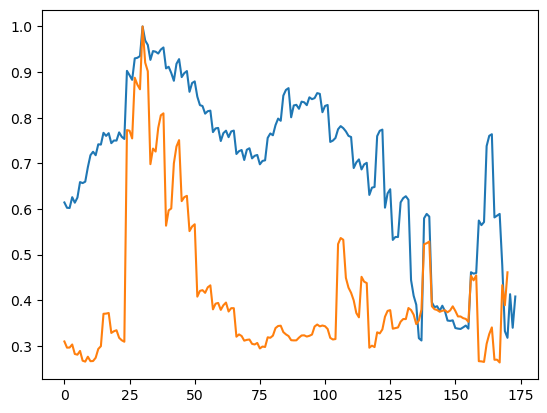

In [608]:
plt.plot(Yzbjto30)
plt.plot(Yxbjto30)

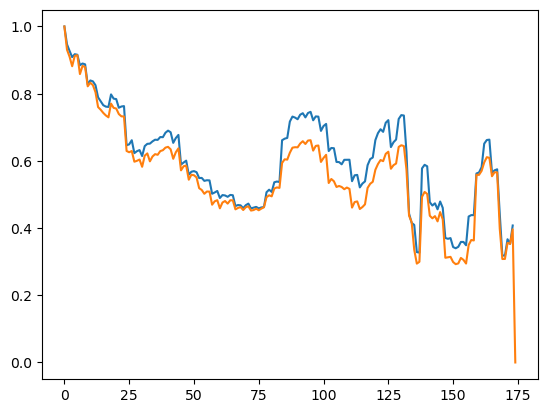

In [218]:
plt.plot(Yzbjto0)
plt.plot(Yzjto0)

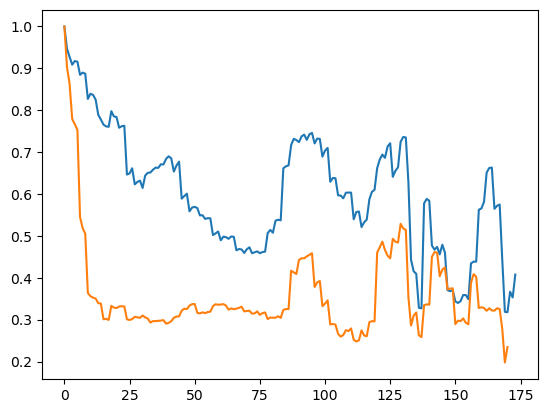

In [609]:
plt.plot(Yzbjto0)
plt.plot(Yxbjto0)

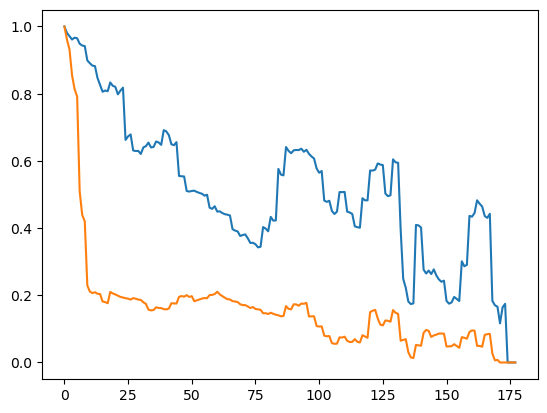

In [603]:
plt.plot(Yzbcorrsto0c.flatten())
plt.plot(Yxbcorrsto0c.flatten())

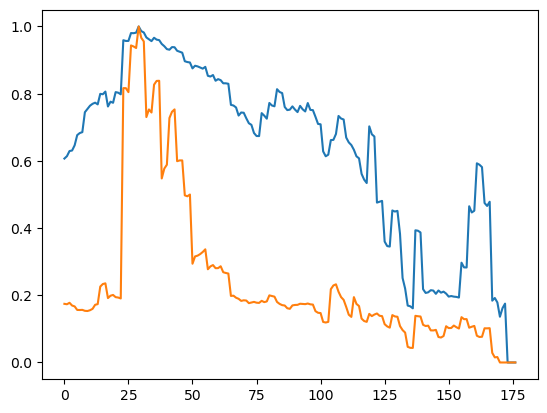

In [592]:
plt.plot(Yzbcorrsto30c.flatten())
plt.plot(Yxbcorrsto30c.flatten())

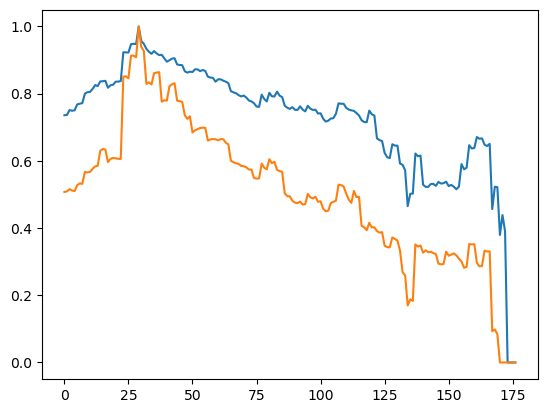

In [576]:
plt.plot(Yzbcorrsto30.flatten())
plt.plot(Yxbcorrsto30.flatten())

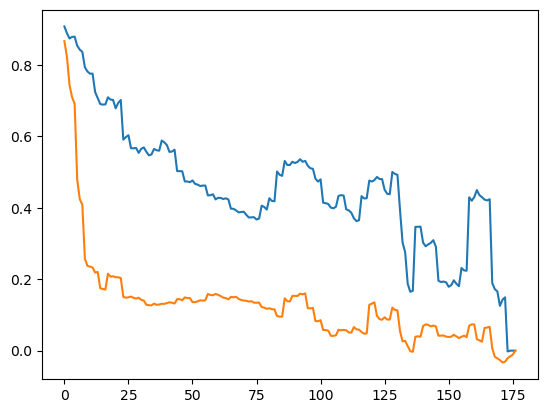

In [296]:
plt.plot(Yzcorrsto0.flatten())
plt.plot(Yxcorrsto0.flatten())

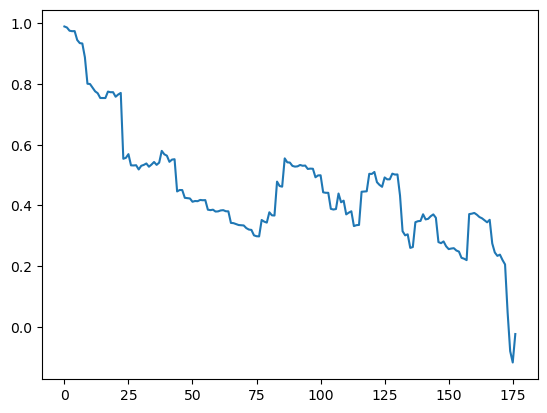

In [221]:
plt.plot(Yzcorrsto0.flatten())

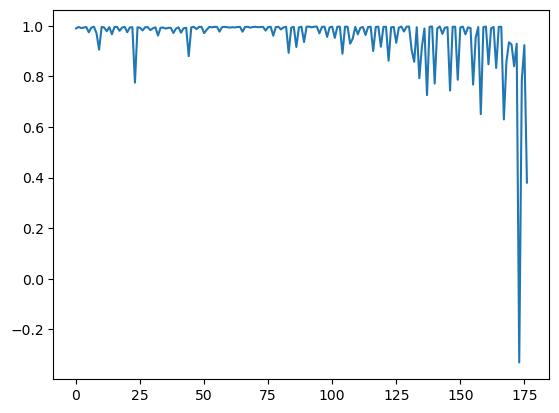

In [220]:
plt.plot(Yzcorrs.flatten())

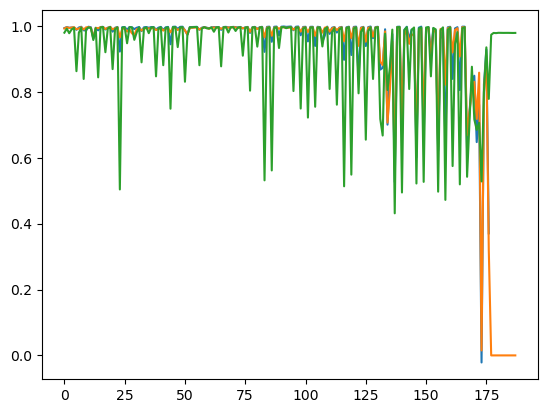

In [192]:
plt.plot(Yzcorrs.flatten())
plt.plot(Yycorrs.flatten())
plt.plot(Yxcorrs.flatten())

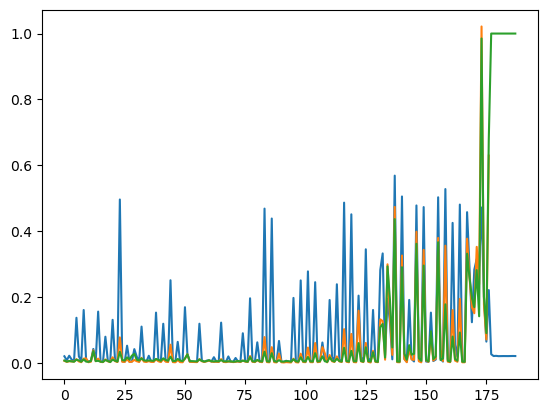

In [197]:
plt.plot(1-Yxcorrs.flatten())
plt.plot(1-Yzcorrs.flatten())
plt.plot(1-Yycorrs.flatten())

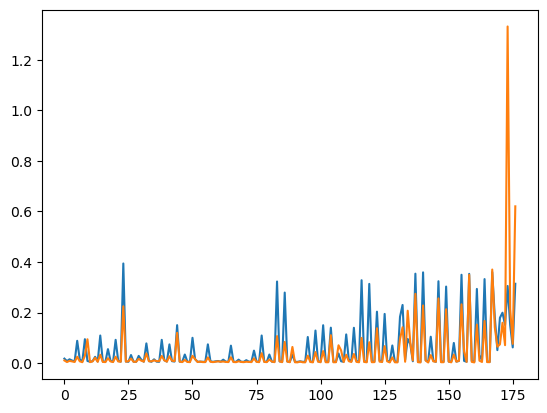

In [206]:
plt.plot(1-Yxcorrs.flatten())
plt.plot(1-Yzcorrs.flatten())
#plt.plot(1-Yycorrs.flatten())

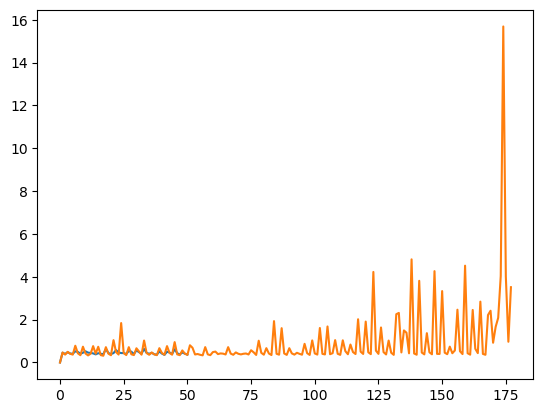

In [194]:
plt.plot(magss)
plt.plot(magss2)

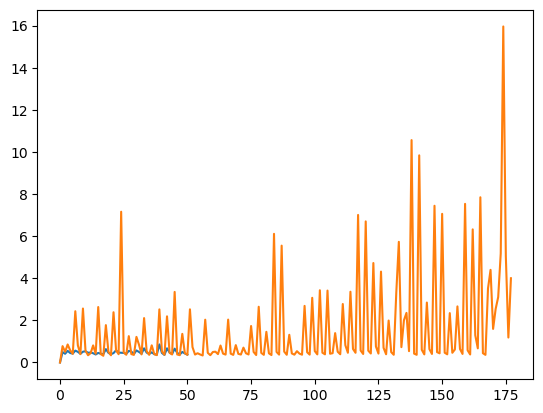

In [195]:
plt.plot(magss4)
plt.plot(magss3)

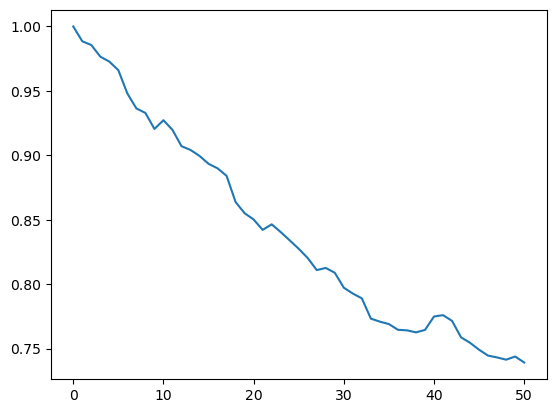

In [78]:
plt.plot(Yzcorrs.flatten())

In [ ]:
# so far this is all with fluorescence, not probmaps! apply warps to probmaps, or rerun cellpose post-warp??
# actually no - the correct thing is to apply the translations to the probmaps and just calculate those (for this portion of warp quantification)
# although - looks like the probmaps 

In [ ]:
chunkMeans = 6
n_cores = 10

data_dir_ds_l = [r'\\nasquatch\data\2p\peter\dipping\20230819_PL43\wells001\preprocessing\20230819_PL43_wells001',
                 r'\\nasquatch\data\2p\peter\dipping\20230819_PL43\wells101\preprocessing\20230819_PL43_wells101']
raw_path_l = [r'\\nasquatch\data\2p\peter\dipping\20230819_PL43\PL43_230819_001_full_wch0_aniso4_scale4AFS2PL4_toref34_wxy.npy',
             r'\\nasquatch\data\2p\peter\dipping\20230819_PL43\PL43_230819_101_full_wch0_aniso4_scale4AFS2PL4_toref31_wxy.npy']

zmt_l = [(3,27,52,0,None),(3,25,52,0,None)]

n_range_l = [None,None]

warp_ch0_l = [True,True]

In [ ]:
for m in trange(0,len(data_dir_ds_l)):
    data_dir_ds = data_dir_ds_l[m]
    raw_path = raw_path_l[m]
    z1 = zmt_l[m][0]
    z2 = zmt_l[m][1]
    mov_means = zmt_l[m][2]
    t1 = zmt_l[m][3]
    t2 = zmt_l[m][4]
    warp_ch0 = warp_ch0_l[m]
    
    data_dir_ds = data_dir_ds.replace(f'\\',f'/')
    raw_path = raw_path.replace(f'\\',f'/')

    n_range = n_range_l[m]

    data_dir = os.path.dirname(os.path.dirname(data_dir_ds))
    if warp_ch0:
        fnamex = data_dir+f'/segtrack/tiffs/ch0/'+str(mov_means)+f'_mean_warped_ch0/means_movie.npy'
    else:
        fnamex = data_dir+f'/segtrack/tiffs/ch0/'+str(mov_means)+f'_mean_warped_/means_movie.npy'
    Yx = np.load(fnamex,mmap_mode='r+')
    Yx = Yx.transpose([0,2,3,1])
    Yx = Yx[t1:t2,:,:,z1:z2]
    
    Yz = np.min(Yx,axis=0)
    Yz = np.array(Yz!=0,order='C')
    Yd = np.min(Yz,axis=2)
    vgrid2 = lir.lir(np.array(Yd,order='C'))
    vgrid2[2] = vgrid2[0]+vgrid2[2]
    vgrid2[3] = vgrid2[1]+vgrid2[3]
    Yxx = Yx[:,vgrid2[1]:vgrid2[3],vgrid2[0]:vgrid2[2],:]
    dims = Yxx.shape[1:]

    fnamef = raw_path
    Yf = np.load(fnamef,mmap_mode='r+')
    Yf = Yf.transpose([0,4,1,2,3])
    ch = 0

    t1m = t1*mov_means
    try:
        t2m = t2*mov_means
    except:
        t2m = None
    Yf = Yf[ch,t1m:t2m,vgrid2[1]:vgrid2[3],vgrid2[0]:vgrid2[2],z1:z2]

    fnamez = data_dir_ds+f'/ch0_means_movie_bg.tif'
    Yxy2bg = imread(fnamez)

    base_name='D://pkalugin/memmap_cache/' + os.path.split(fnamef)[1][:-4] + '_nobg/memmap_'
    T, dims = Yf.shape[0], Yf.shape[1:]
    order='C'
    fname_tot = cm.paths.generate_fname_tot(base_name, dims, order)
    save_path = Path(fname_tot).parent
    save_path.mkdir(parents=True,exist_ok=True)

    big_mov = np.memmap(fname_tot, 
                dtype=np.float32, 
                mode='w+', 
                shape=cm.mmapping.prepare_shape((np.prod(dims),T)), 
                order='C')
    del big_mov
    big_mov = np.memmap(fname_tot, 
                dtype=np.float32, 
                mode='r+', 
                shape=cm.mmapping.prepare_shape((np.prod(dims),T)), 
                order='C')

    def interp_loop(big_mov,i):
        #big_mov = np.memmap(fname_tot, 
        #            dtype=np.float32, 
        #            mode='r+', 
        #            shape=cm.mmapping.prepare_shape((np.prod(dims),T)), 
        #            order='C')
        if i==0:
            dbounds = [0,chunkMeans+1] # range of bg to load
            ebounds = [0,mov_means*chunkMeans] # range of upsampled bg to keep
            sbounds = [0,mov_means*chunkMeans] # range of Yf to load
        elif i==(Yxy2bg.shape[0]-1) - ((Yxy2bg.shape[0]-1) % chunkMeans):
            dbounds = [i-1,Yxy2bg.shape[0]]
            ebounds = [mov_means,(Yxy2bg.shape[0]-i+1)*mov_means]
            sbounds = [i*mov_means,Yf.shape[0]]
        else:
            dbounds = [i-1,i+chunkMeans+1]
            ebounds = [mov_means,(chunkMeans+1)*mov_means]
            sbounds = [i*mov_means,(i+chunkMeans)*mov_means]
        Ytemp = Yf[sbounds[0]:sbounds[1],...]
        Ybgtemp = st.rescale(Yxy2bg[dbounds[0]:dbounds[1],...],(mov_means,1,1,1),order=1,mode='edge',clip=False,preserve_range=True) # 5:17 min chunk 10, ~3:30 min chunk 5 (~11 GB)
        if ebounds[1]-ebounds[0] < Ytemp.shape[0]:
            Ybgtemp = np.concatenate((Ybgtemp,np.repeat(Ybgtemp[Ybgtemp.shape[0]-1,...][np.newaxis,:,:,:],Ytemp.shape[0]-ebounds[1]+ebounds[0],axis=0)),dtype=Ybgtemp.dtype)
            ebounds[1] = Ybgtemp.shape[0]
        Ttemp, dimstemp = Ytemp.shape[0], Ytemp.shape[1:]
        Ytempnobg = np.transpose((Ytemp - Ybgtemp[ebounds[0]:ebounds[1],...]),list(range(1, len(dimstemp) + 1)) + [0]) #~20 GB chunk 10? ~14 GB chunk 5 (peak)
        #Ytempnobg = np.transpose(np.multiply((Ytemp - Ybgtemp[ebounds[0]:ebounds[1],...]),bmaskz),list(range(1, len(dimstemp) + 1)) + [0]) #bmaskz doubles ram usage - unnecessary for refit
        del Ybgtemp
        Ytempnobg = Ytempnobg.reshape((np.prod(dimstemp),Ttemp),order='F')
        Ytempnobg = np.ascontiguousarray(Ytempnobg,dtype=np.float32) + np.float32(0.0001)
        big_mov[:,sbounds[0]:sbounds[1]] = Ytempnobg
        #del big_mov, Ytemp, Ytempnobg
        del Ytemp, Ytempnobg
    
    with tqdm_joblib(tqdm(desc="Subtracting background...", total=len(range(0,Yxy2bg.shape[0],chunkMeans)))) as progress_bar:
        Parallel(n_jobs=n_cores,batch_size=1,temp_folder="D:/pkalugin/temp")(delayed(interp_loop)(big_mov,i) for i in range(0,Yxy2bg.shape[0],chunkMeans))
    get_reusable_executor().shutdown(wait=True)
    del big_mov

    fname_new = cm.paths.fn_relocated(fname_tot + f'_frames_{cm.mmapping.prepare_shape((np.prod(dims),T))[1]}.mmap')
    os.rename(fname_tot, fname_new)